In [3]:
import polars as pl
from record_consolidation.graphs import (
    unconsolidated_df_to_subgraphs,
)
from record_consolidation.subgraph_post_processing.specific_algs.partition_via_cluster_ensemble import (
    partition_subgraphs,
)
from record_consolidation.utils.draw_graph import draw_graph

import networkx as nx

In [5]:
# votes: pl.DataFrame = access_db_table("raw_output", "votes")
votes: pl.DataFrame = pl.read_parquet("raw_votes.parquet")
COMPANY_COLS = pl.col(["issuer_name", "cusip", "isin", "figi"])
MEETING_COLS = pl.col(["issuer_name", "meeting_date", "cusip", "isin", "figi"])

In [6]:
unprocessed_subgraphs = list(
    unconsolidated_df_to_subgraphs(
        votes.select(COMPANY_COLS),  # .head(100),
        weight_edges=True,
        connected_subgraphs_postprocessor=None,
    )
)

In [7]:
from typing import Iterable
from warnings import warn


def extract_specific_name_subgraph(
    connected_subgs: Iterable[nx.Graph], name: str
) -> nx.Graph:
    collected: list[nx.Graph] = []
    for subg in connected_subgs:
        for n in subg.nodes.data():
            if name.lower() in (n[0]).lower():
                collected.append(subg)
    collected = set(collected)
    if len(collected) == 0:
        raise ValueError(f"Could not find {name=} in connected_subgs.")
    if len(collected) > 1:
        alert_str = f"{len(collected)} subgraphs have {name=}.\n{[len(subg.nodes) for subg in collected]=}"
        warn(alert_str)
        return max(collected, key=lambda g: len(g.nodes))

        # raise ValueError(alert_str)
    return tuple(collected)[0]

In [33]:
def graph_nodes_to_polars_df(graph: nx.Graph, pivot: bool = False) -> pl.DataFrame:
    """
    Converts the nodes of a NetworkX graph into a Polars DataFrame.

    Args:
        graph (nx.Graph): The NetworkX graph.

    Returns:
        pl.DataFrame: The resulting Polars DataFrame.
    """
    # Extract node data as (node, attr_dict) tuples
    node_data = graph.nodes(data=True)

    # Convert to a list of dictionaries, including the node name
    records = [{"node_name": node, **attrs} for node, attrs in node_data]

    # Create and return the Polars DataFrame
    df = pl.DataFrame(records)

    if pivot:
        return df.pivot(
            on="field",
            values="node_name",
            # index="node_name",
            aggregate_function="first",
        )
    return df

In [8]:
msft = extract_specific_name_subgraph(unprocessed_subgraphs, "microsoft")
goldman = extract_specific_name_subgraph(unprocessed_subgraphs, "goldman sachs")

/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_14844/942150125.py:18: UserWarning: 3 subgraphs have name='goldman sachs'.
[len(subg.nodes) for subg in collected]=[4, 5, 23]
  warn(alert_str)


In [41]:
graph_nodes_to_polars_df(msft).filter(pl.col("field") == pl.lit("figi"))[
    "node_name"
].unique().to_list()

['BBG01BFR8YV1', 'BBG000BPH459', 'BBG000BLNPB7', 'BBG001S5TD05']

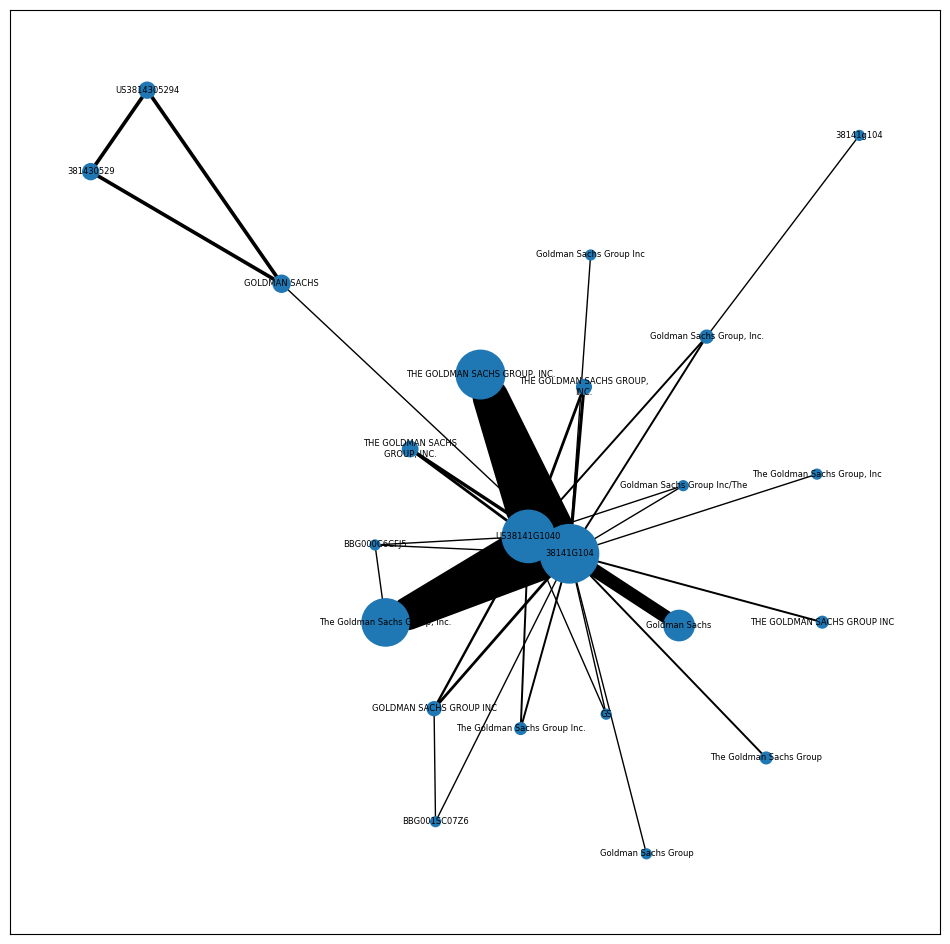

In [6]:
draw_graph(goldman)

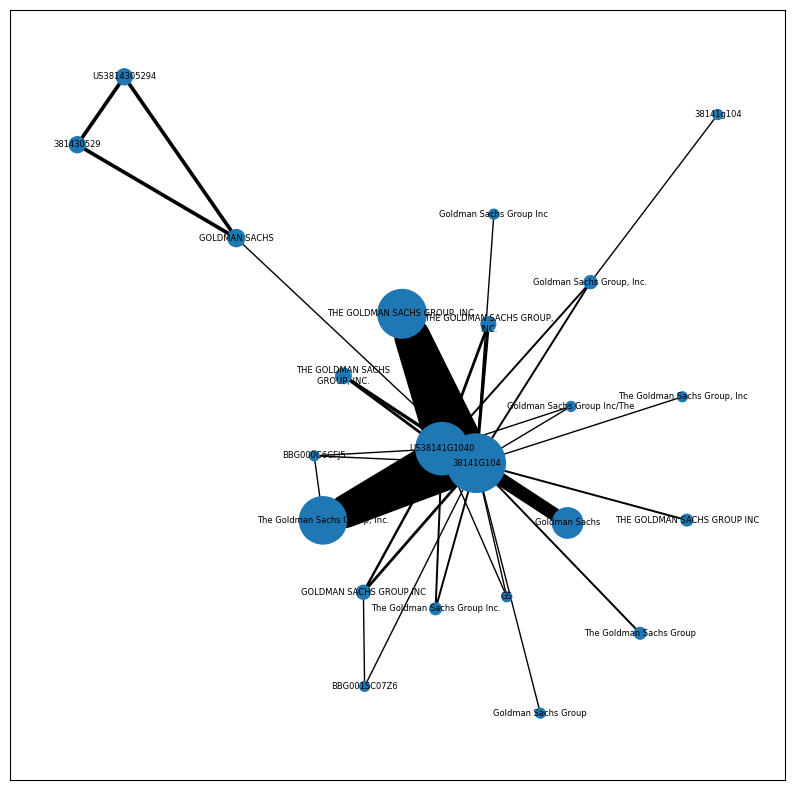

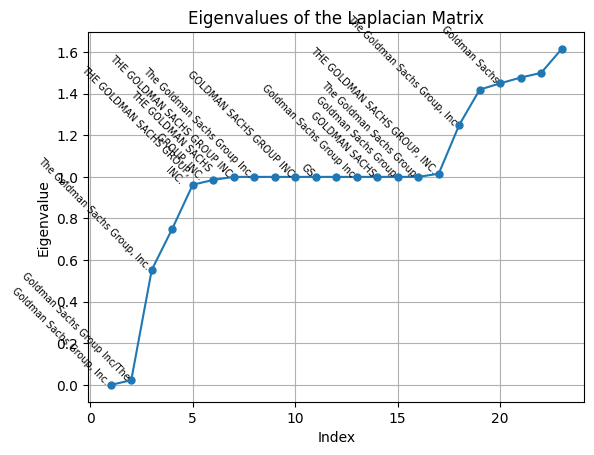

sorted(eigenvalues)[:5]=[3.008526838015668e-16, 0.022726819900018902, 0.5531203276818668, 0.7505199784270263, 0.9623745226276355]
k=2
---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
Performing k-means clustering


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:148: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")
/Users/mgaster/repos/record-consolidation/.venv/lib/python3.12/site-packages/networkx/drawing/nx_pylab.py:450: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


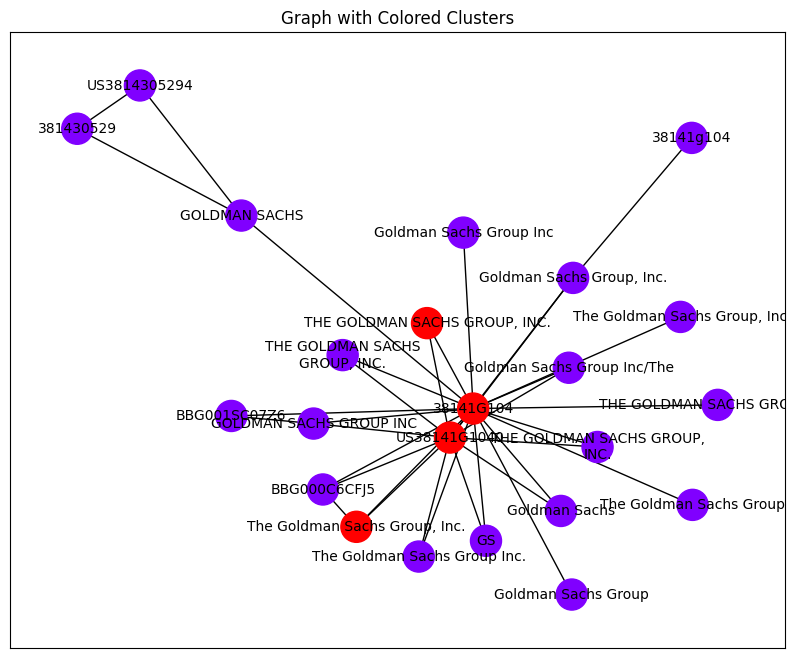

Removed edge between Goldman Sachs Group, Inc. and 38141G104 (different clusters)
Removed edge between Goldman Sachs Group, Inc. and US38141G1040 (different clusters)
Removed edge between Goldman Sachs Group Inc/The and 38141G104 (different clusters)
Removed edge between Goldman Sachs Group Inc/The and US38141G1040 (different clusters)
Removed edge between The Goldman Sachs Group, Inc. and BBG000C6CFJ5 (different clusters)
Removed edge between 38141G104 and GOLDMAN SACHS GROUP INC (different clusters)
Removed edge between 38141G104 and Goldman Sachs Group Inc (different clusters)
Removed edge between 38141G104 and Goldman Sachs (different clusters)
Removed edge between 38141G104 and GOLDMAN SACHS (different clusters)
Removed edge between 38141G104 and THE GOLDMAN SACHS GROUP,
INC. (different clusters)
Removed edge between 38141G104 and THE GOLDMAN SACHS
GROUP, INC. (different clusters)
Removed edge between 38141G104 and BBG000C6CFJ5 (different clusters)
Removed edge between 38141G104 a

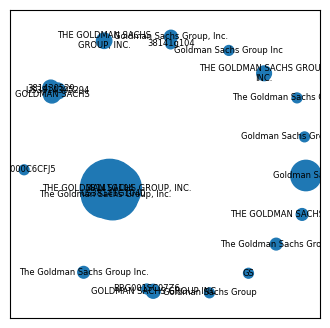

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
Removed node 38141G104 with betweenness centrality 0.7186
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


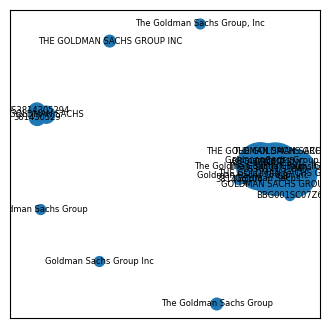

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
i=1
cut_points=['38141G104', 'GOLDMAN SACHS', 'Goldman Sachs Group, Inc.']
shape: (3, 3)
┌───────────────────────────┬────────────────────────┬────────┐
│ point                     ┆ betweenness_centrality ┆ degree │
│ ---                       ┆ ---                    ┆ ---    │
│ str                       ┆ f64                    ┆ i64    │
╞═══════════════════════════╪════════════════════════╪════════╡
│ 38141G104                 ┆ 0.718615               ┆ 2050   │
│ GOLDMAN SACHS             ┆ 0.17316                ┆ 15     │
│ Goldman Sachs Group, Inc. ┆ 0.090909               ┆ 5      │
└───────────────────────────┴────────────────────────┴────────┘
cut_point='38141G104'


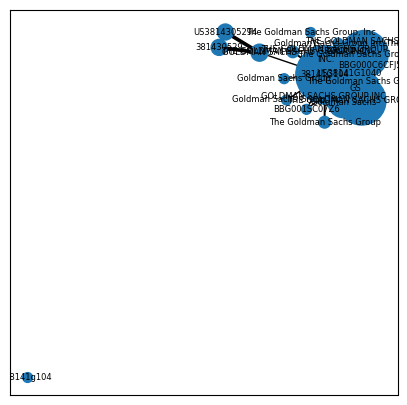

---------------------------------------------------------------------------------------------------- articulation_points score = 0.0 ----------------------------------------------------------------------------------------------------


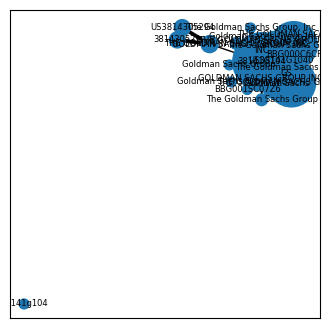

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
eigenvalues=array([4.55622724e-17, 1.29255725e-01])
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


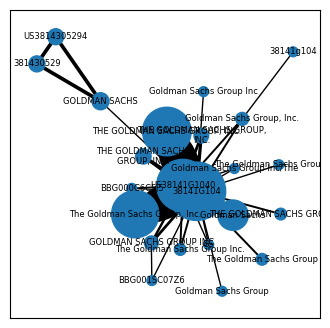

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
Louvain detected 4 communities
Severing edges between different communities:
[('Goldman Sachs Group, Inc.', '38141G104'), ('Goldman Sachs Group, Inc.', 'US38141G1040'), ('38141G104', 'GOLDMAN SACHS GROUP INC'), ('38141G104', 'GOLDMAN SACHS'), ('38141G104', 'BBG001SC07Z6'), ('GOLDMAN SACHS GROUP INC', 'US38141G1040')] 
---------------------------------------------------------------------------------------------------- louvain score = 0 ----------------------------------------------------------------------------------------------------


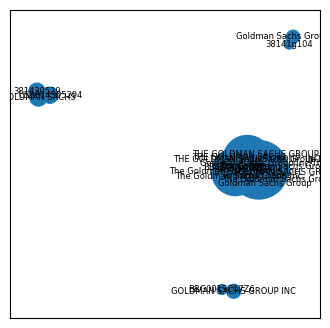

/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:352: UserWarning: Returning unmodified graph, because `best_score` == 0
k=2
best_score=0
method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.0, 'spectral_clustering': 0, 'louvain': 0}
  warn(warning_str)


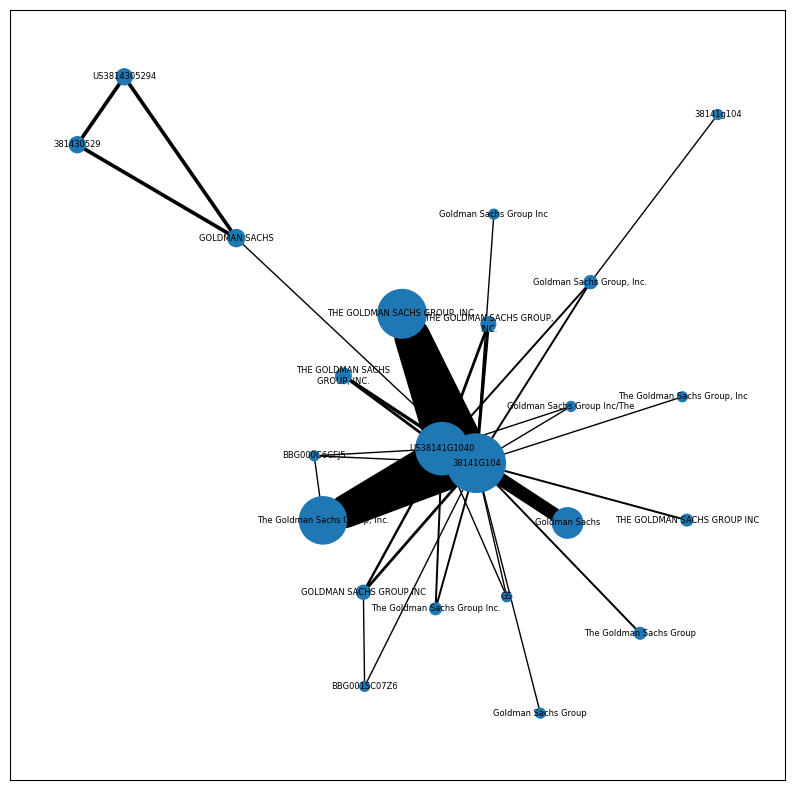

In [7]:
partition_companies_graph_where_necessary(
    goldman, "n_0val_eigeinvalues", "betweenness_centrality", verbose_within_partitioning_algs=True
)

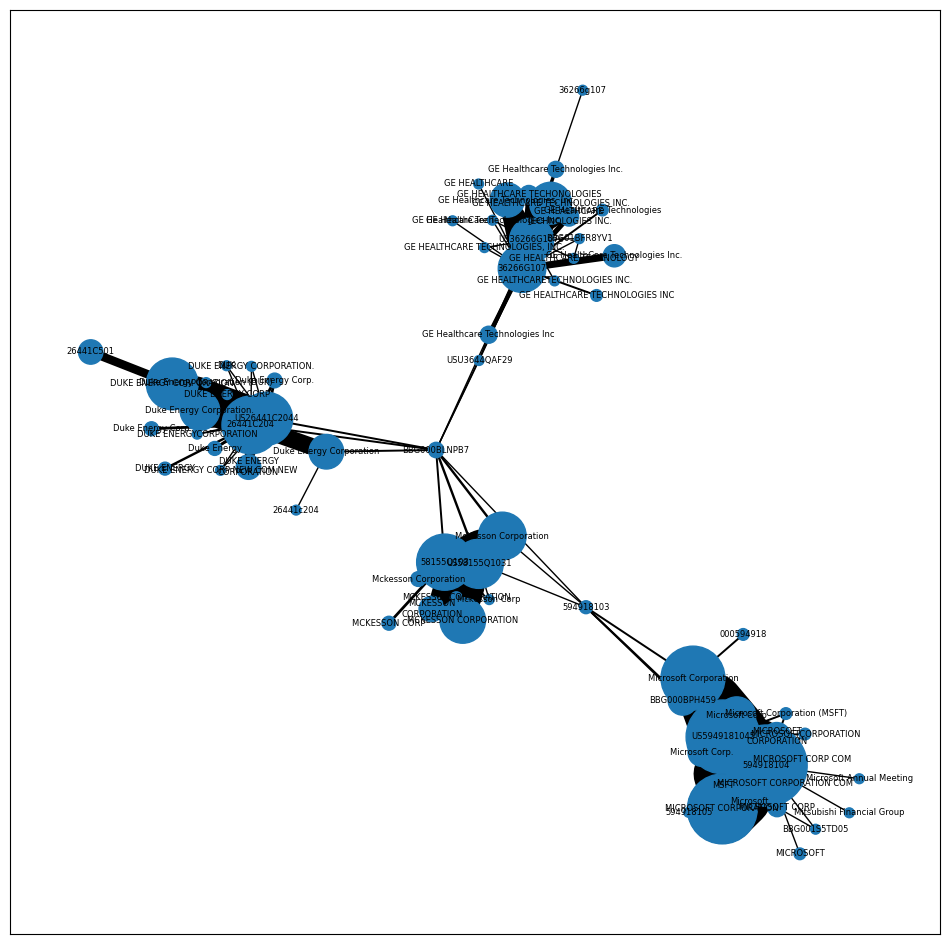

In [8]:
draw_graph(msft)

In [9]:
# del partition_companies_graph_where_necessary

# from record_consolidation.subgraph_post_processing.specific_algs.partition_companies import (
#     partition_companies_graph_where_necessary,
# )

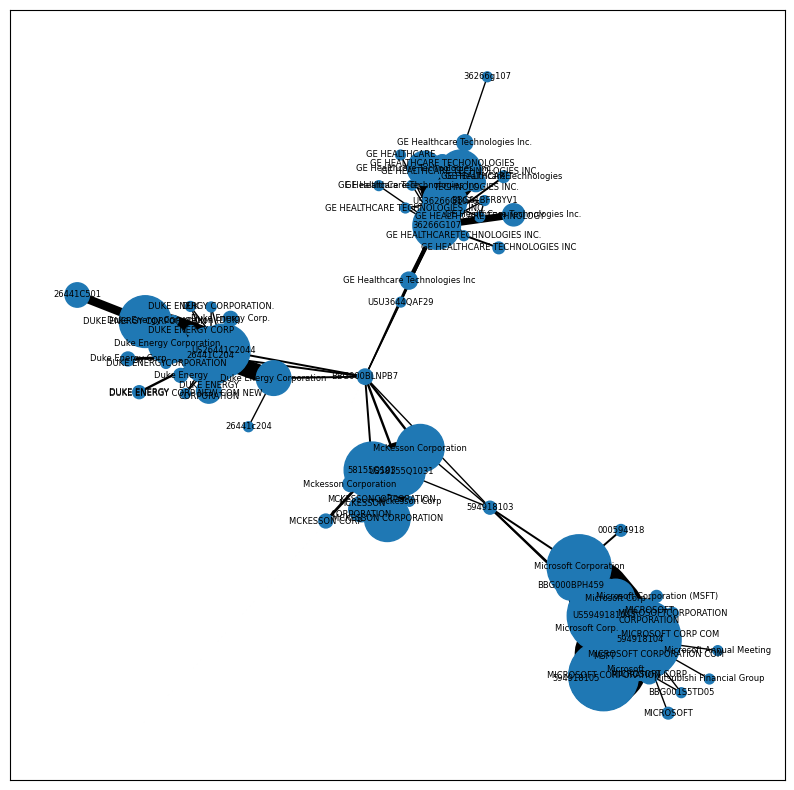

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:148: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


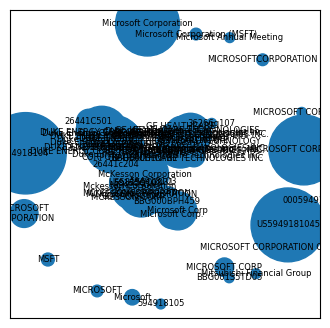

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


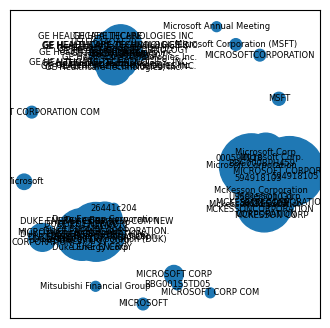

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.552 ----------------------------------------------------------------------------------------------------


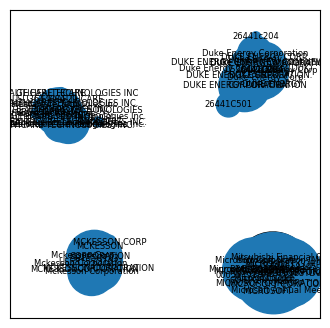

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


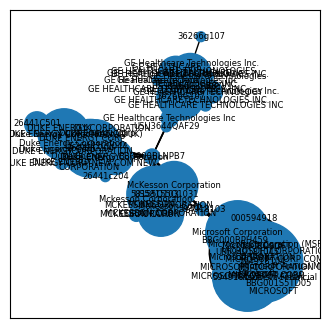

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.552 ----------------------------------------------------------------------------------------------------


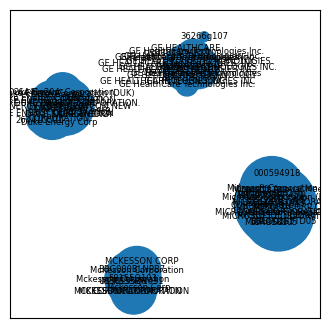

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.5522988572238422, 'spectral_clustering': 0, 'louvain': 0.5524596116724492}
best_method='louvain'


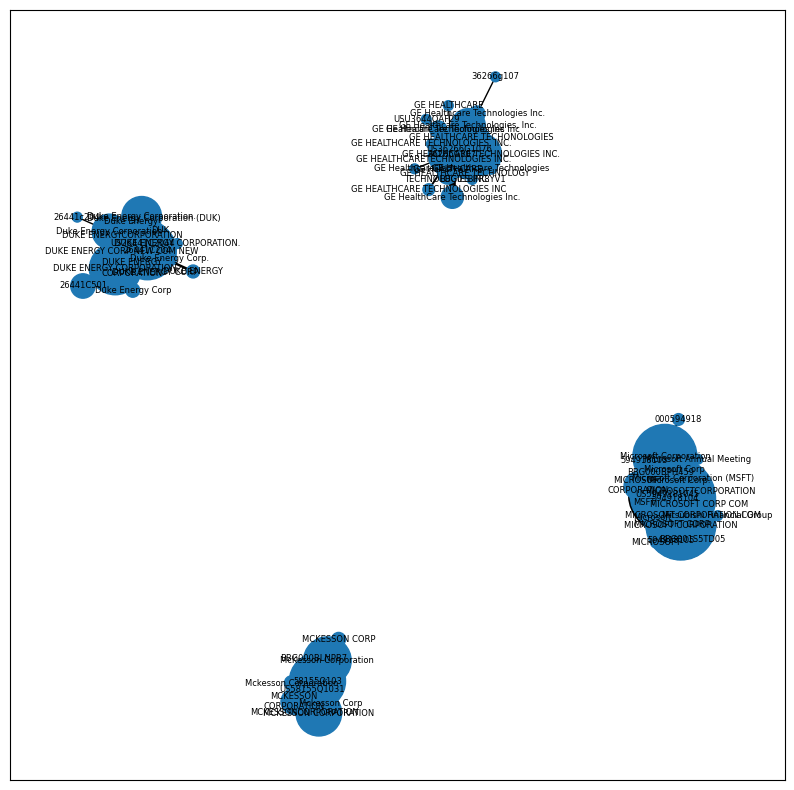

In [10]:
partition_companies_graph_where_necessary(
    msft, "n_0val_eigeinvalues", "betweenness_centrality", verbose_within_partitioning_algs=False
)

/var/folders/z7/gyrmrn1s10zf6k523_6hg_br0000gn/T/ipykernel_30012/942150125.py:18: UserWarning: 2 subgraphs have name='general electric'.
[len(subg.nodes) for subg in collected]=[10, 32]
  warn(alert_str)


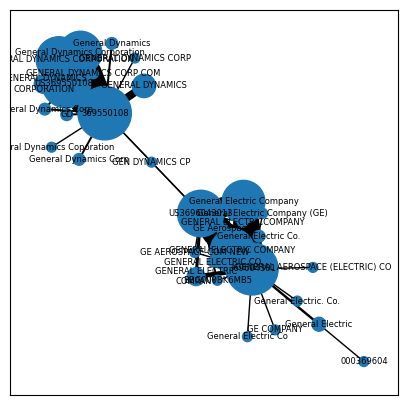

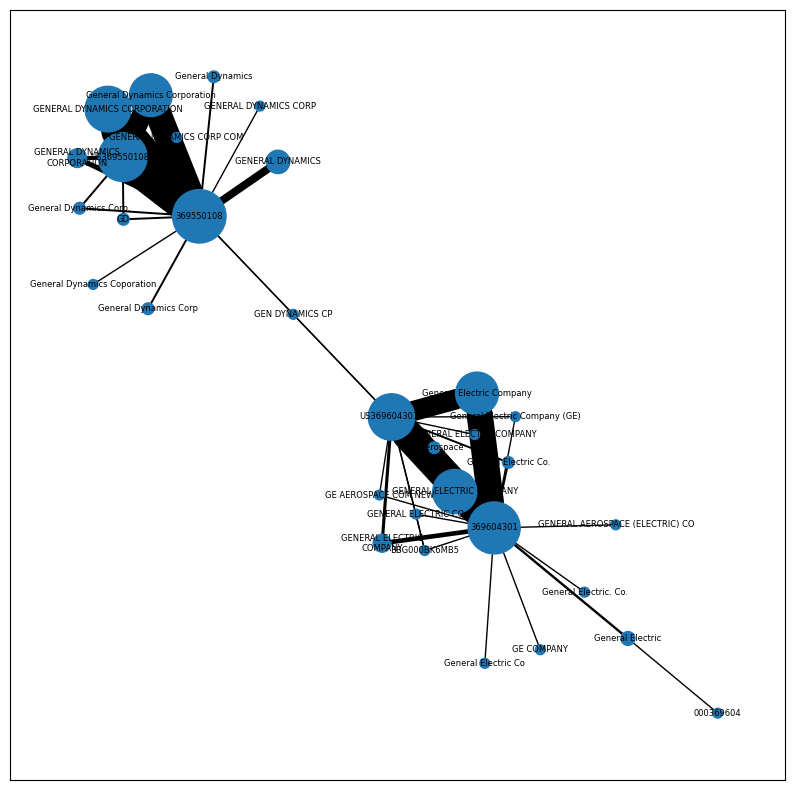

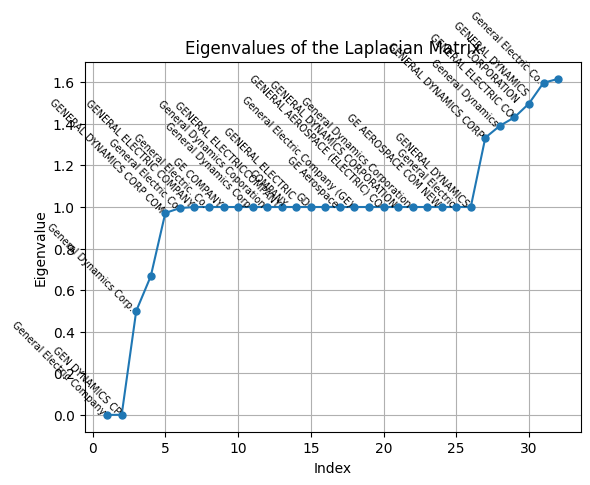

sorted(eigenvalues)[:5]=[2.9305055299493177e-16, 0.0007792678362808109, 0.500093620878063, 0.667265778287933, 0.9711734197216841]
k=2
---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
Performing k-means clustering


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:148: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")
/Users/mgaster/repos/record-consolidation/.venv/lib/python3.12/site-packages/networkx/drawing/nx_pylab.py:450: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


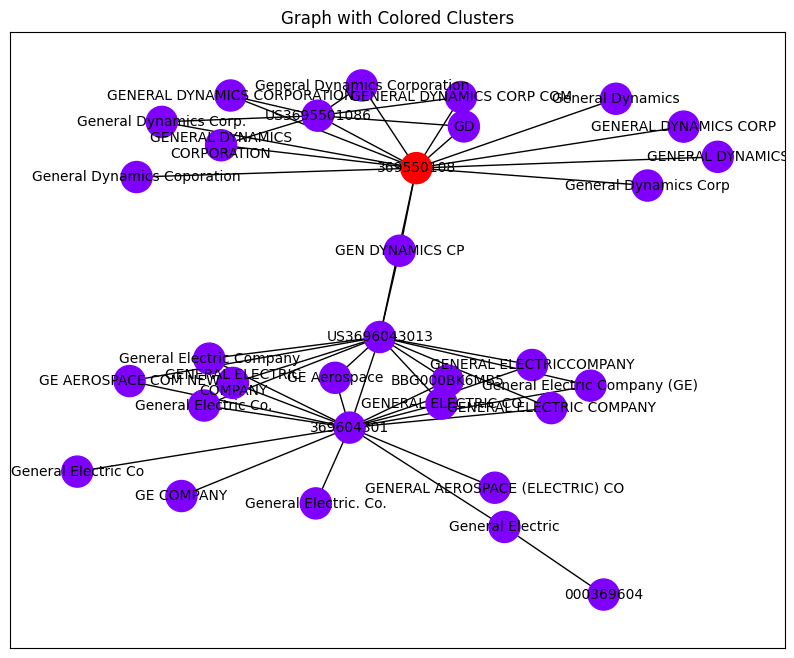

Removed edge between GEN DYNAMICS CP and 369550108 (different clusters)
Removed edge between General Dynamics Corp. and 369550108 (different clusters)
Removed edge between US3695501086 and 369550108 (different clusters)
Removed edge between GENERAL DYNAMICS CORP COM and 369550108 (different clusters)
Removed edge between US3696043013 and 369550108 (different clusters)
Removed edge between General Dynamics Corp and 369550108 (different clusters)
Removed edge between General Dynamics Coporation and 369550108 (different clusters)
Removed edge between GD and 369550108 (different clusters)
Removed edge between 369550108 and General Dynamics Corporation (different clusters)
Removed edge between 369550108 and GENERAL DYNAMICS CORPORATION (different clusters)
Removed edge between 369550108 and General Dynamics (different clusters)
Removed edge between 369550108 and GENERAL DYNAMICS
CORPORATION (different clusters)
Removed edge between 369550108 and GENERAL DYNAMICS (different clusters)
Removed

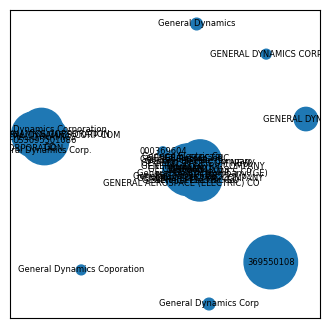

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
Removed node US3696043013 with betweenness centrality 0.6366
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0.399 ----------------------------------------------------------------------------------------------------


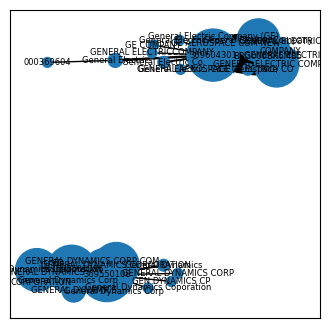

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
i=1
cut_points=['369604301', '369550108', 'US3696043013', 'General Electric']
shape: (4, 3)
┌──────────────────┬────────────────────────┬────────┐
│ point            ┆ betweenness_centrality ┆ degree │
│ ---              ┆ ---                    ┆ ---    │
│ str              ┆ f64                    ┆ i64    │
╞══════════════════╪════════════════════════╪════════╡
│ US3696043013     ┆ 0.636559               ┆ 998    │
│ 369550108        ┆ 0.590323               ┆ 1477   │
│ 369604301        ┆ 0.367742               ┆ 1285   │
│ General Electric ┆ 0.064516               ┆ 4      │
└──────────────────┴────────────────────────┴────────┘
cut_point='US3696043013'


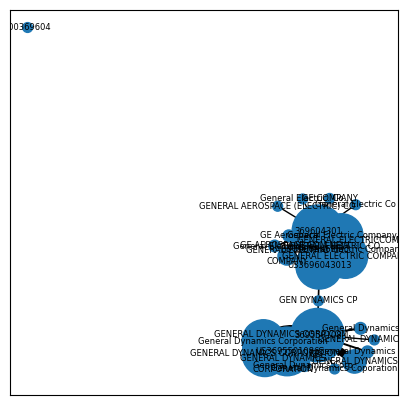

---------------------------------------------------------------------------------------------------- articulation_points score = 0.0 ----------------------------------------------------------------------------------------------------


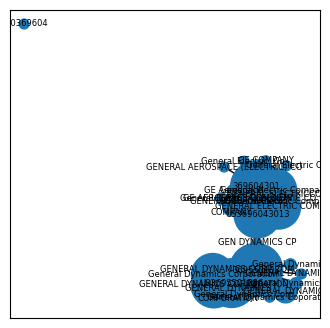

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
eigenvalues=array([6.75622349e-17, 5.53303159e-02])
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


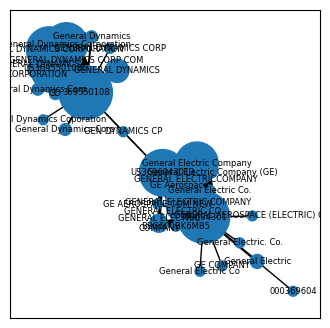

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
Louvain detected 2 communities
Severing edges between different communities:
[('GEN DYNAMICS CP', '369550108'), ('US3696043013', '369550108')] 
---------------------------------------------------------------------------------------------------- louvain score = 0.497 ----------------------------------------------------------------------------------------------------


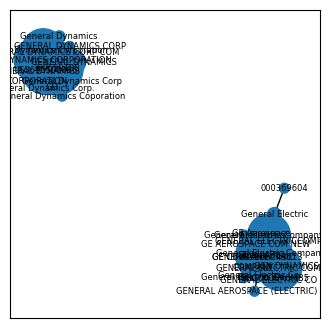

method_scores={'kmeans': 0, 'betweenness_centrality': 0.39929803688280774, 'articulation_points': 0.0, 'spectral_clustering': 0, 'louvain': 0.49718652992153867}
best_method='louvain'


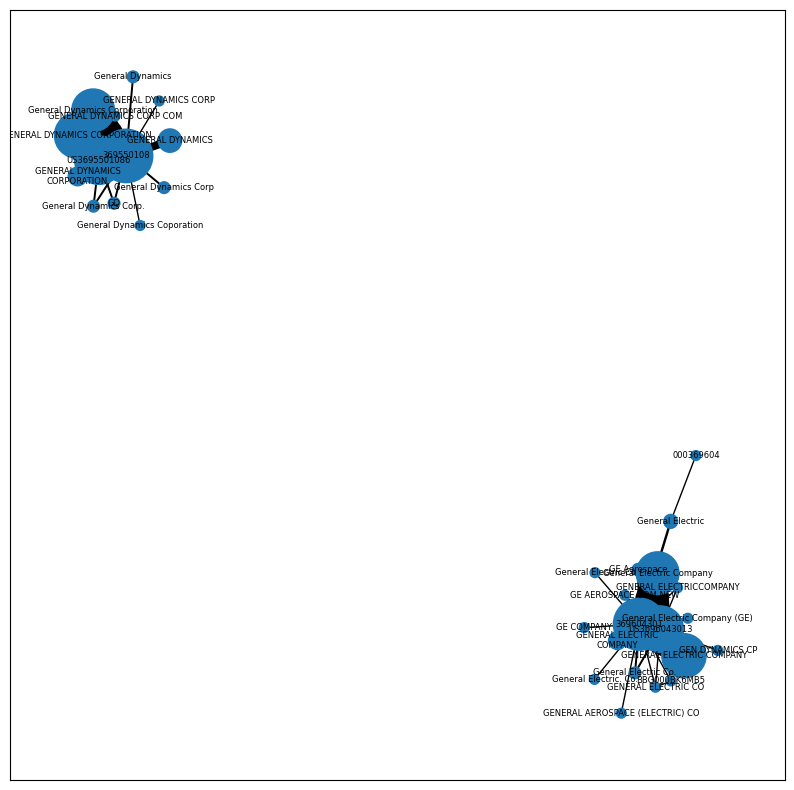

In [13]:
ge = extract_specific_name_subgraph(unprocessed_subgraphs, "general electric")
draw_graph(ge, 5)
partition_companies_graph_where_necessary(
    ge, "n_0val_eigeinvalues", "betweenness_centrality", verbose_within_partitioning_algs=True
)

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


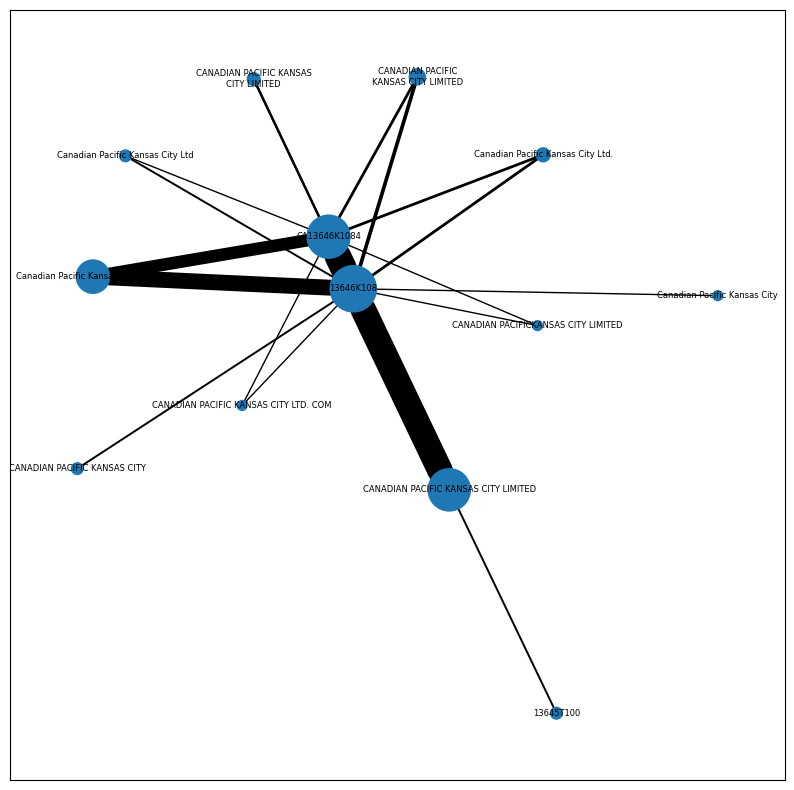

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


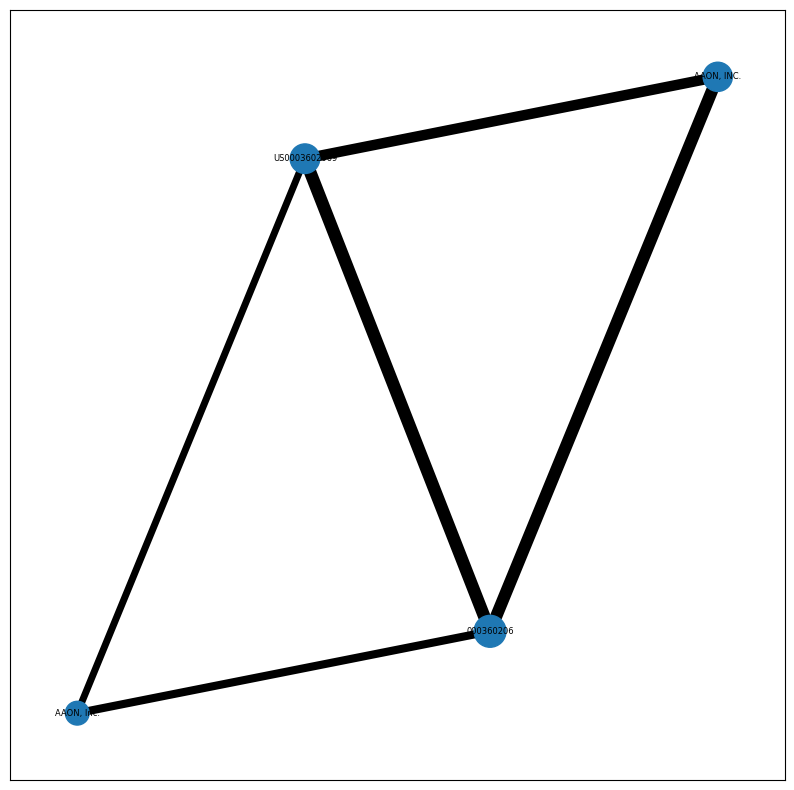

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


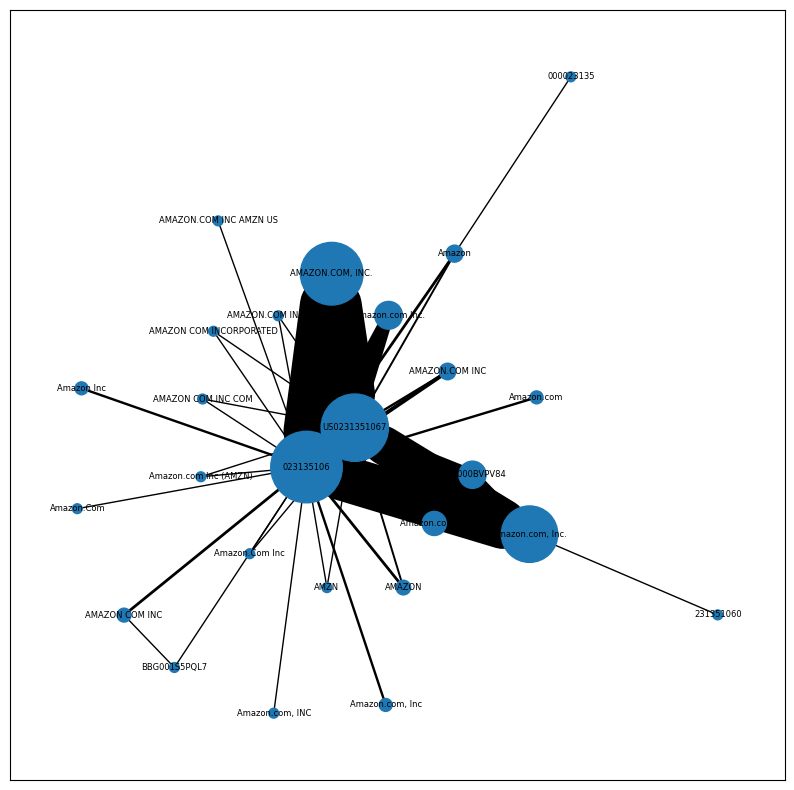

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


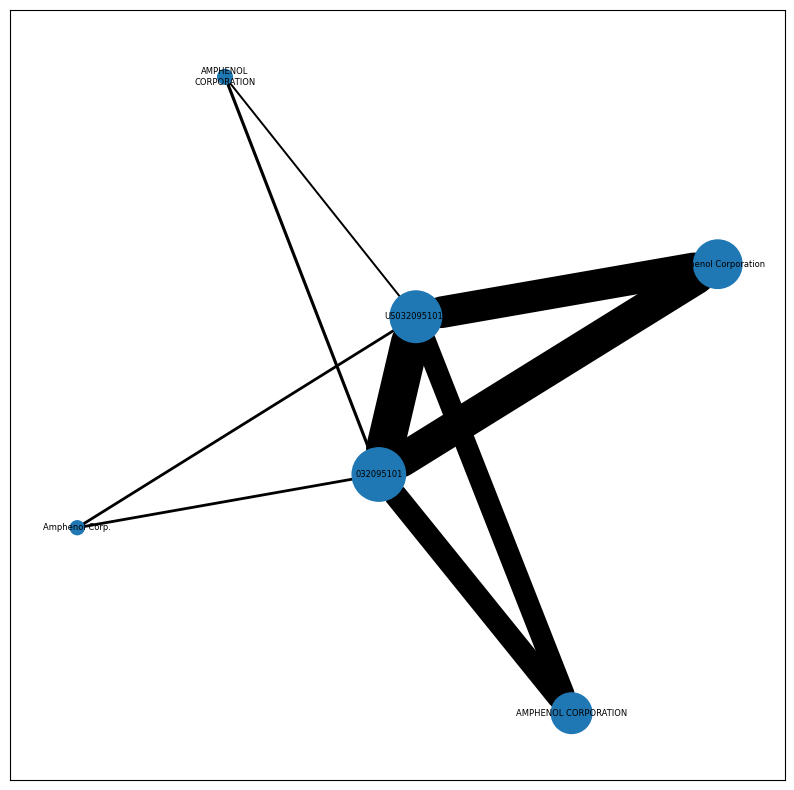

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


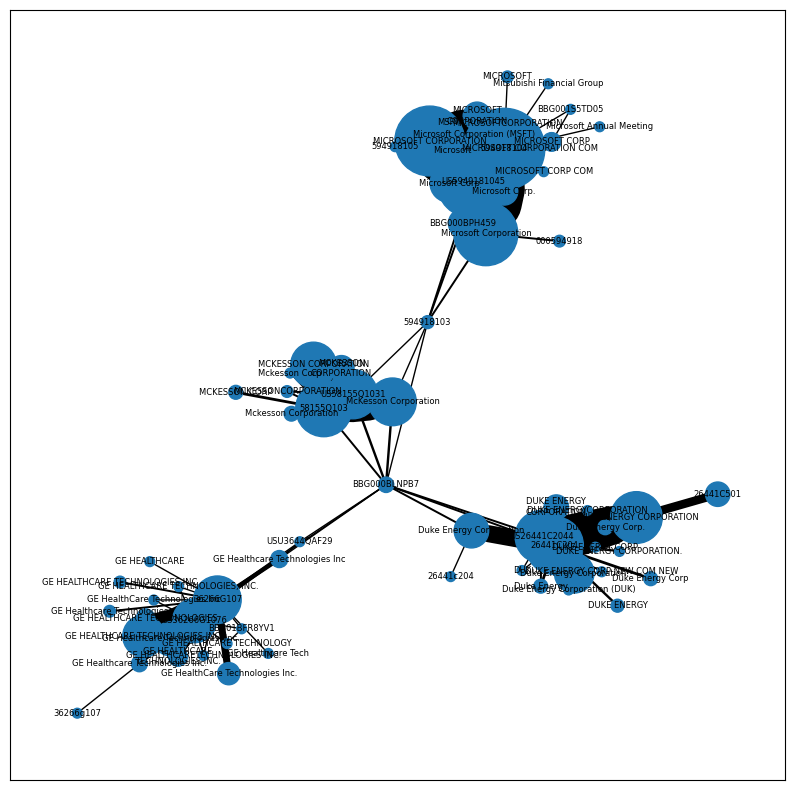

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


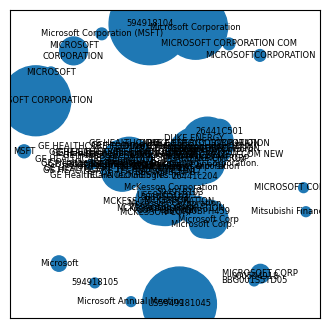

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


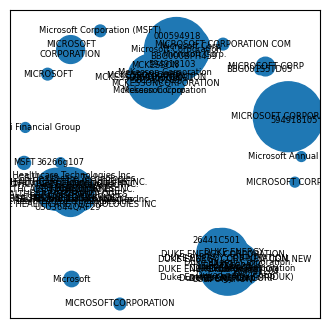

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.552 ----------------------------------------------------------------------------------------------------


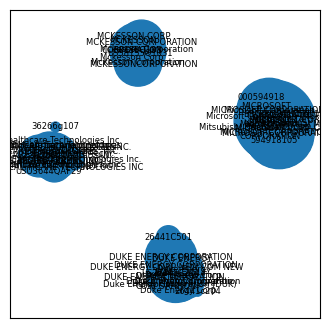

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


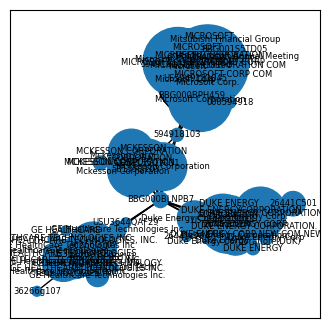

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.553 ----------------------------------------------------------------------------------------------------


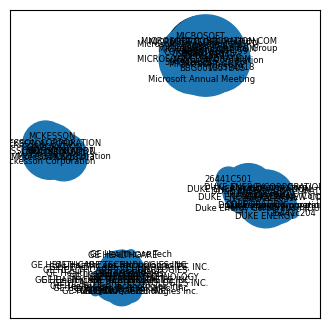

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.5522988572238422, 'spectral_clustering': 0, 'louvain': 0.5526885418880475}
best_method='louvain'


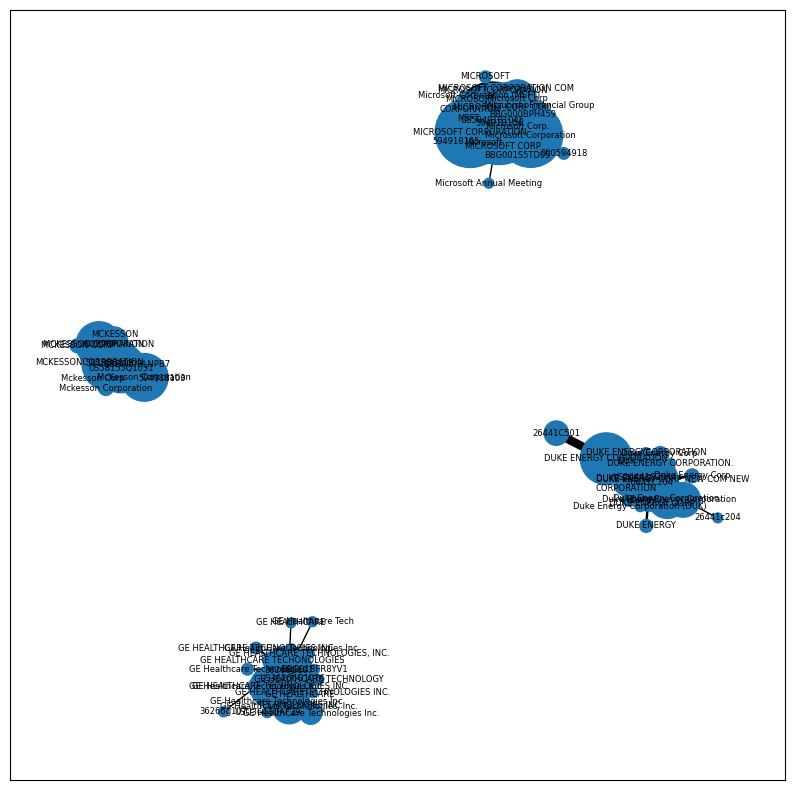

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


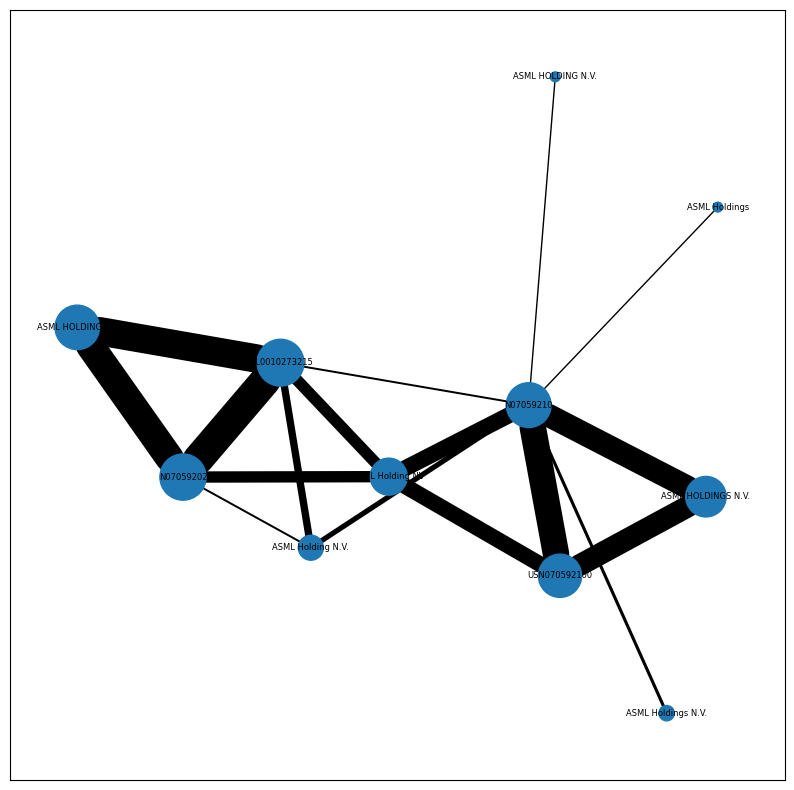

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


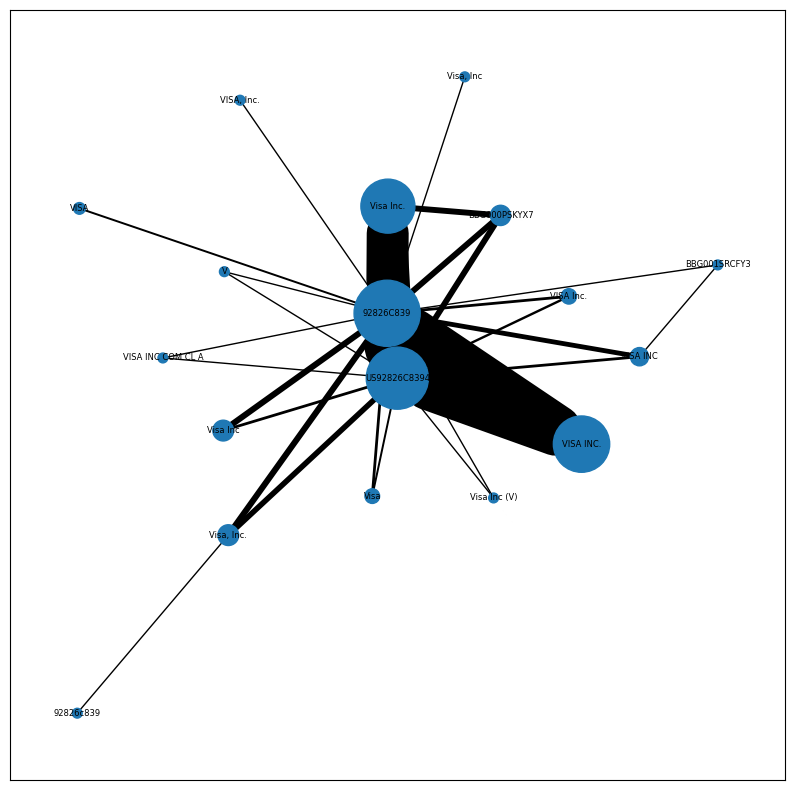

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


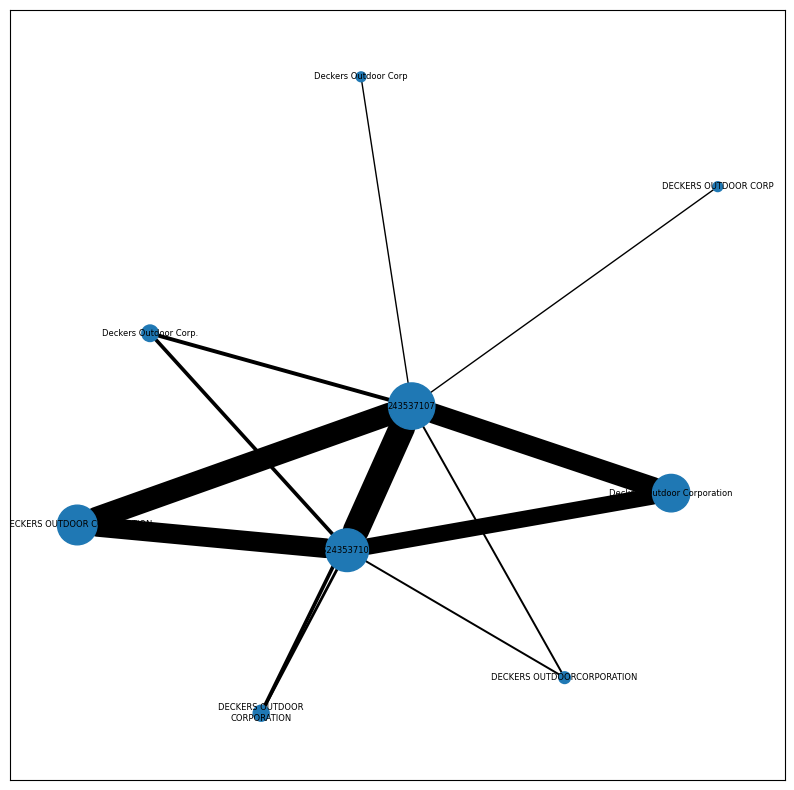

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


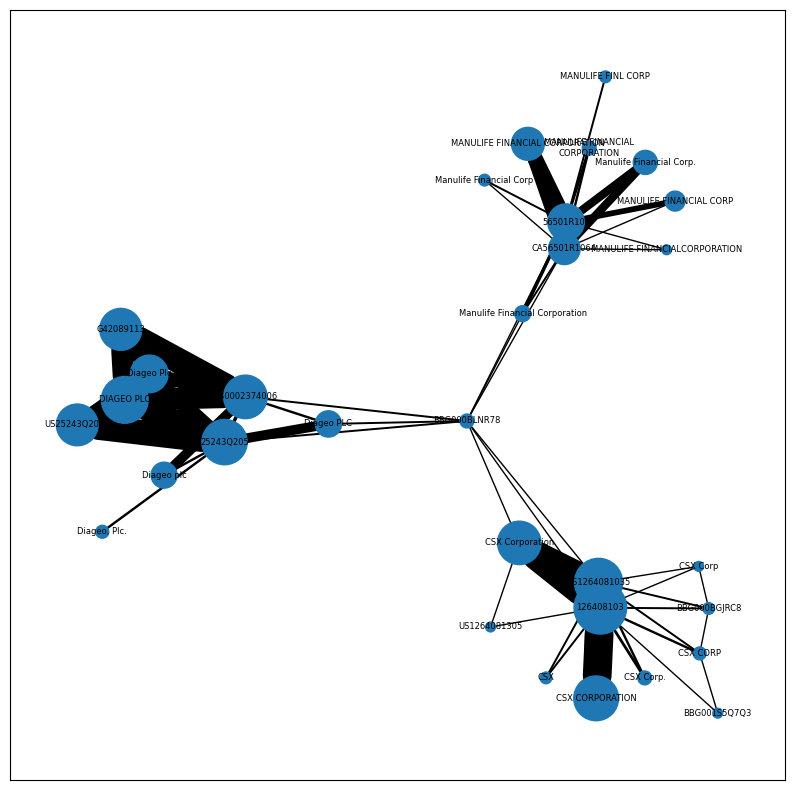

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


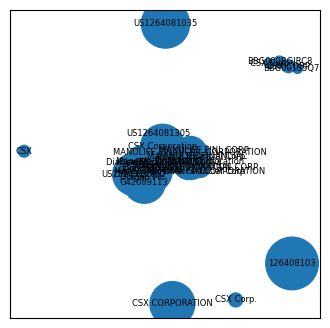

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0.576 ----------------------------------------------------------------------------------------------------


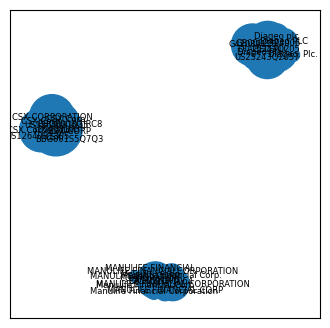

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.576 ----------------------------------------------------------------------------------------------------


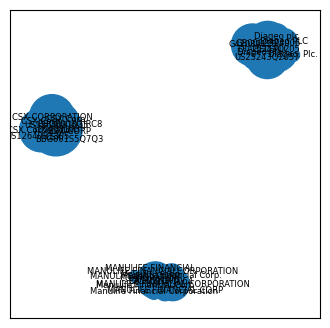

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


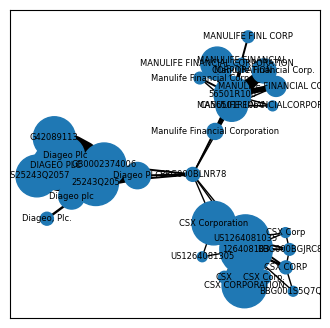

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.577 ----------------------------------------------------------------------------------------------------


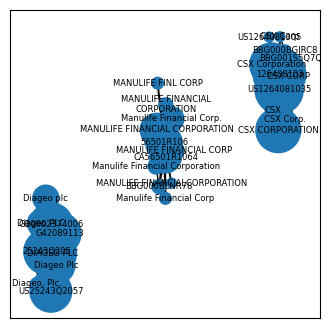

method_scores={'kmeans': 0, 'betweenness_centrality': 0.5762055256165963, 'articulation_points': 0.5762055256165963, 'spectral_clustering': 0, 'louvain': 0.5766465270678062}
best_method='louvain'


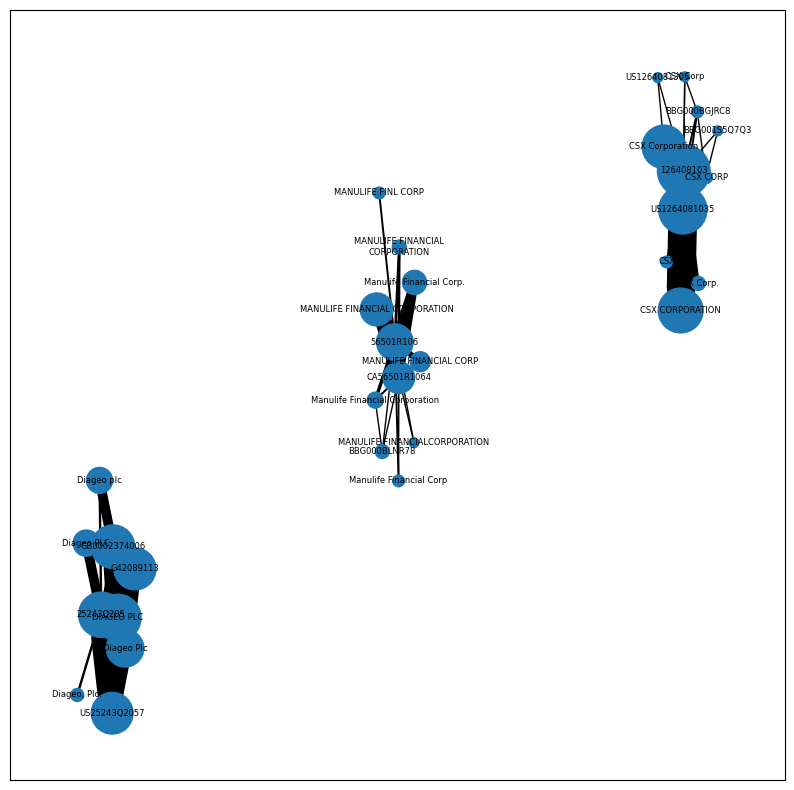

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


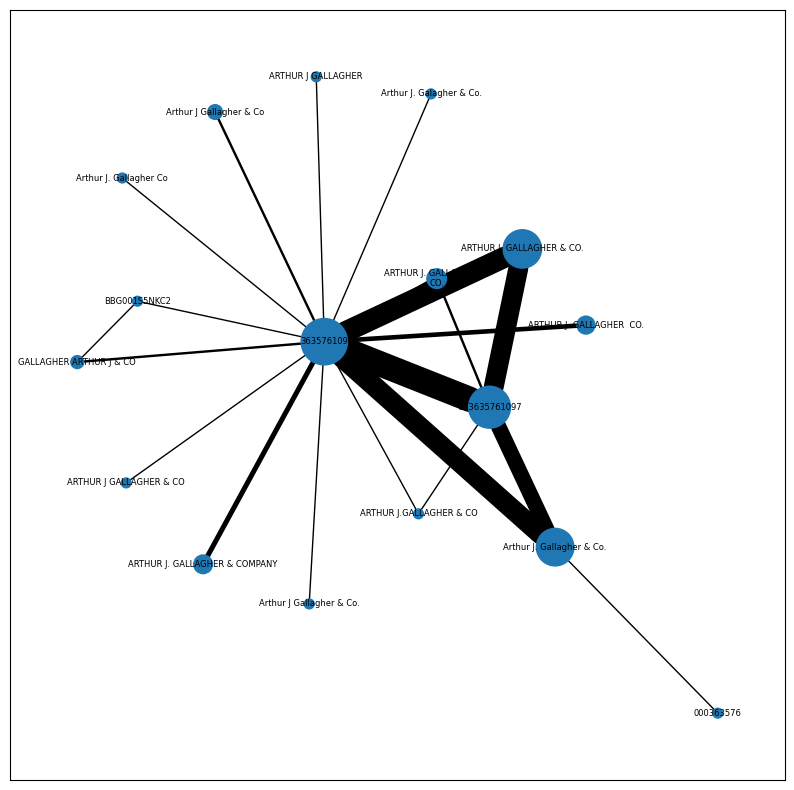

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


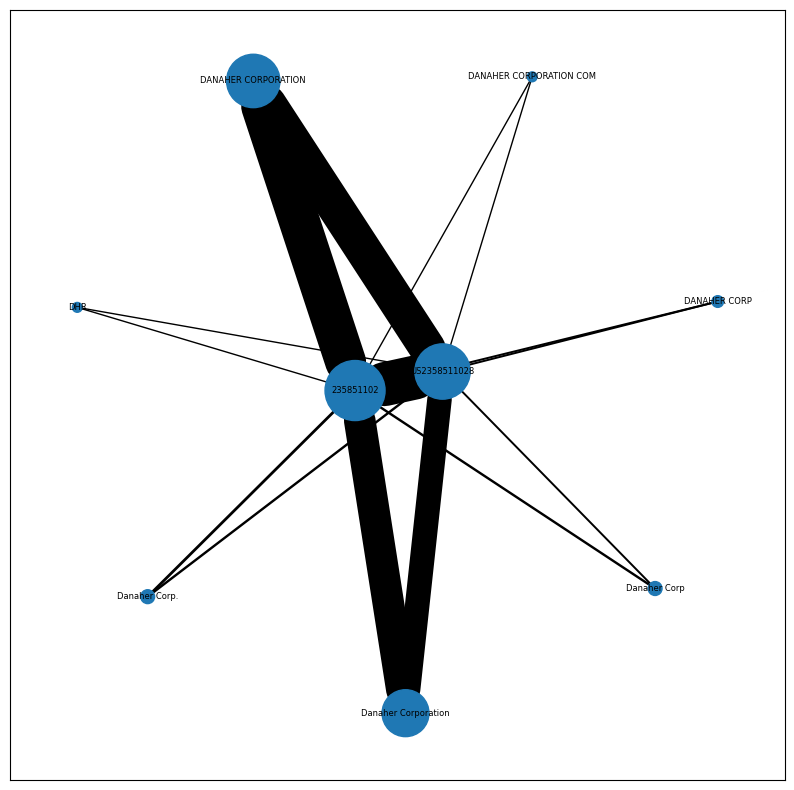

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


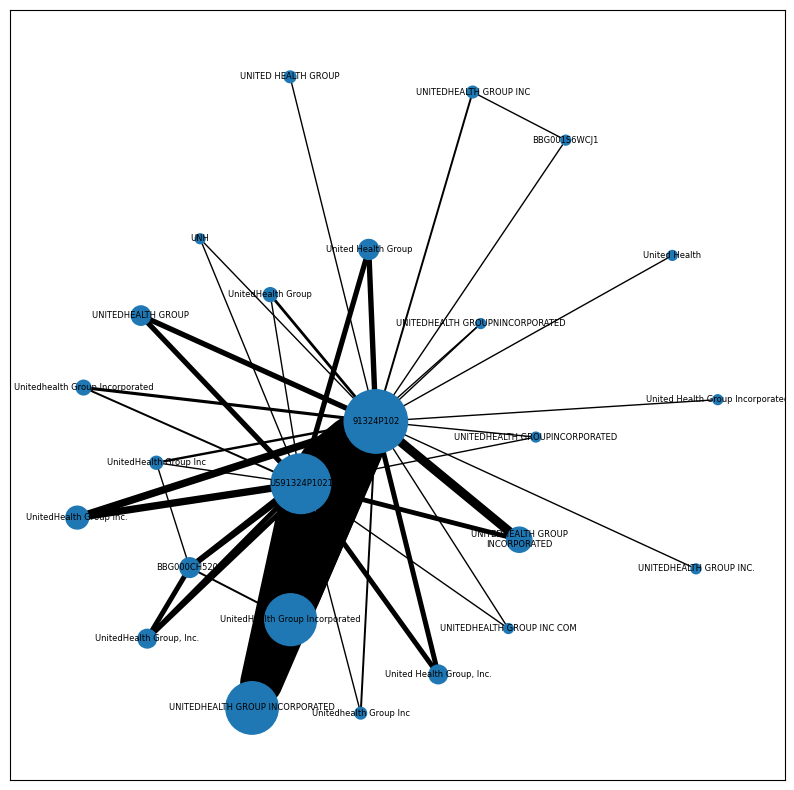

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


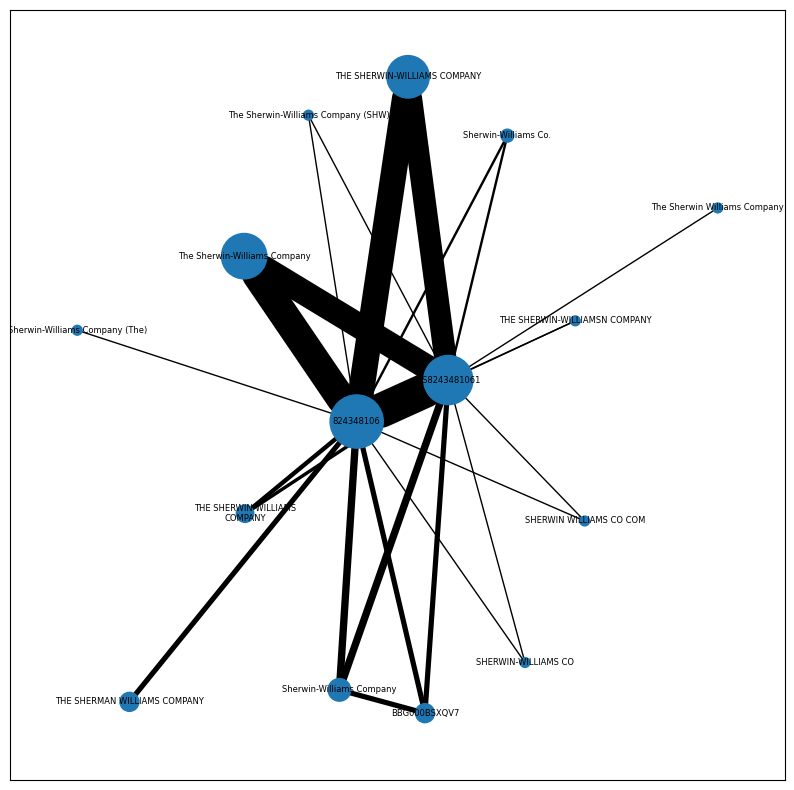

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


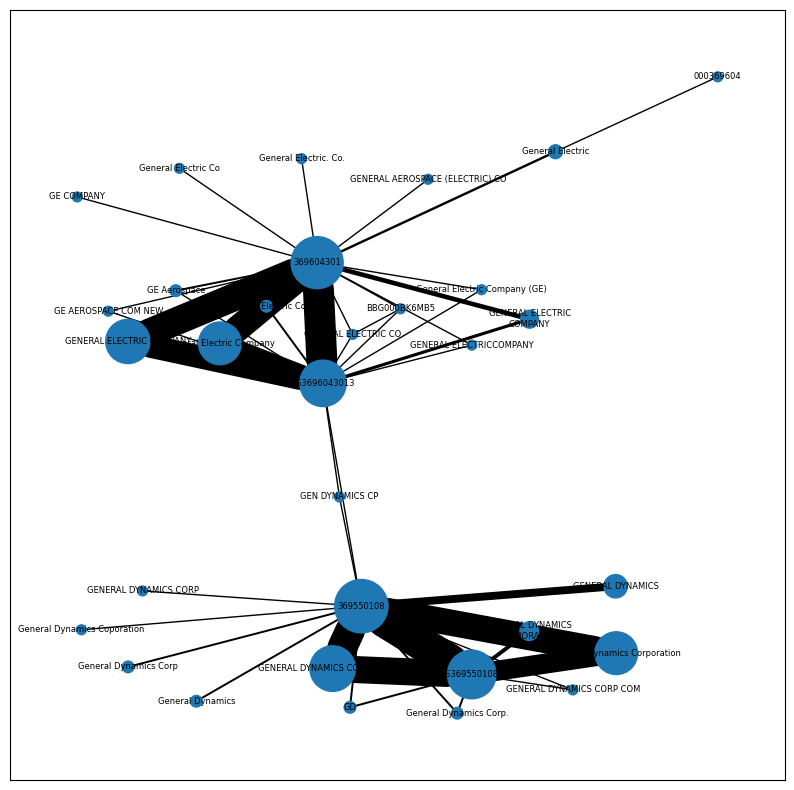

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


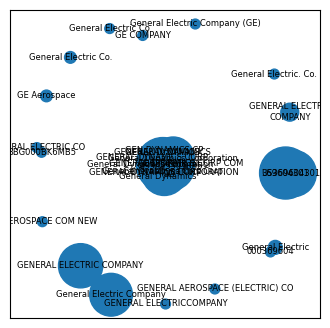

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0.399 ----------------------------------------------------------------------------------------------------


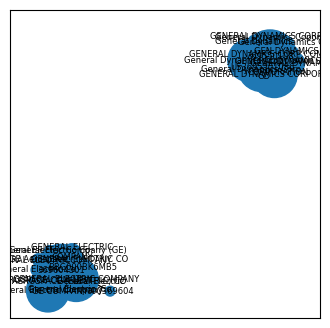

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.0 ----------------------------------------------------------------------------------------------------


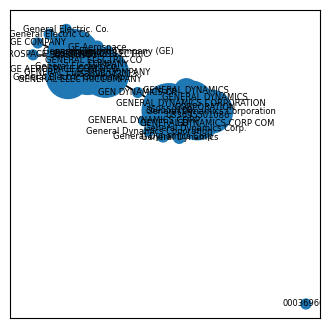

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


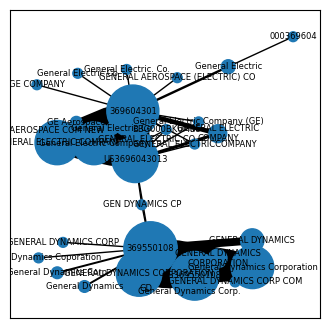

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.497 ----------------------------------------------------------------------------------------------------


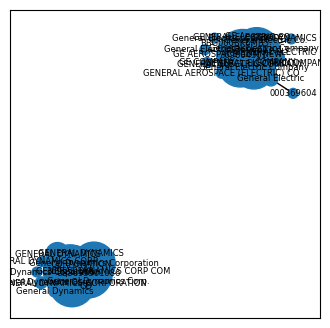

method_scores={'kmeans': 0, 'betweenness_centrality': 0.39929803688280774, 'articulation_points': 0.0, 'spectral_clustering': 0, 'louvain': 0.49718652992153867}
best_method='louvain'


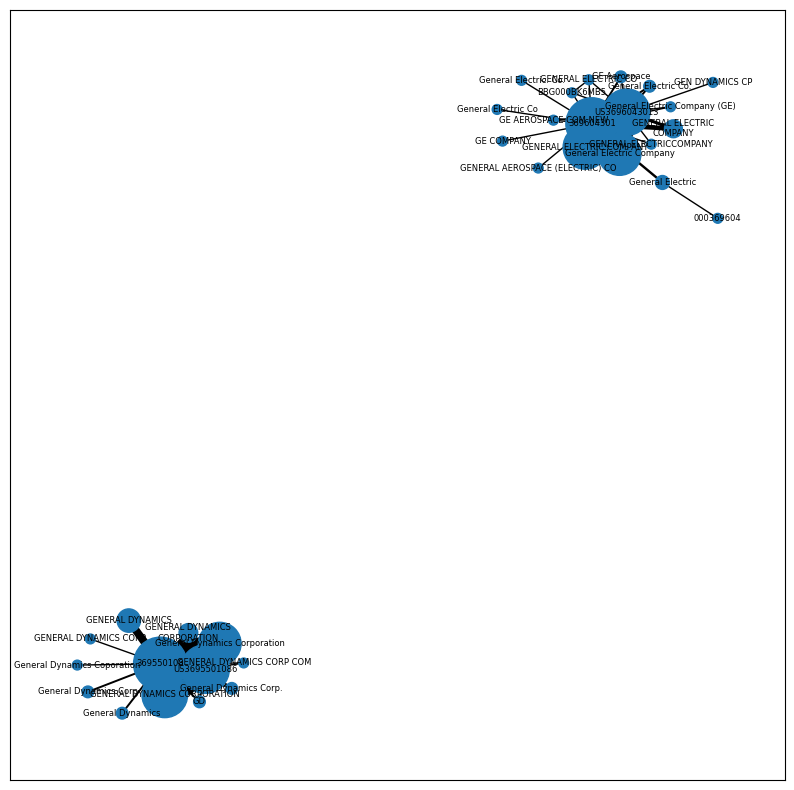

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


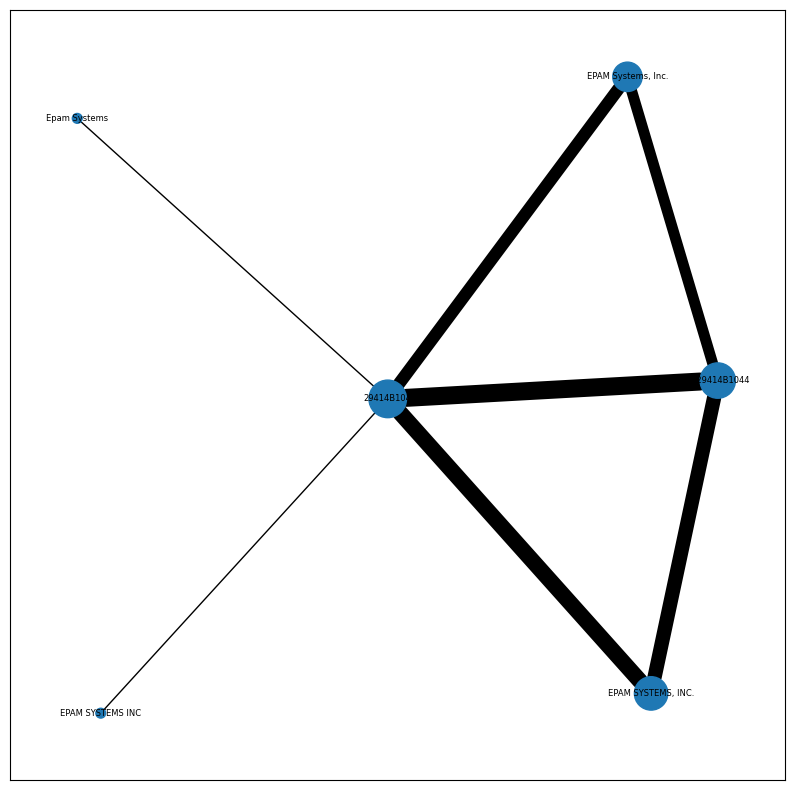

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


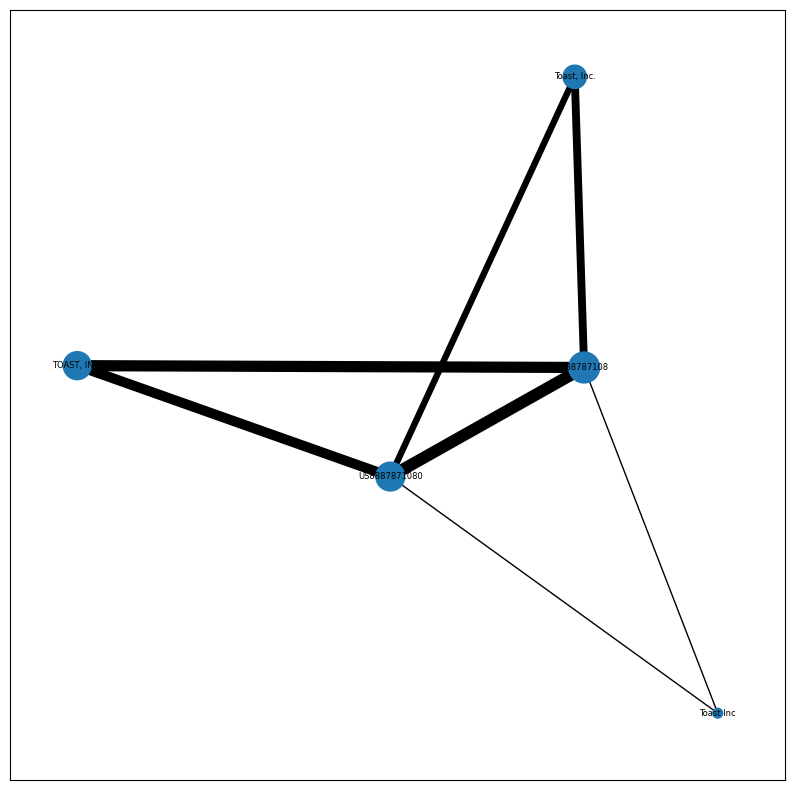

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


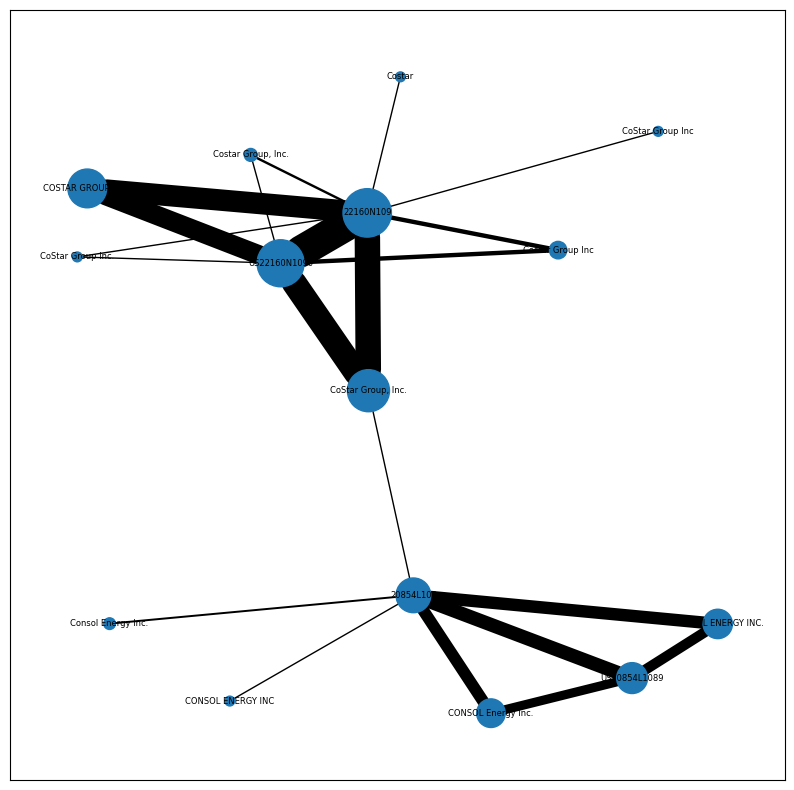

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0.0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


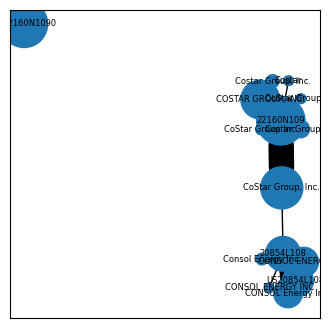

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


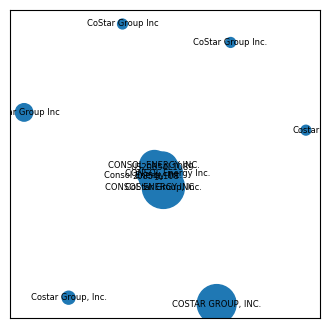

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0 ----------------------------------------------------------------------------------------------------


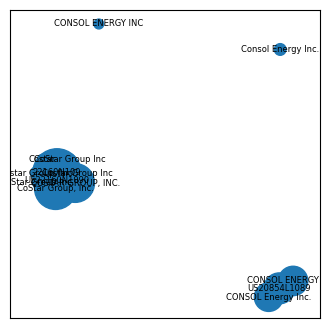

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


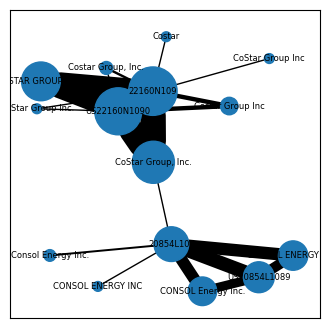

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.291 ----------------------------------------------------------------------------------------------------


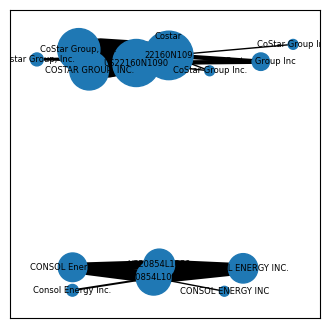

method_scores={'kmeans': 0.0, 'betweenness_centrality': 0, 'articulation_points': 0, 'spectral_clustering': 0, 'louvain': 0.2905426630640641}
best_method='louvain'


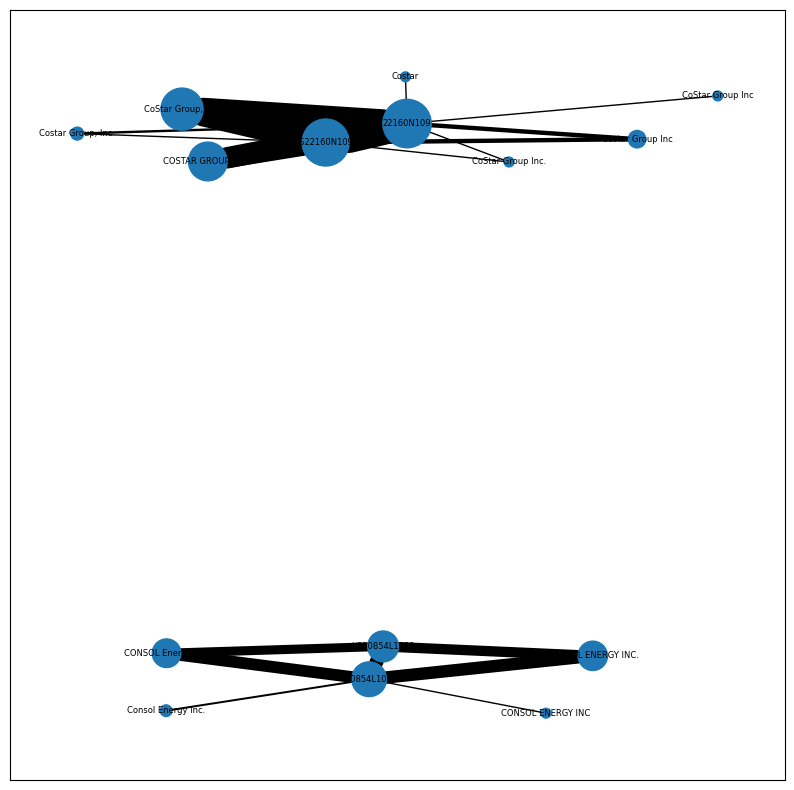

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


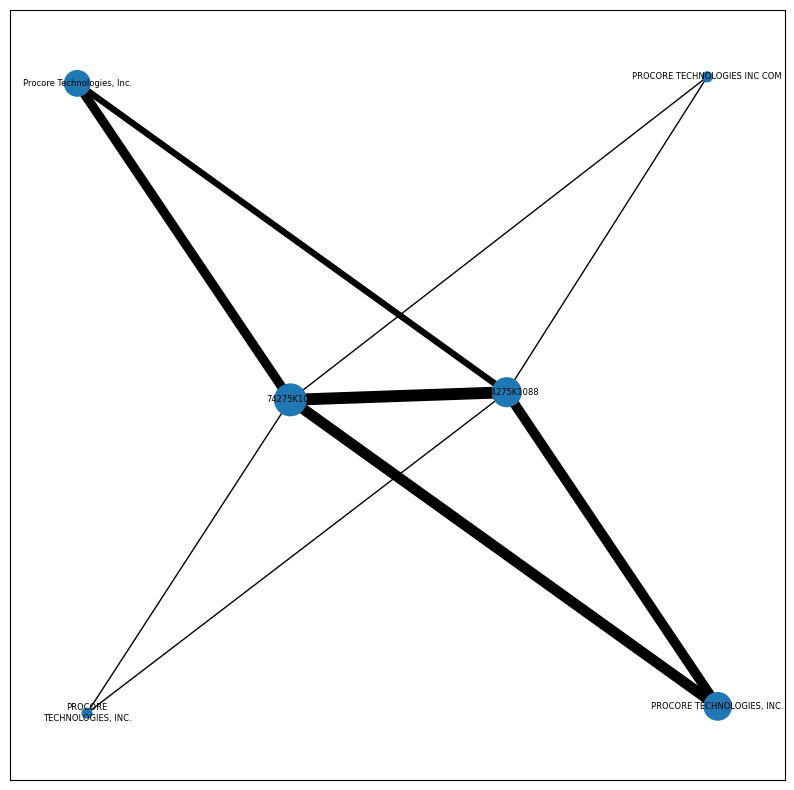

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


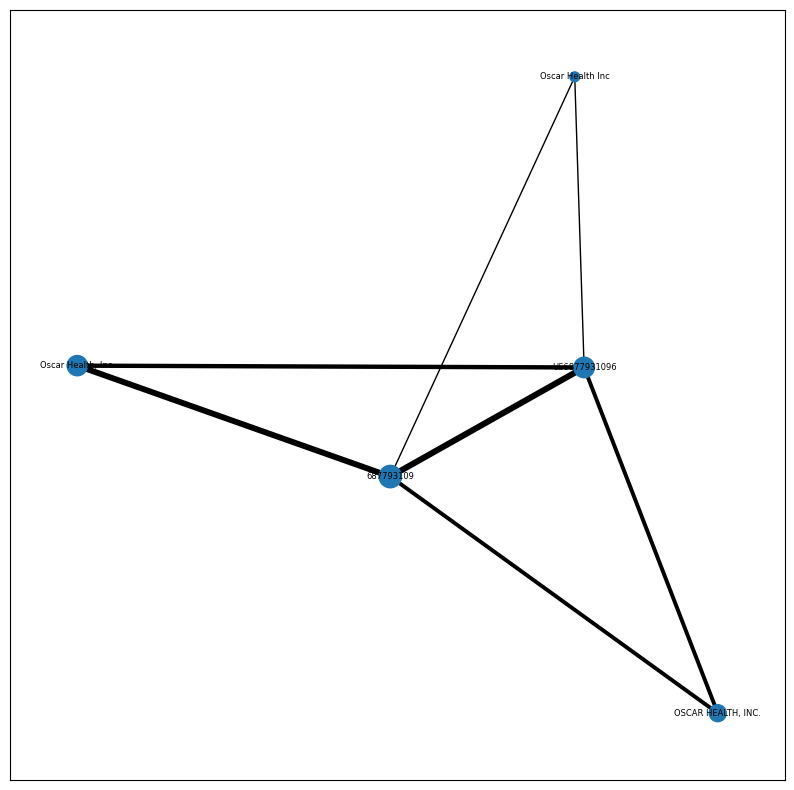

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


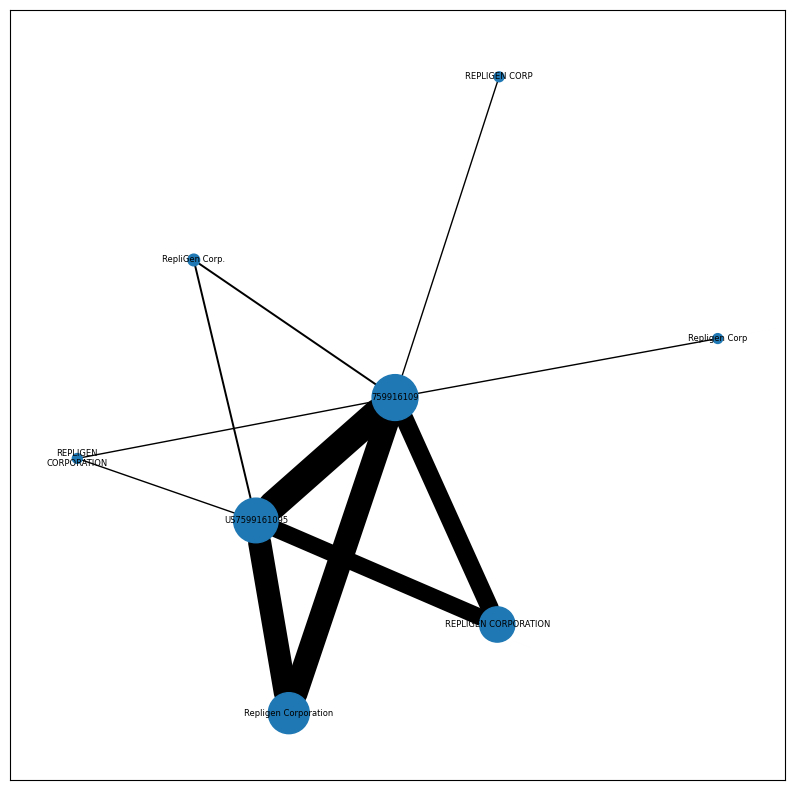

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


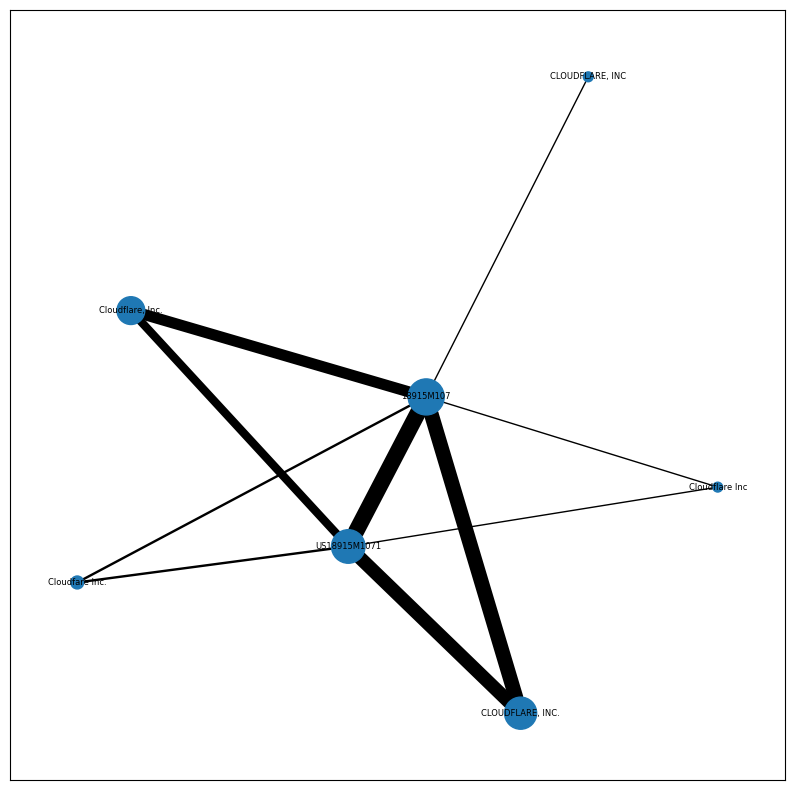

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


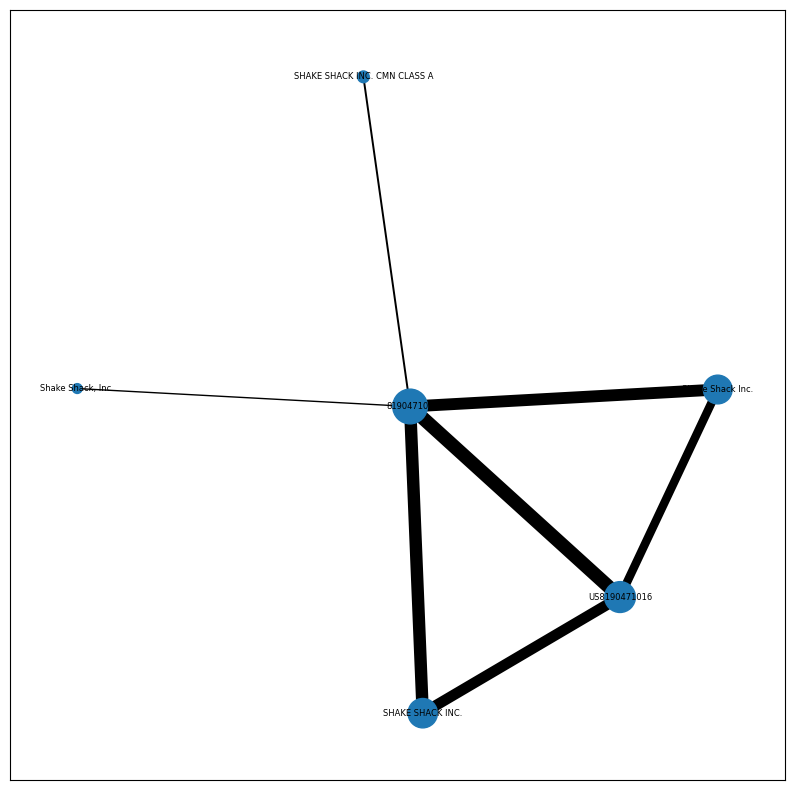

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


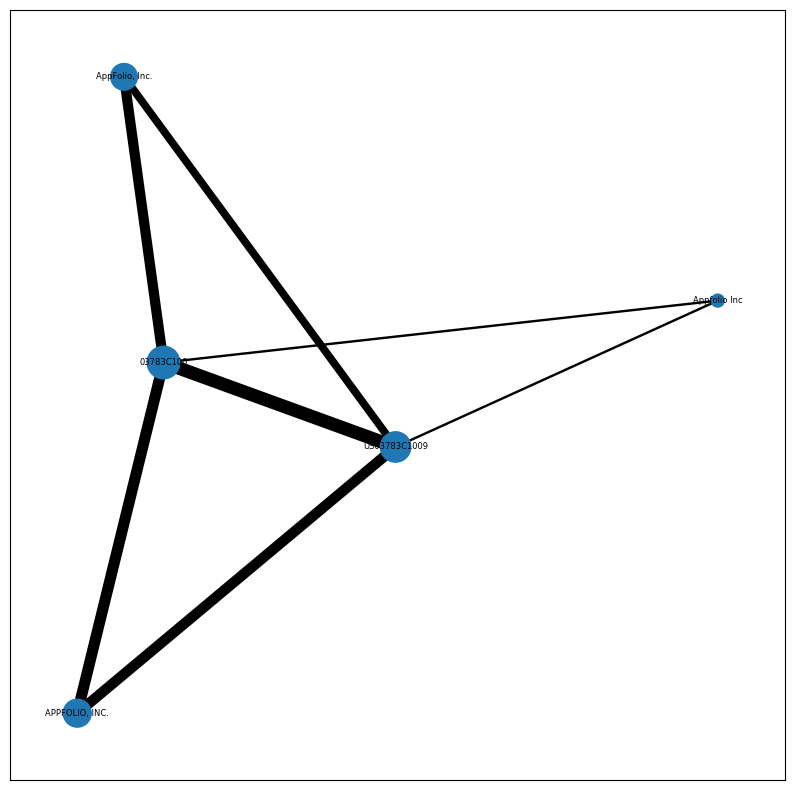

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


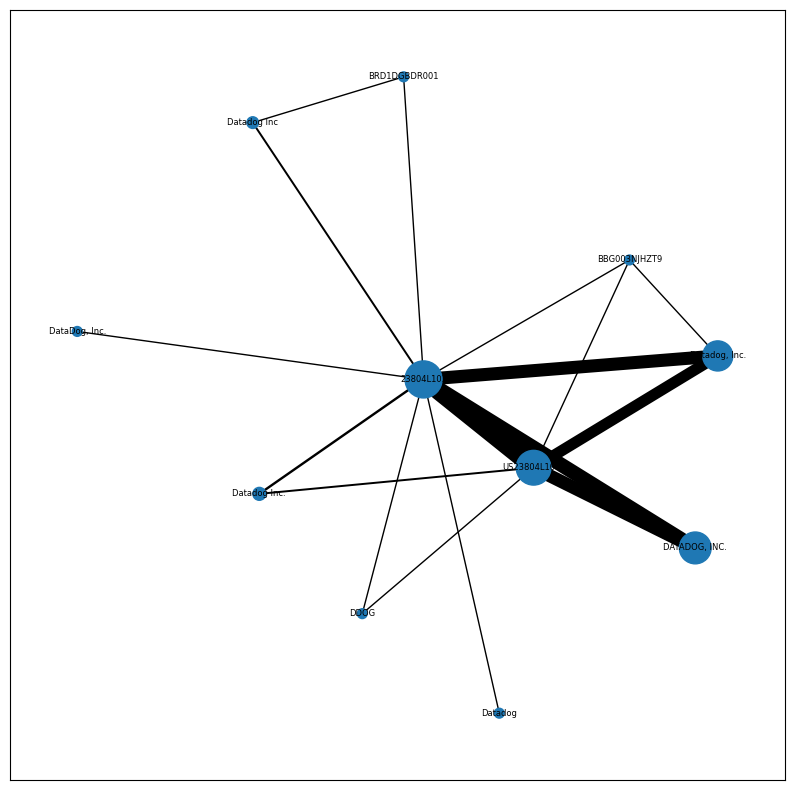

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


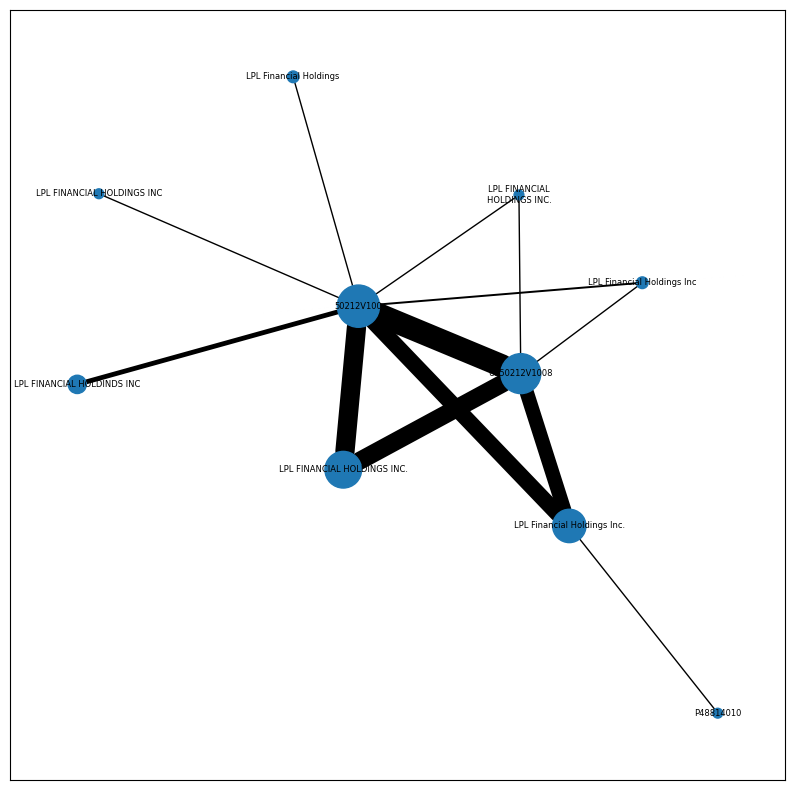

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


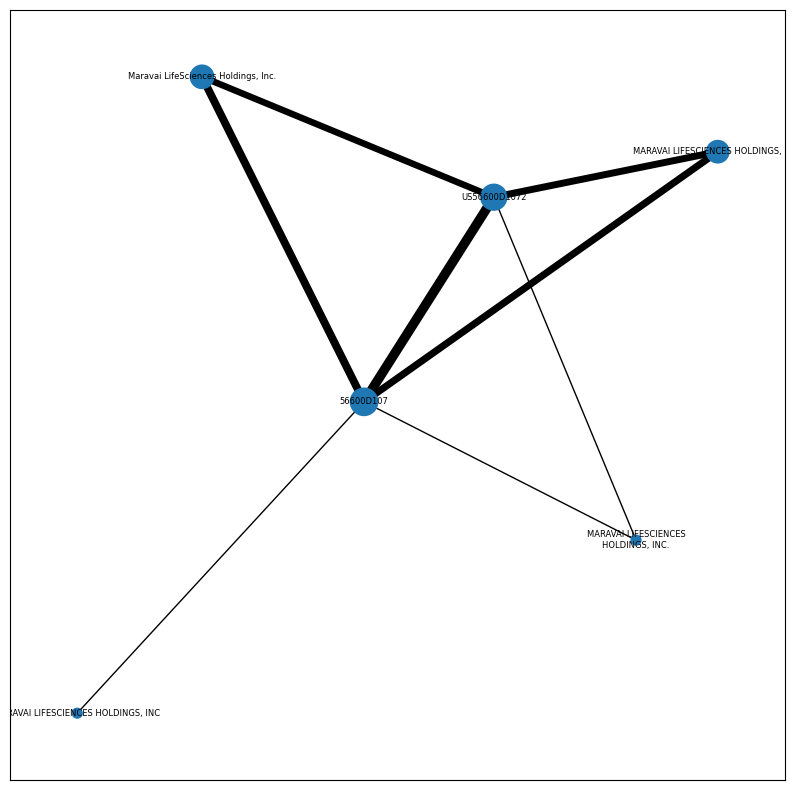

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


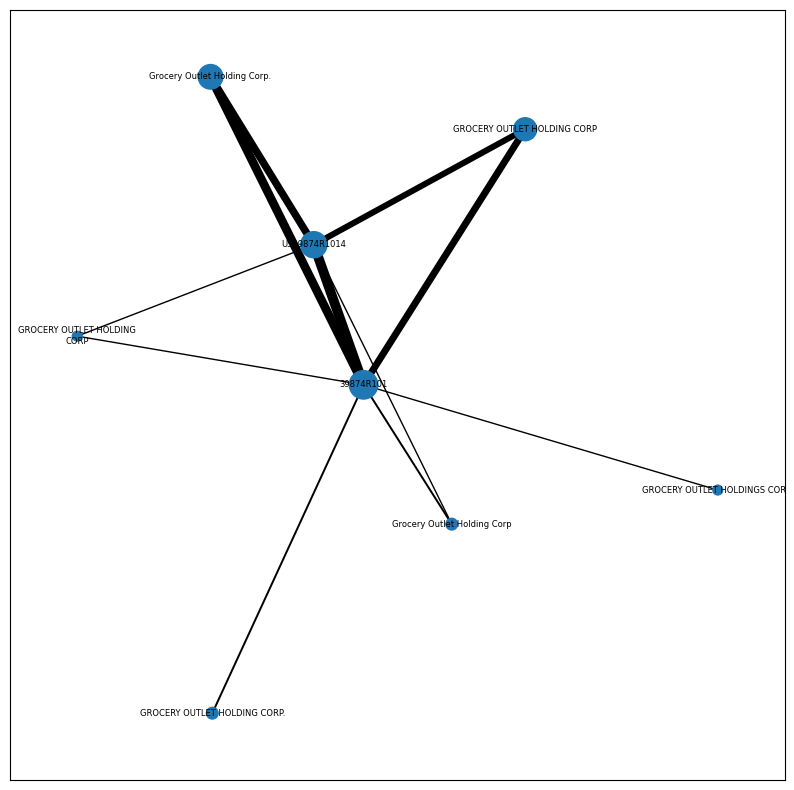

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


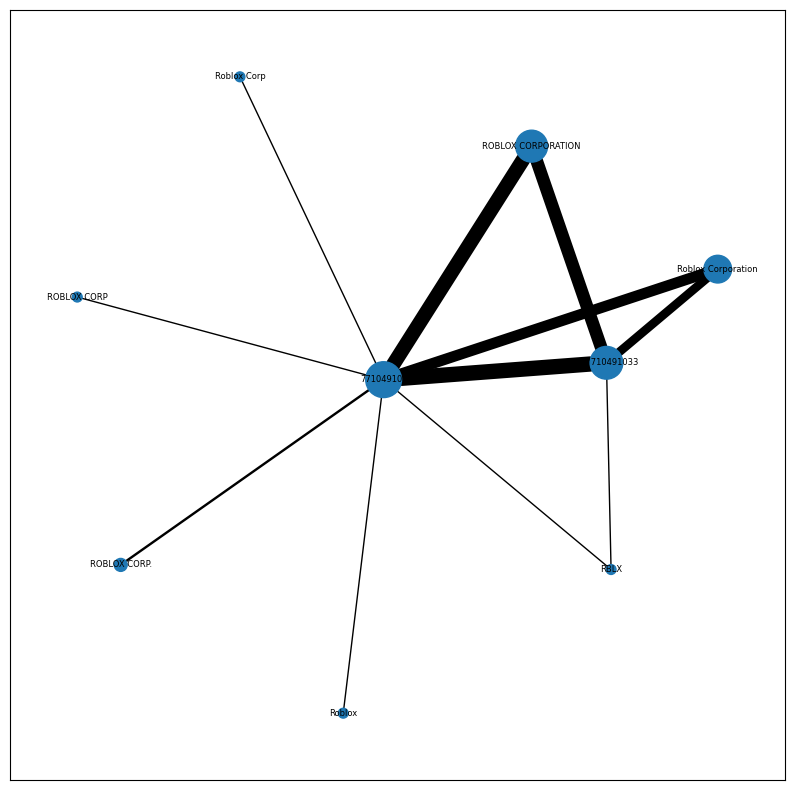

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


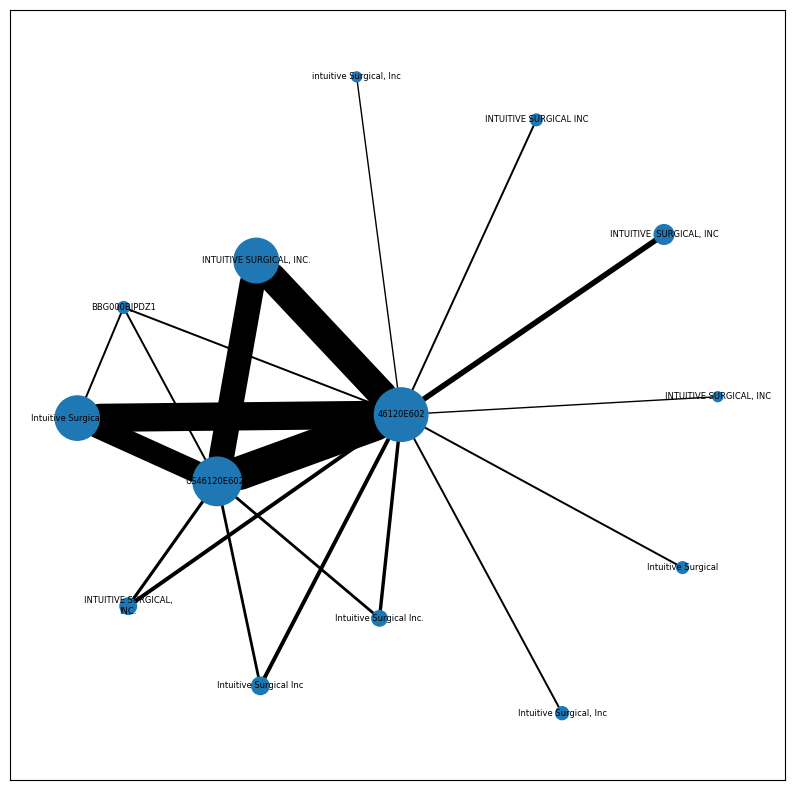

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


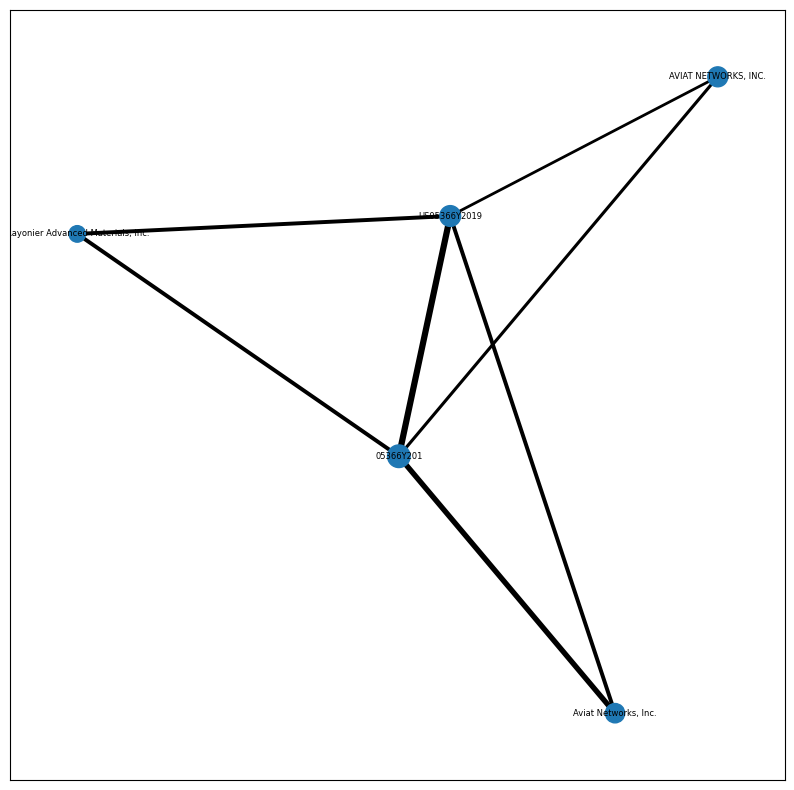

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


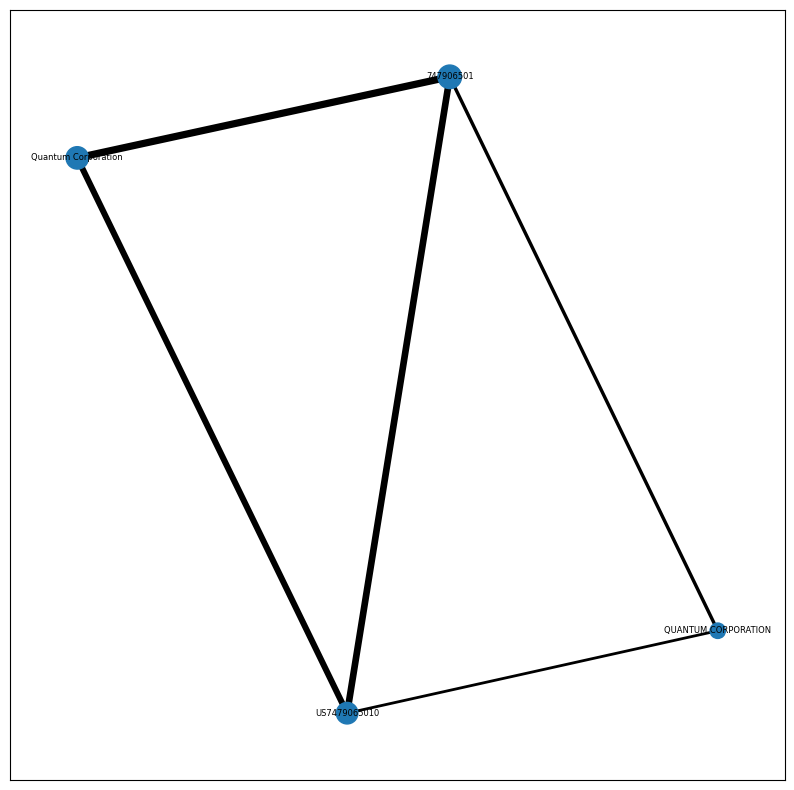

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


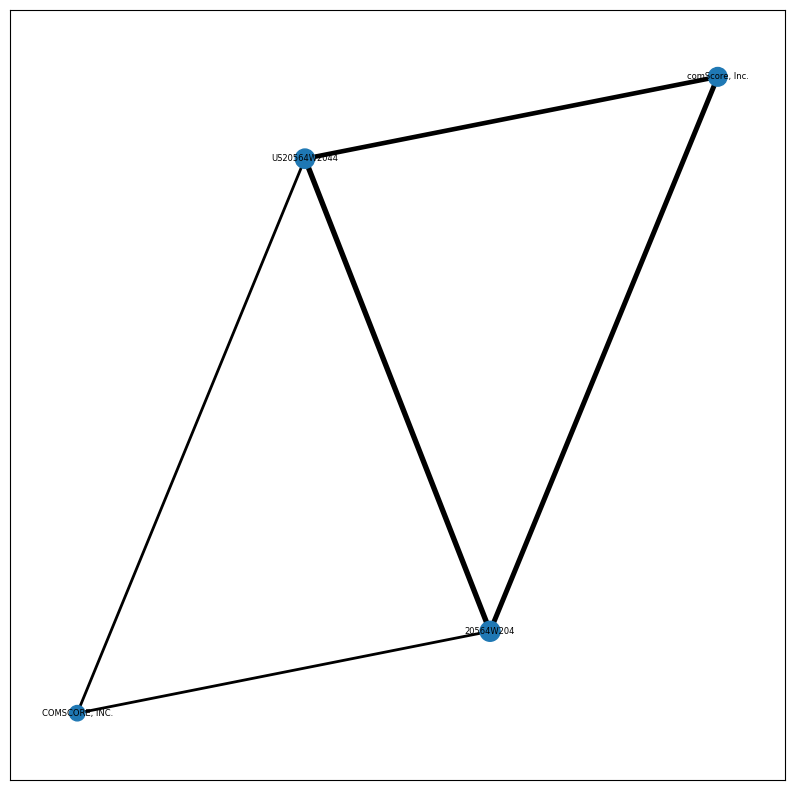

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


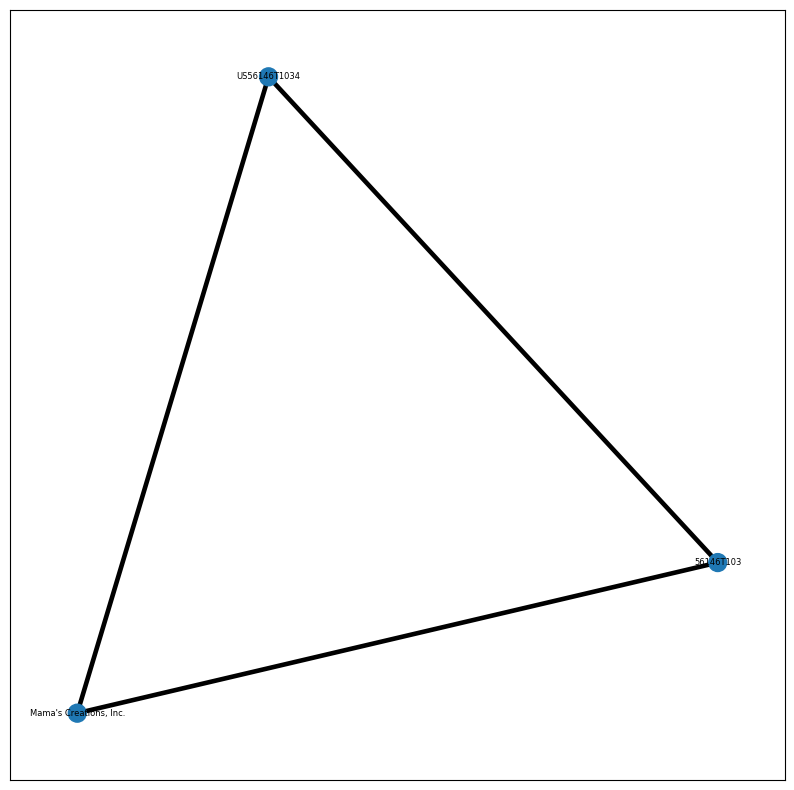

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


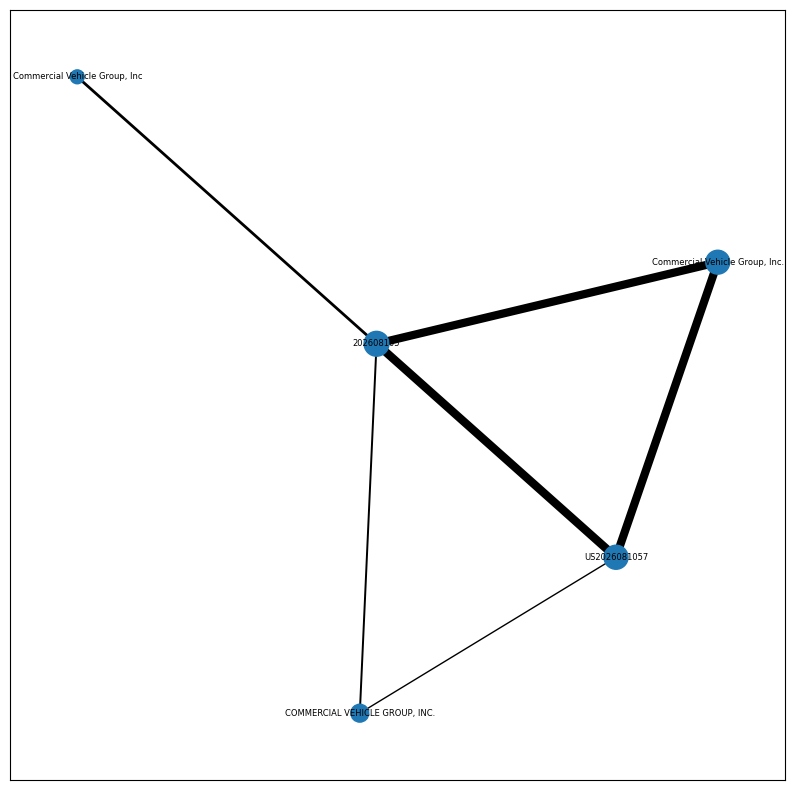

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


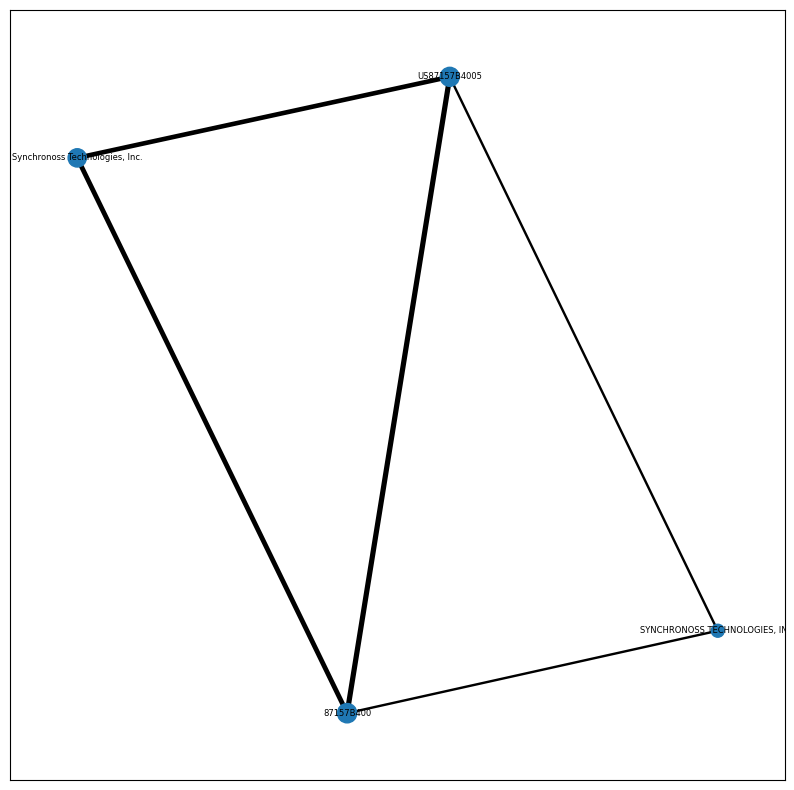

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


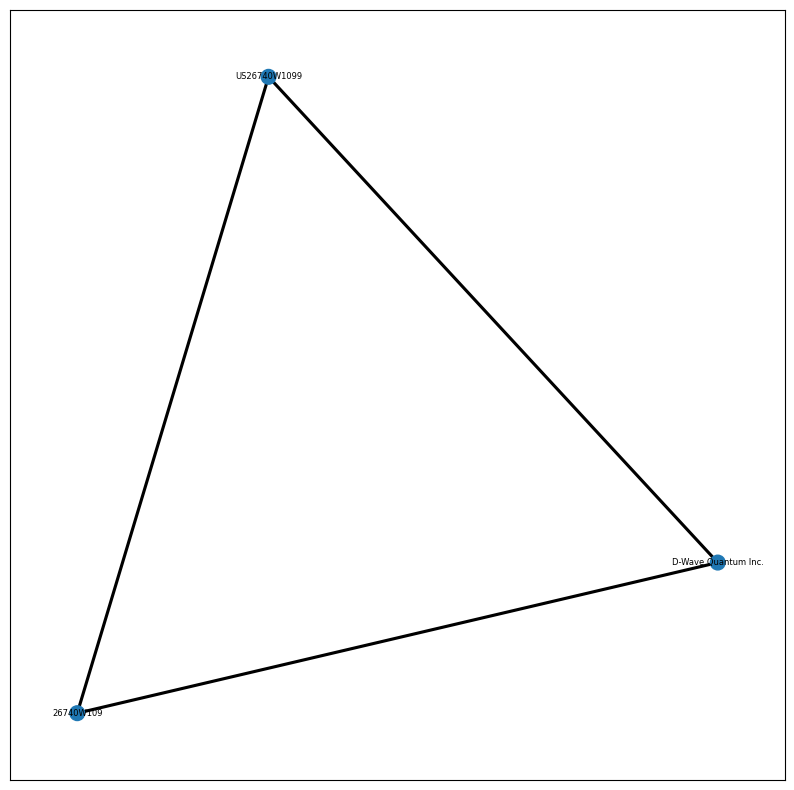

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


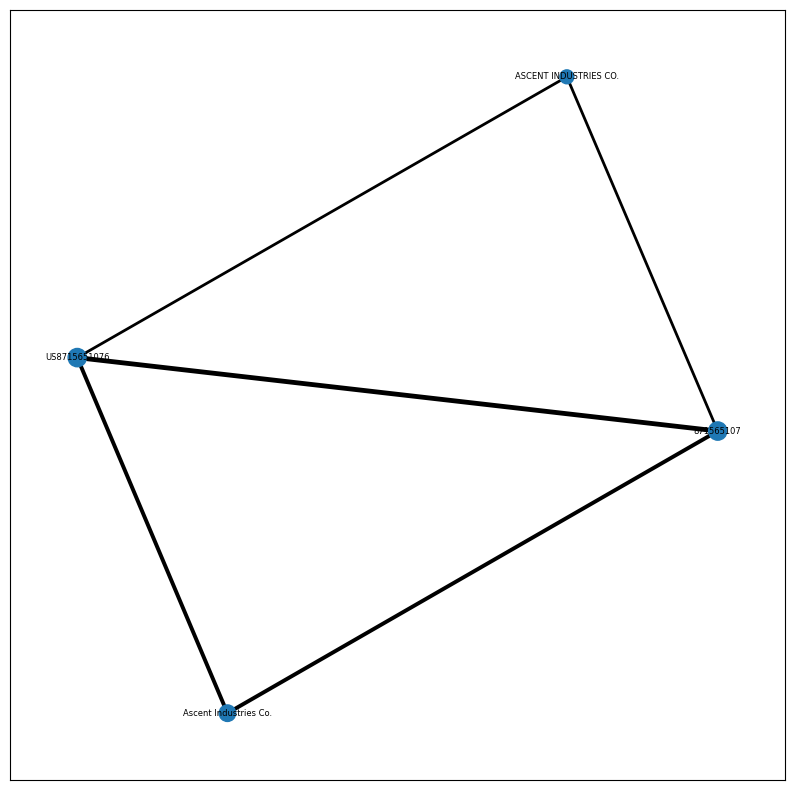

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


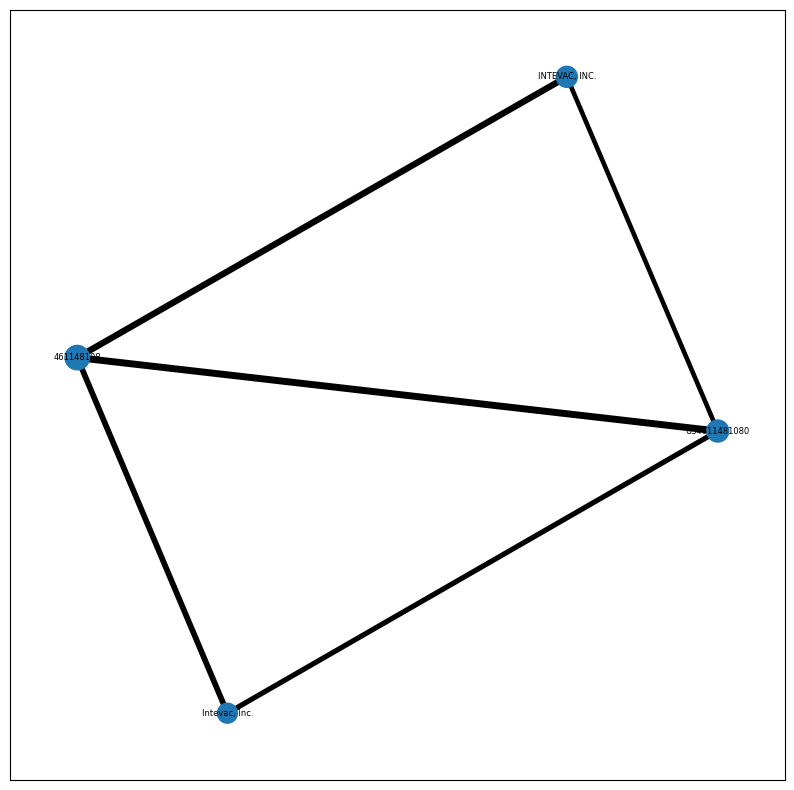

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


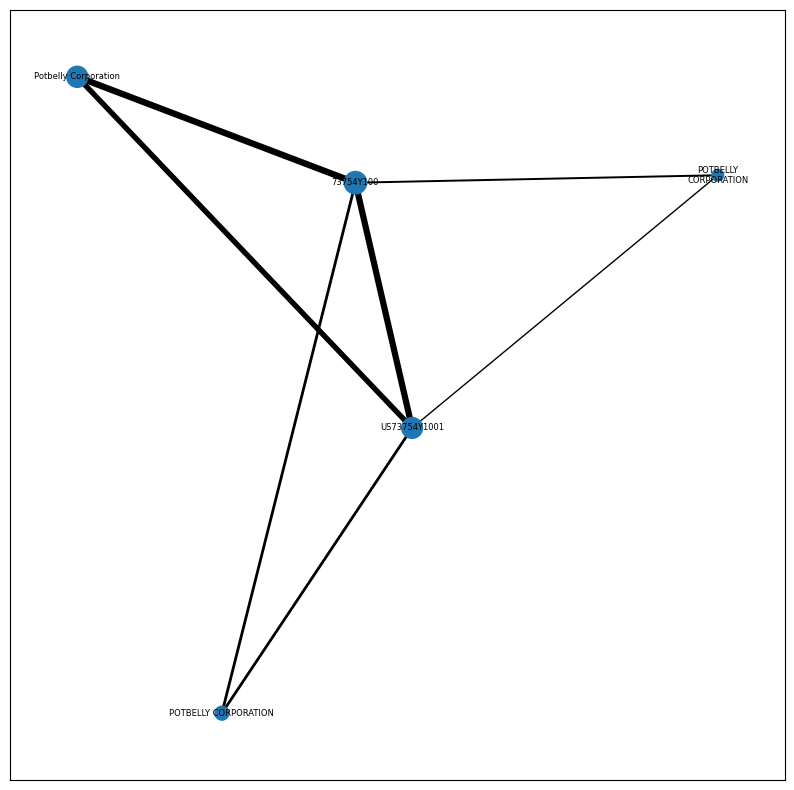

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


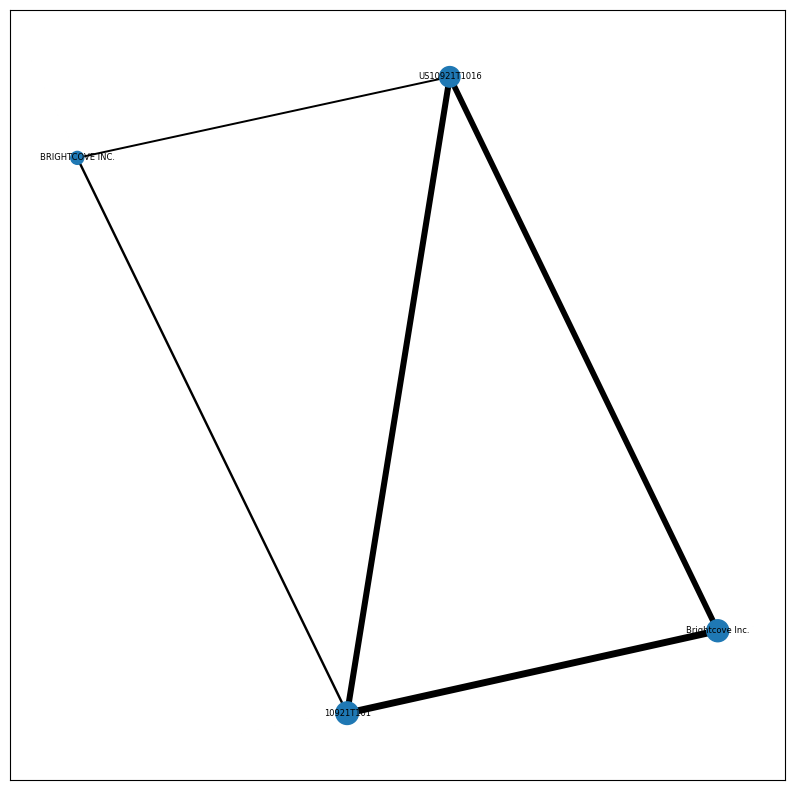

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


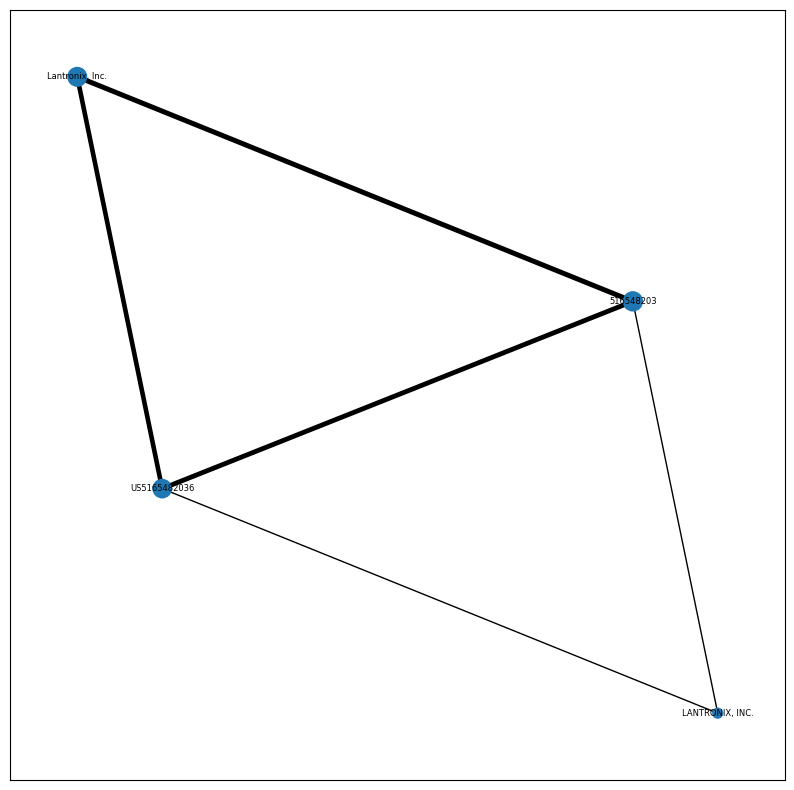

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


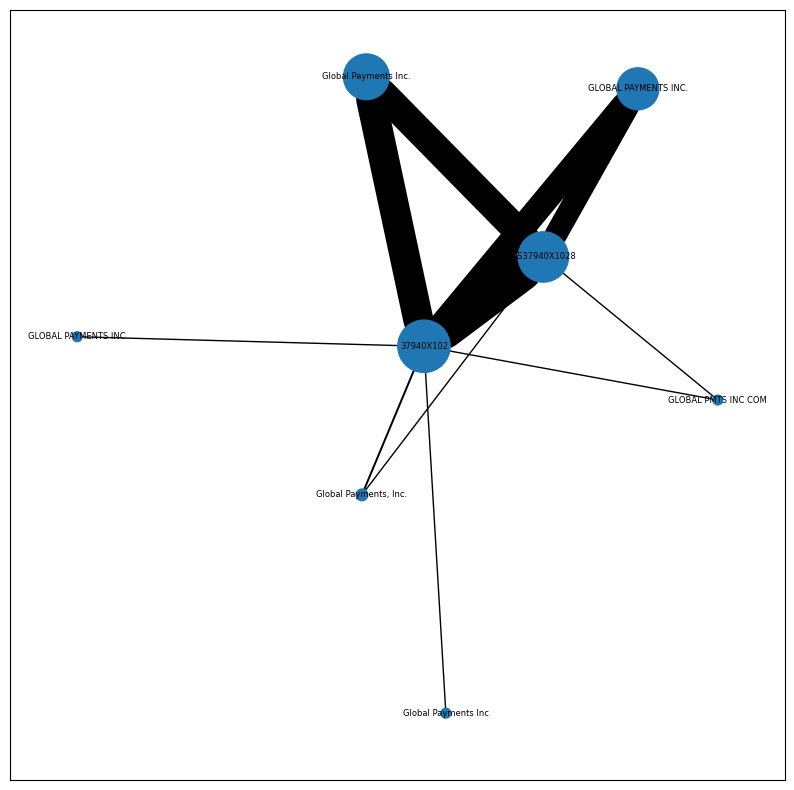

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


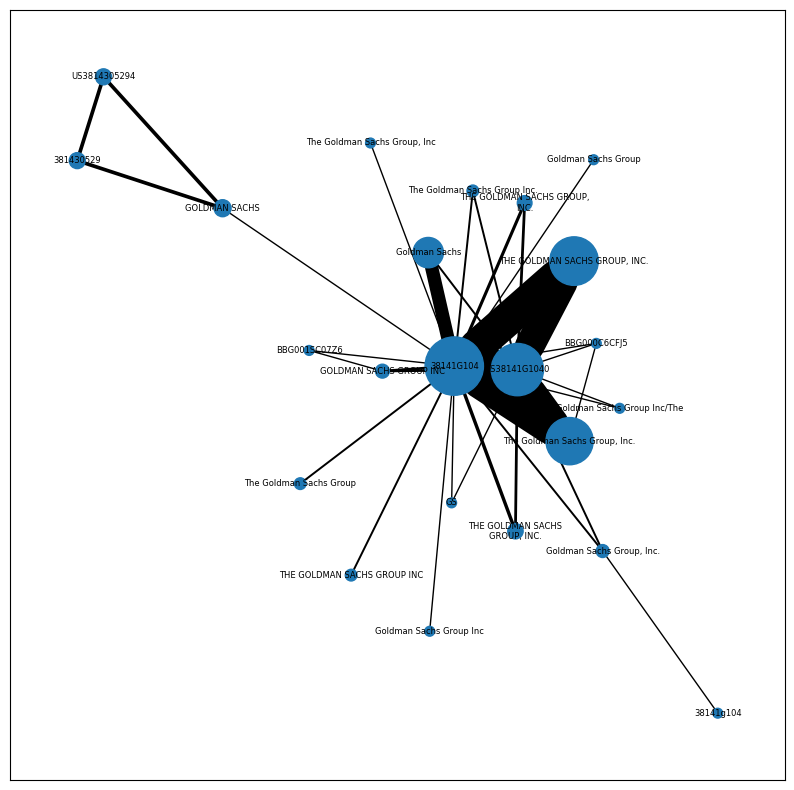

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


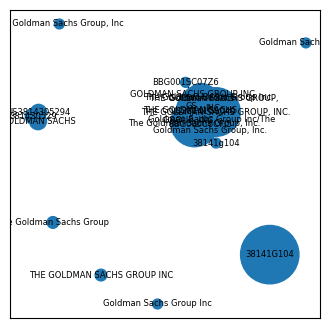

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


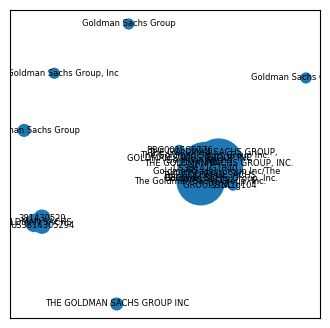

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.0 ----------------------------------------------------------------------------------------------------


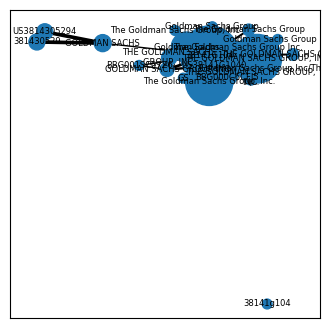

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


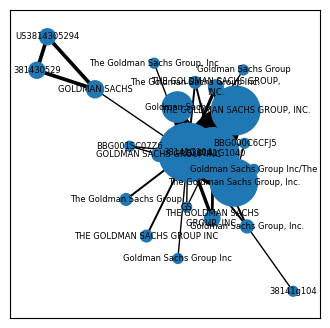

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0 ----------------------------------------------------------------------------------------------------


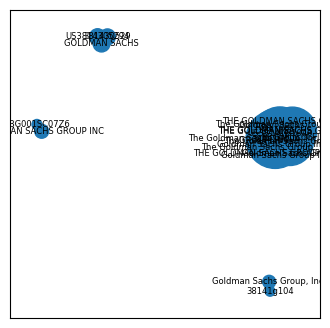

/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:343: UserWarning: Returning unmodified graph, because `best_score` == 0
k=2
best_score=0
method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.0, 'spectral_clustering': 0, 'louvain': 0}
  warn(warning_str)


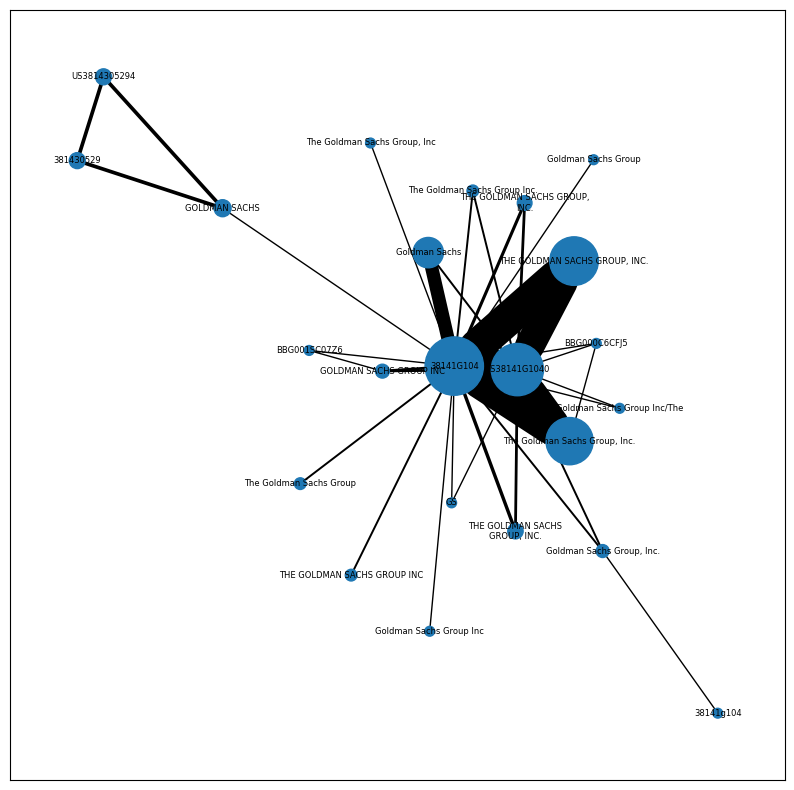

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


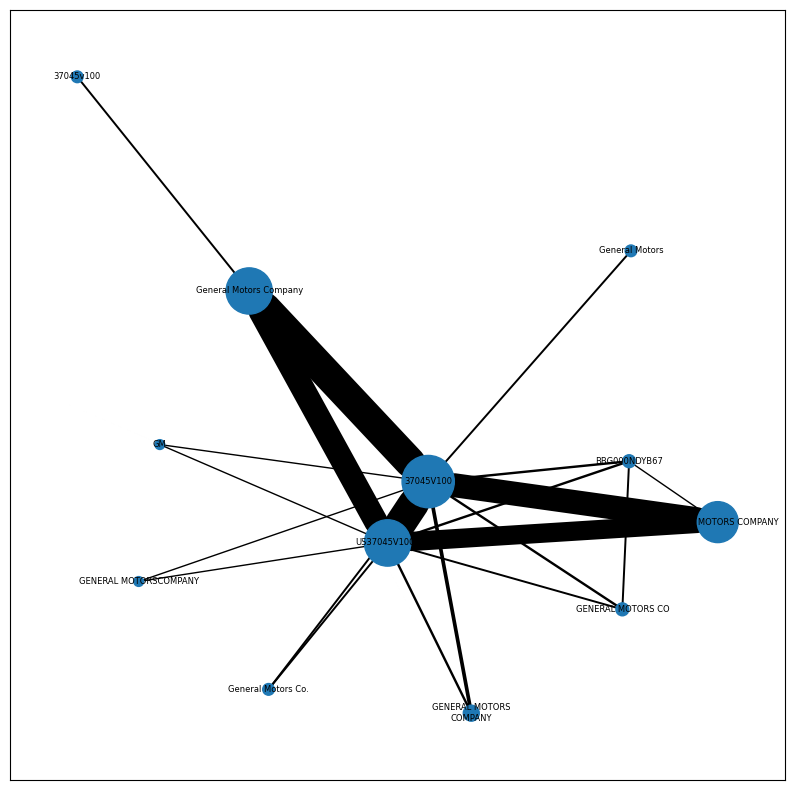

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


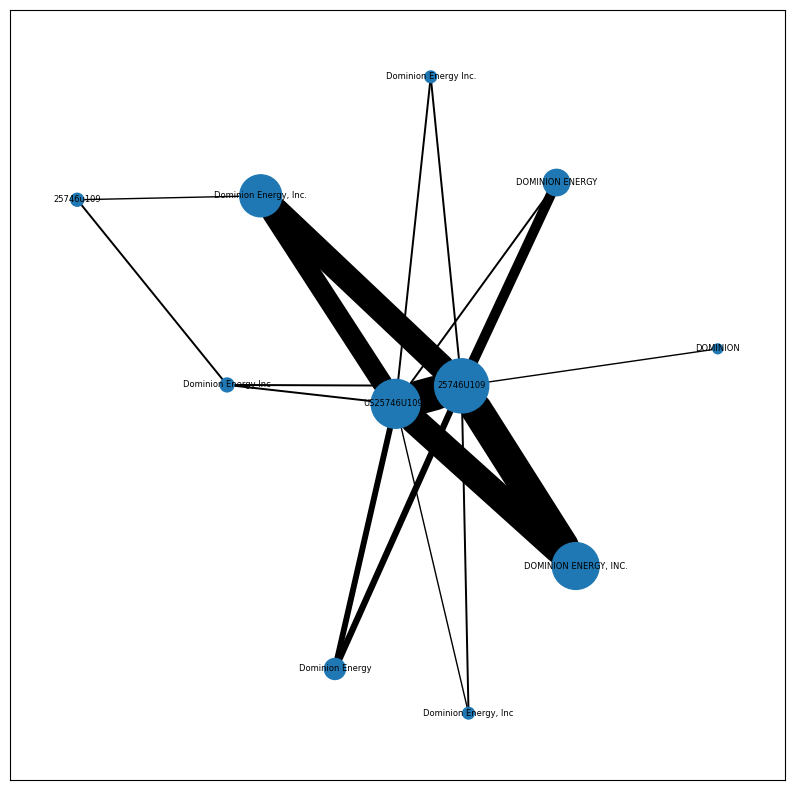

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


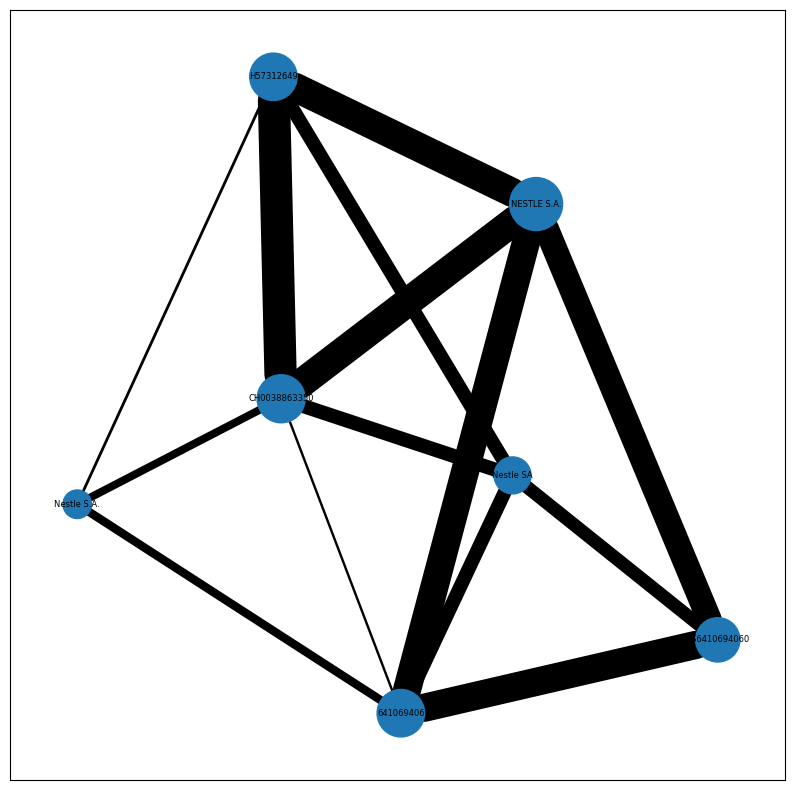

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


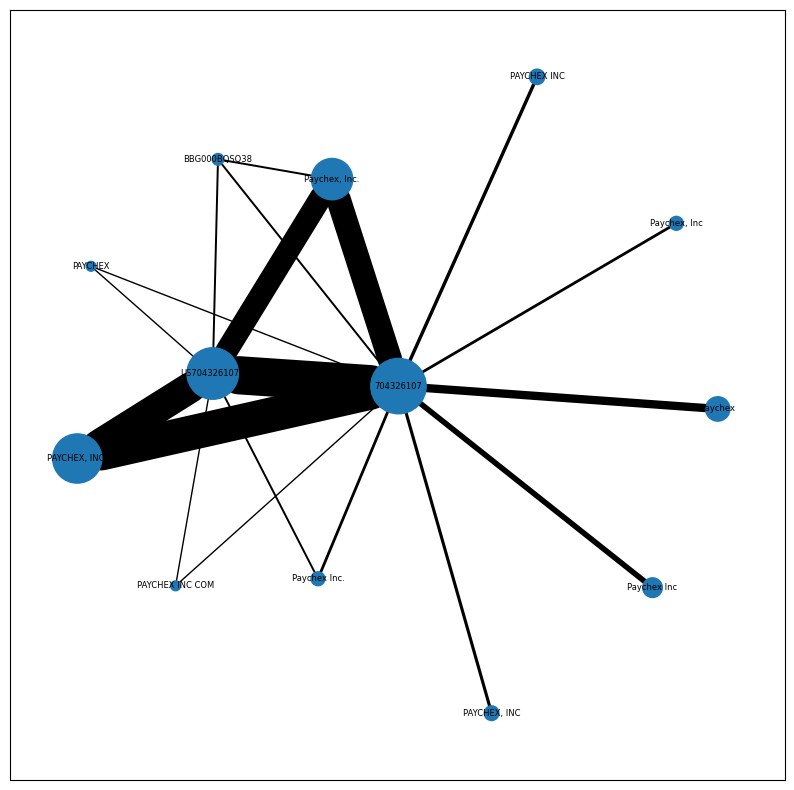

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


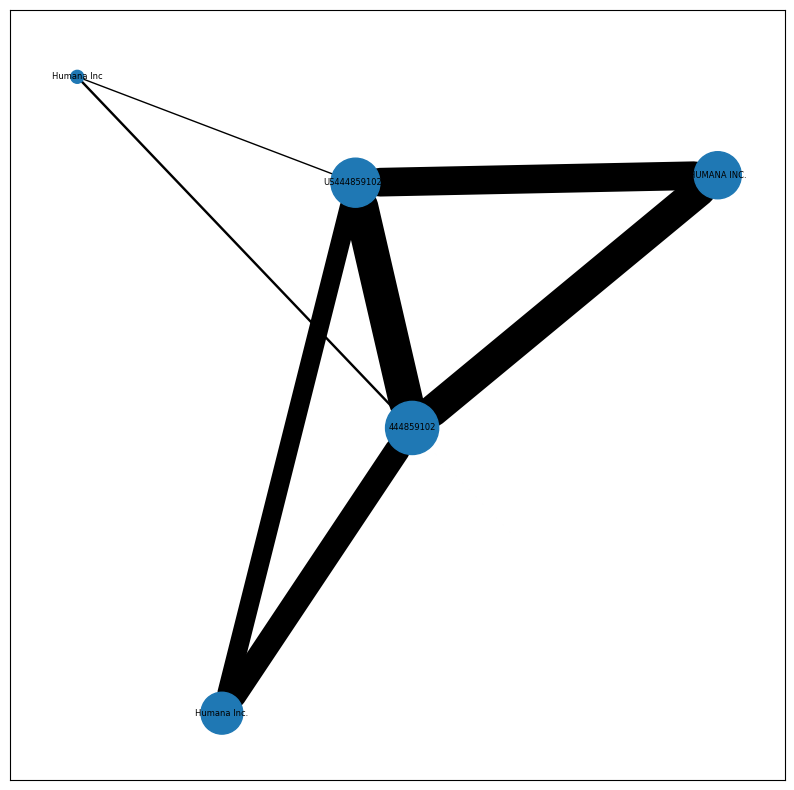

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


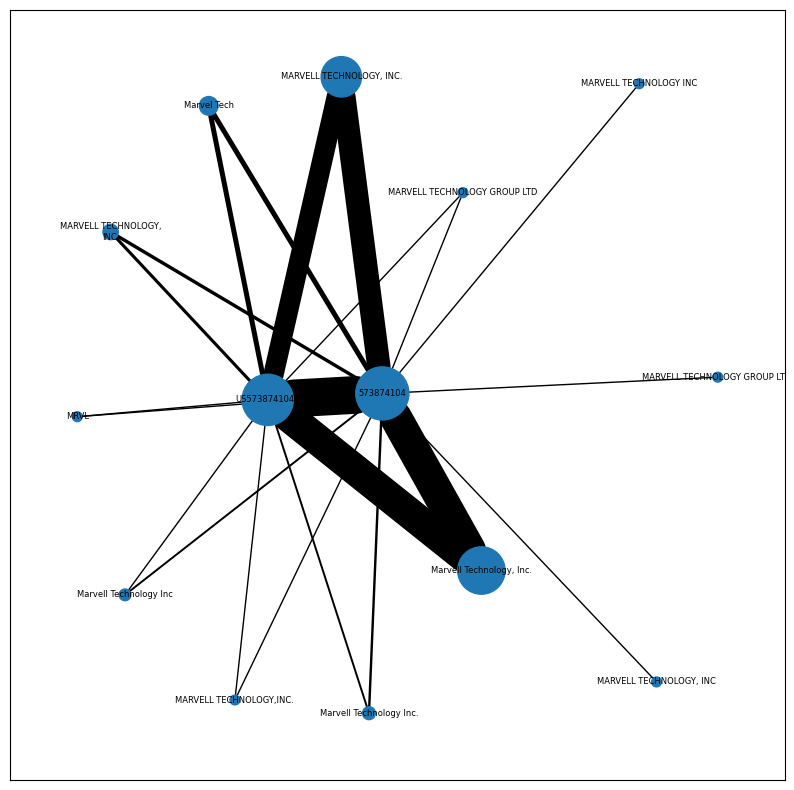

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


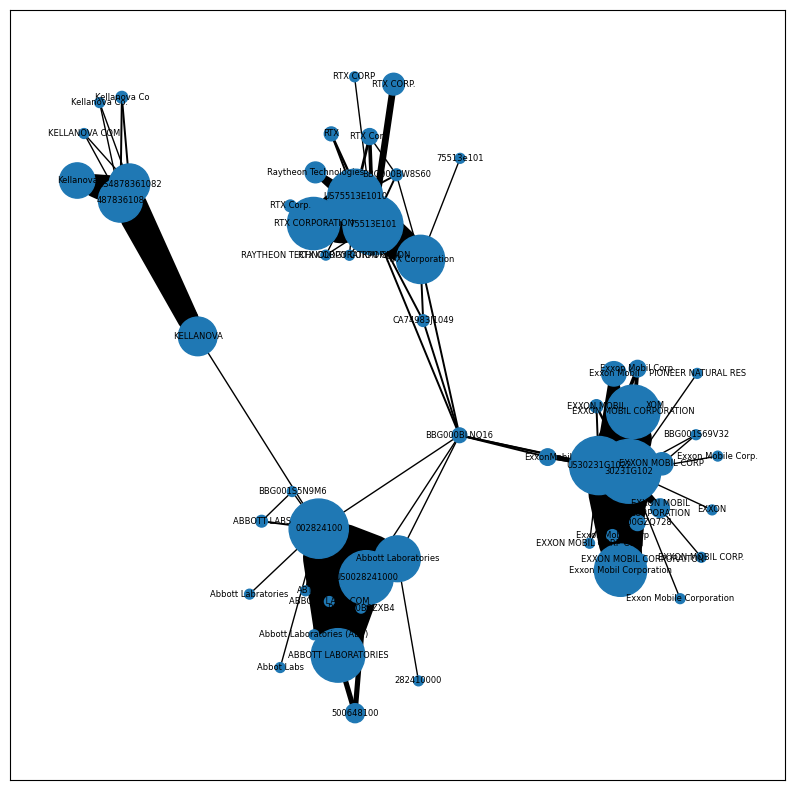

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


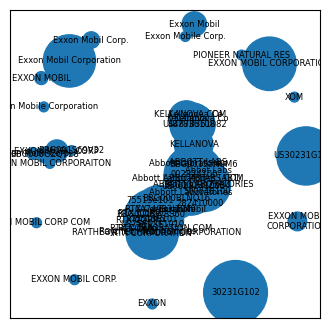

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


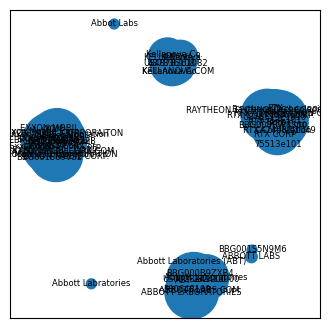

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.692 ----------------------------------------------------------------------------------------------------


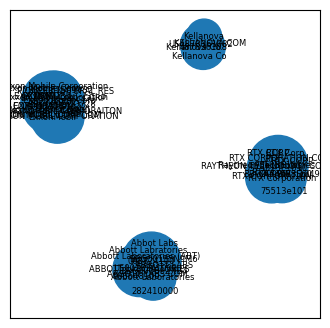

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


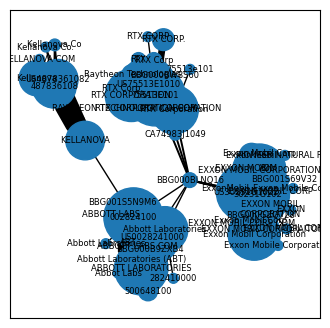

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.708 ----------------------------------------------------------------------------------------------------


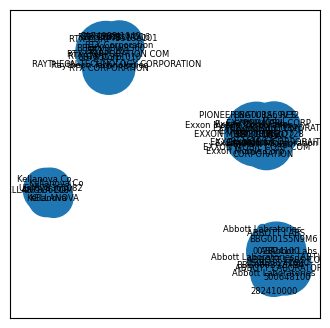

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.6921847087168602, 'spectral_clustering': 0, 'louvain': 0.7082599112720688}
best_method='louvain'


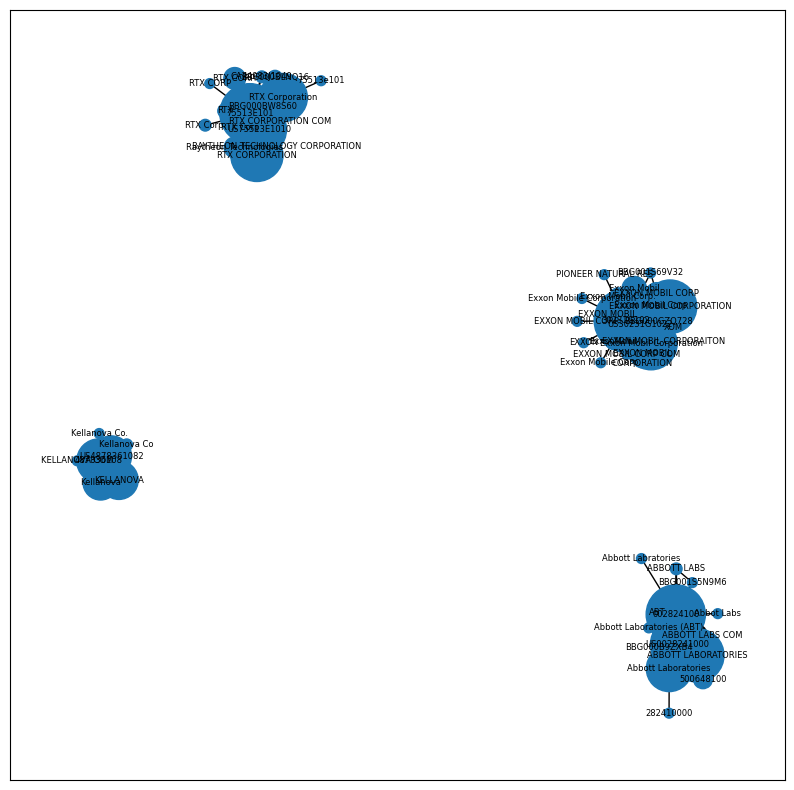

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


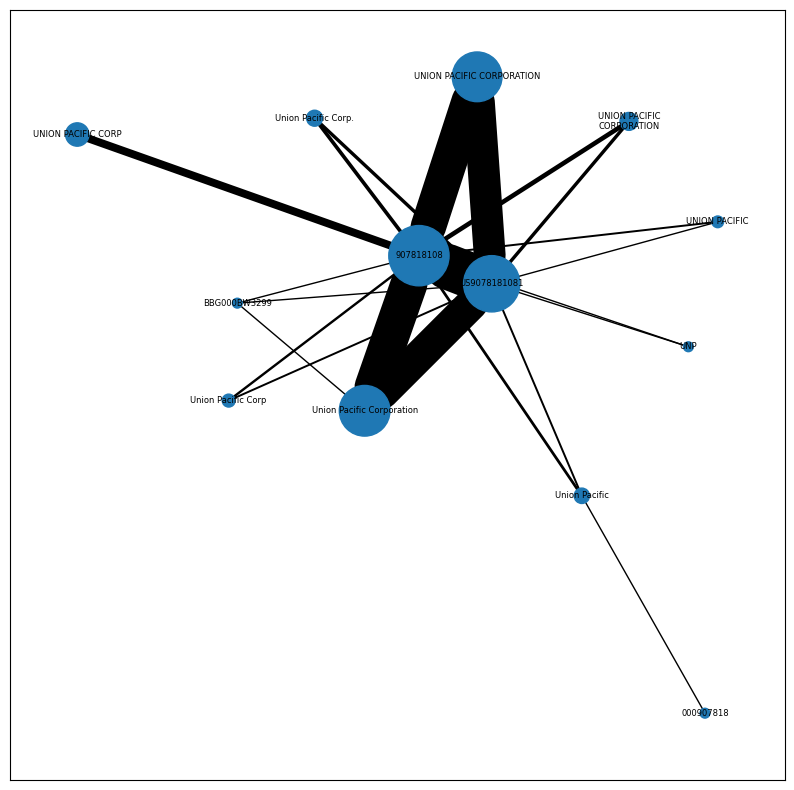

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


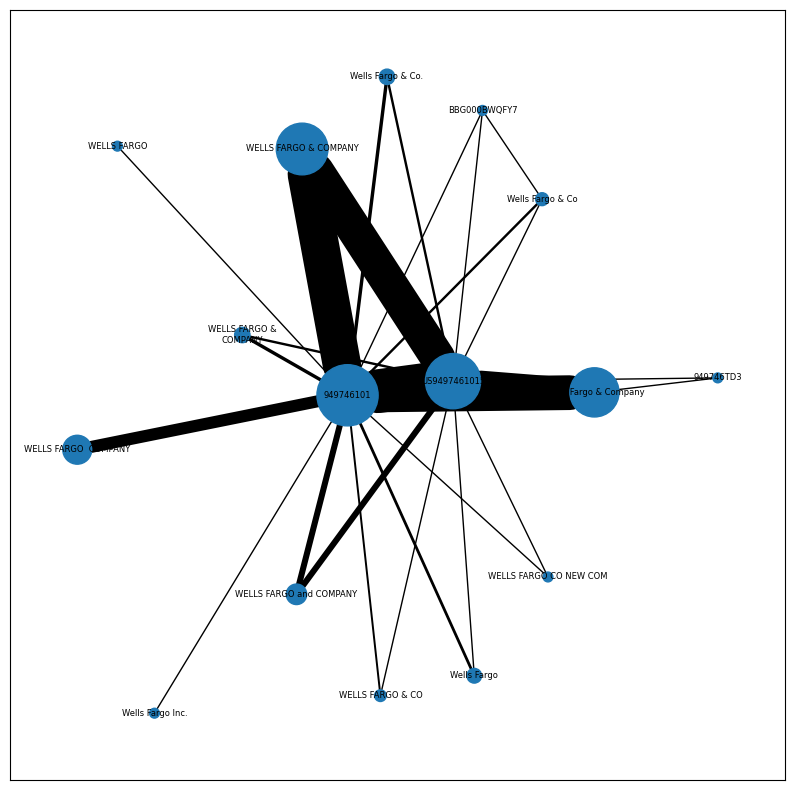

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


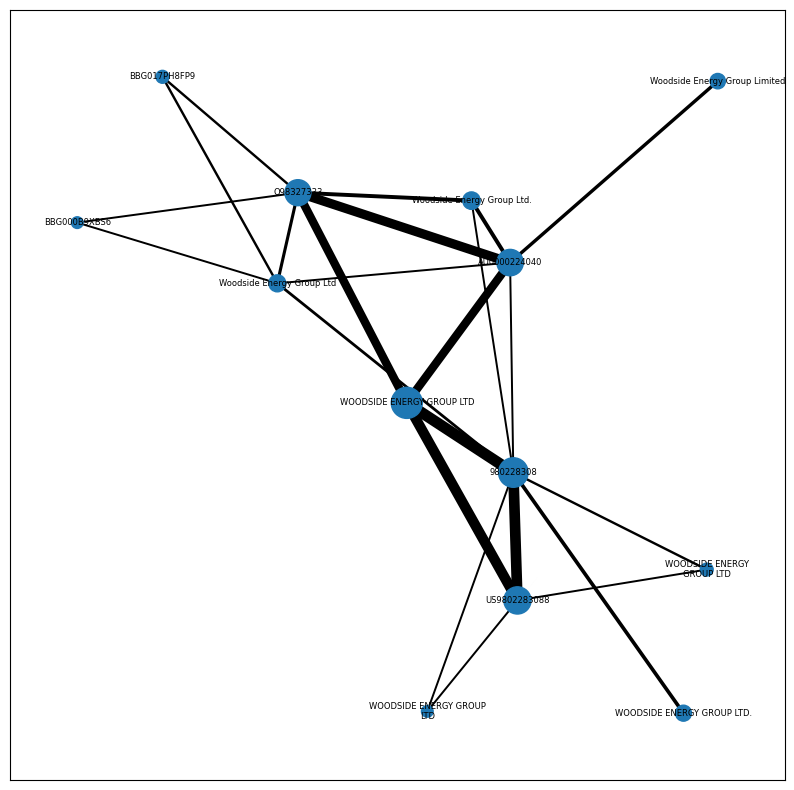

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


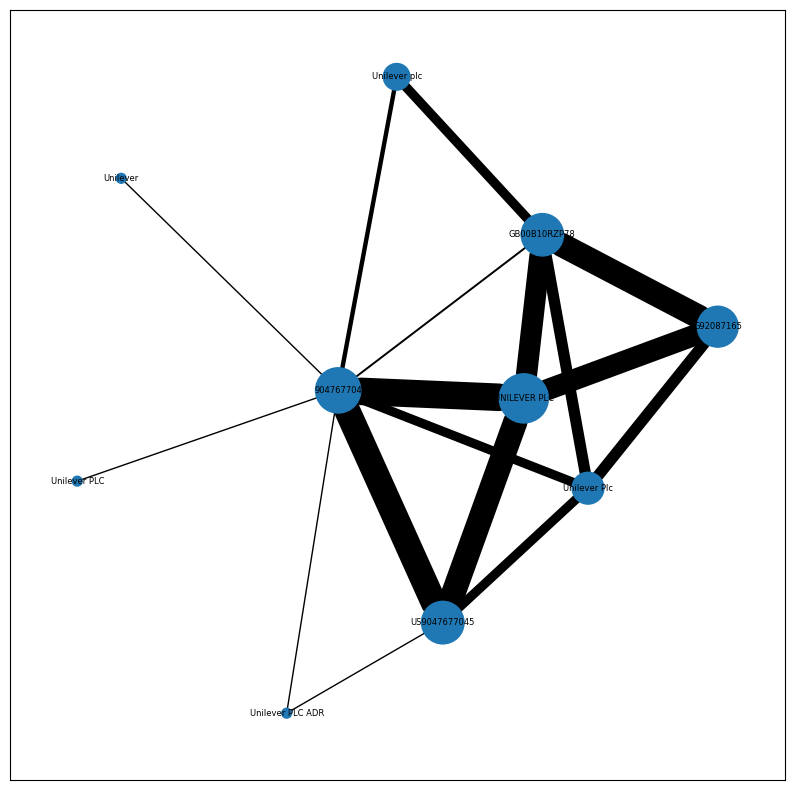

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


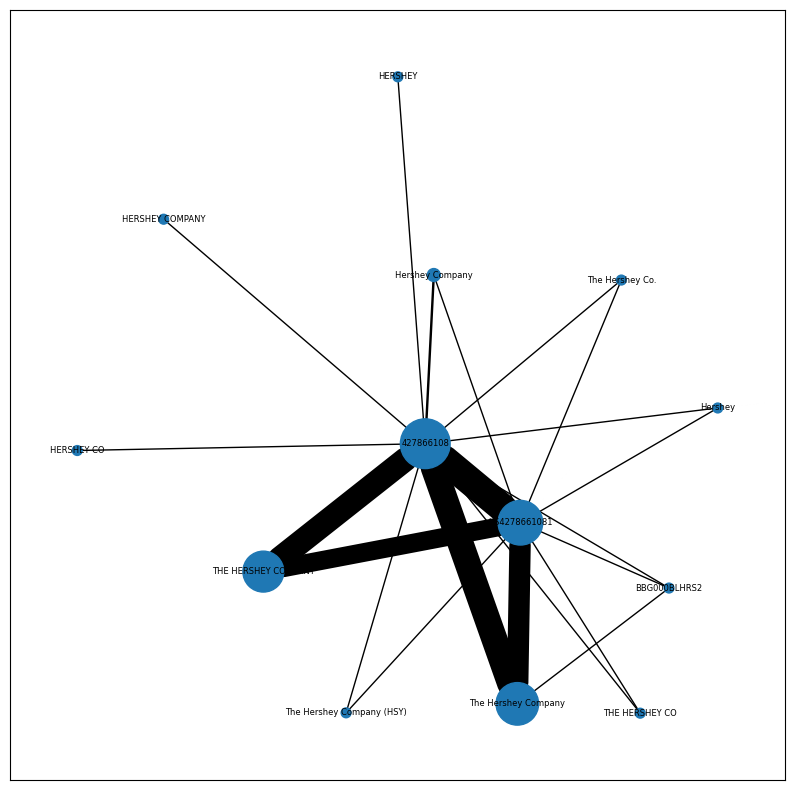

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


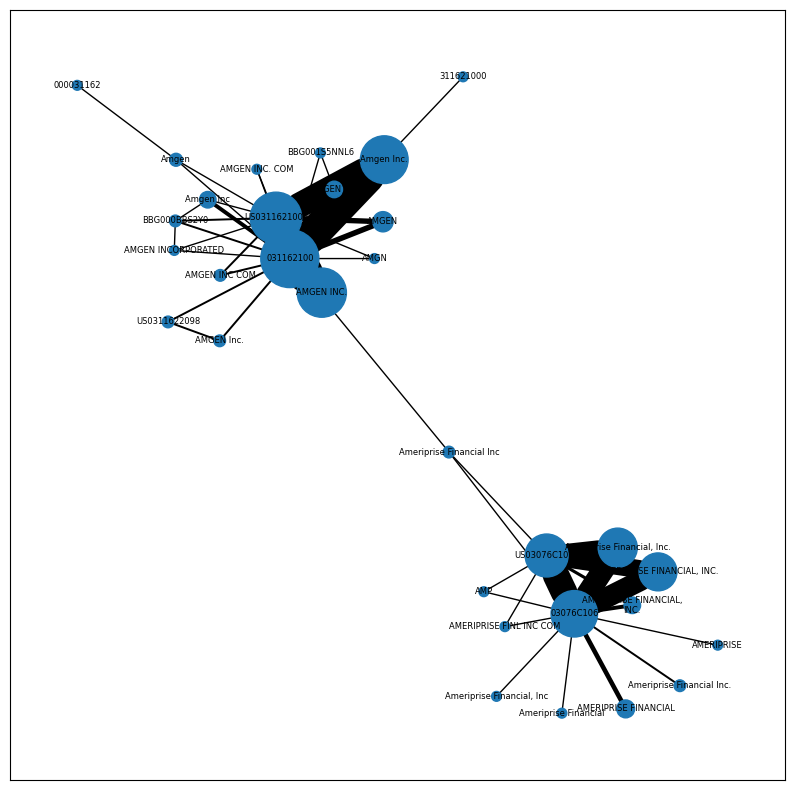

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


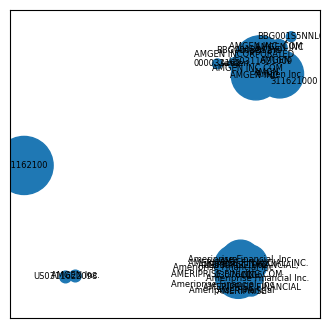

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


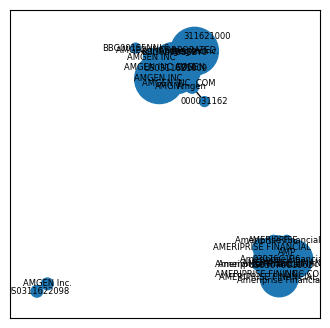

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.428 ----------------------------------------------------------------------------------------------------


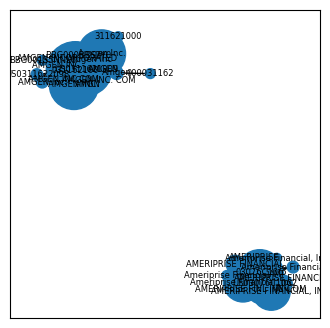

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


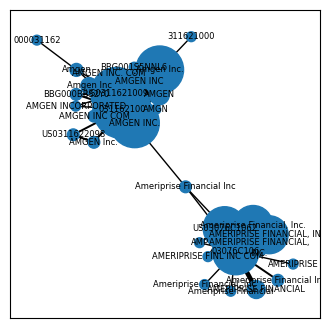

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0 ----------------------------------------------------------------------------------------------------


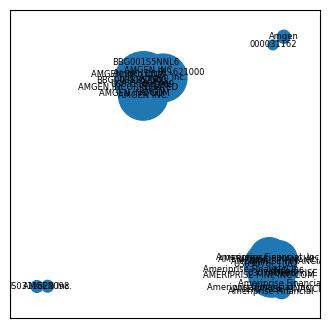

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.4282004530284895, 'spectral_clustering': 0, 'louvain': 0}
best_method='articulation_points'


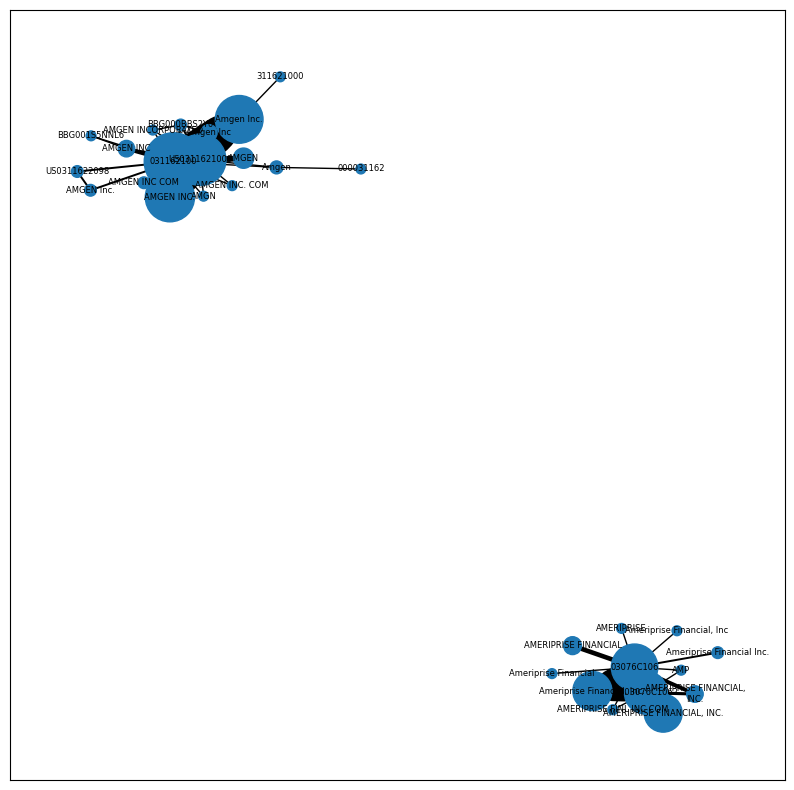

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


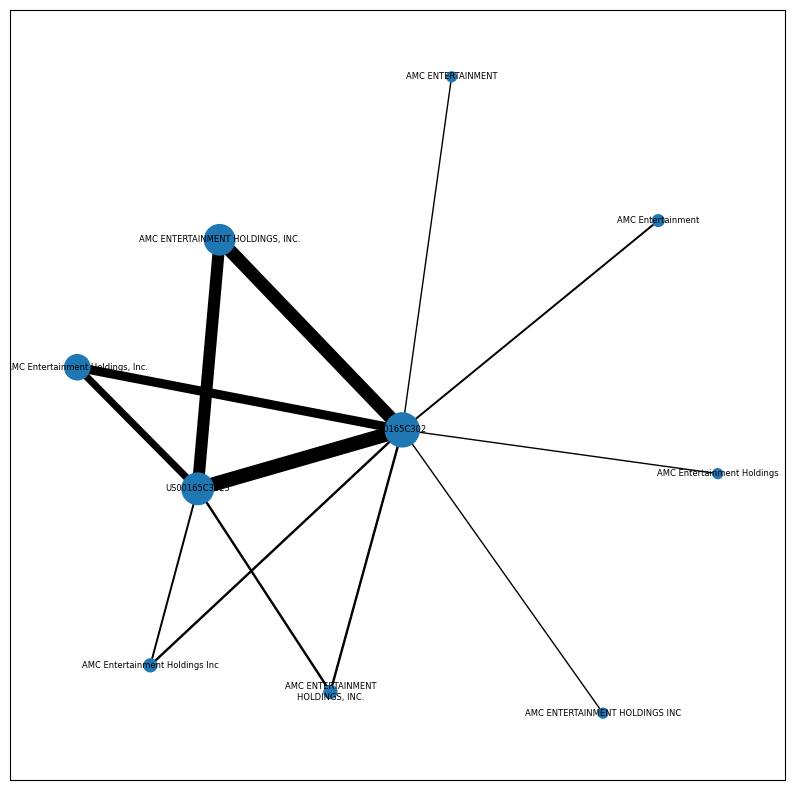

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


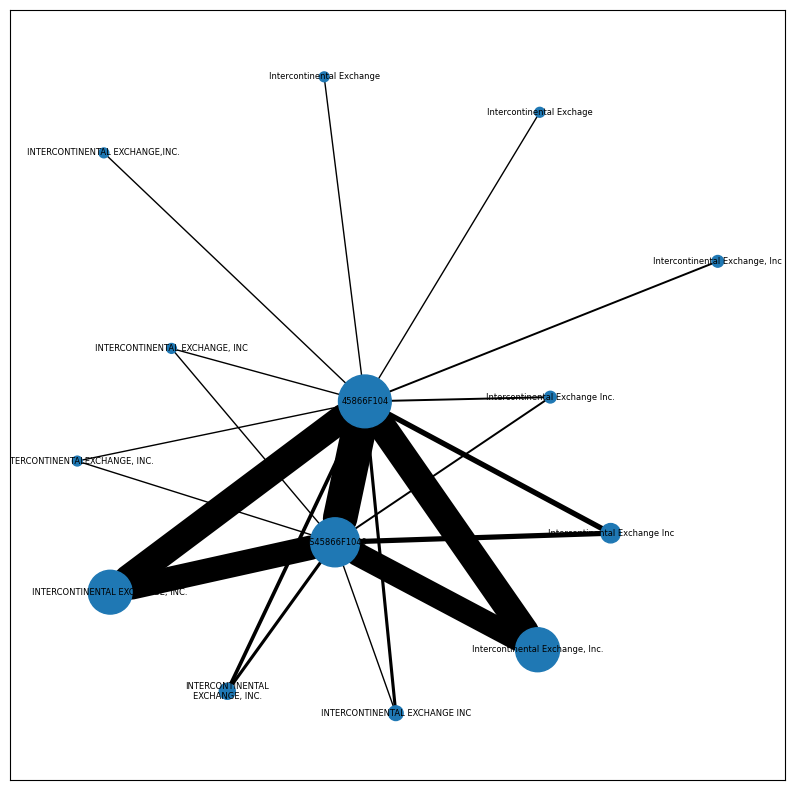

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


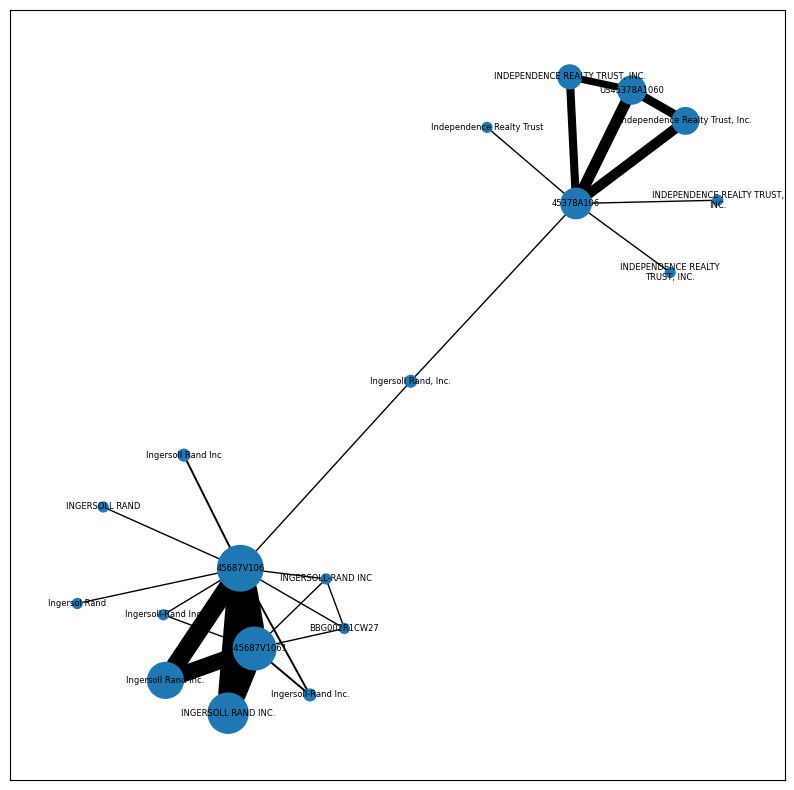

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


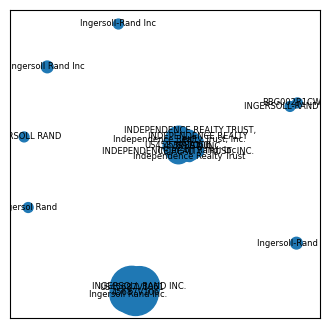

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


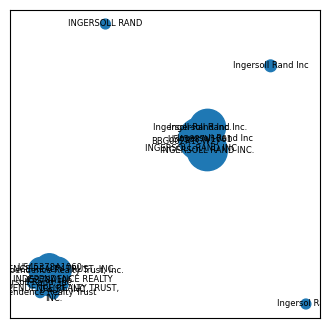

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.268 ----------------------------------------------------------------------------------------------------


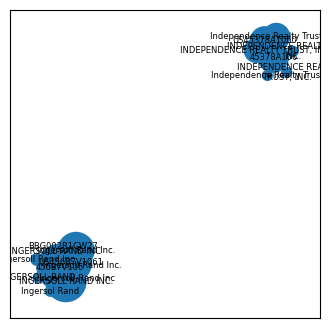

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


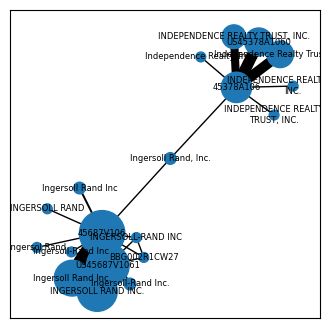

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0 ----------------------------------------------------------------------------------------------------


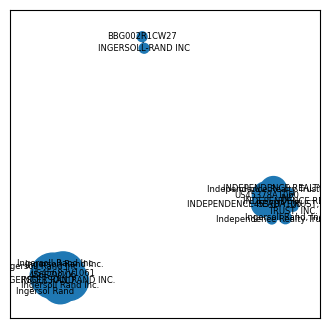

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.26825215607574826, 'spectral_clustering': 0, 'louvain': 0}
best_method='articulation_points'


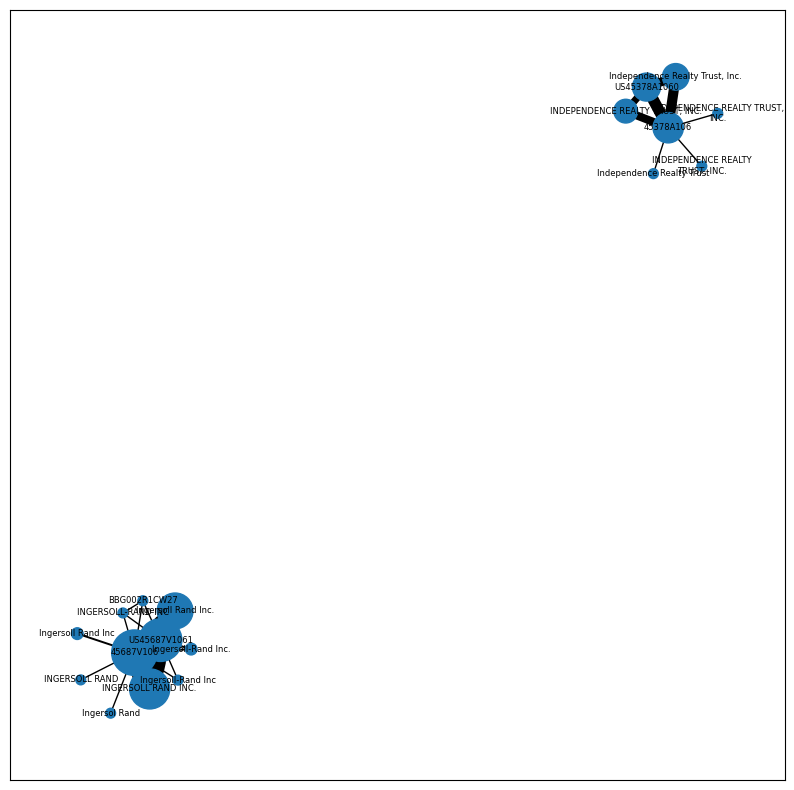

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


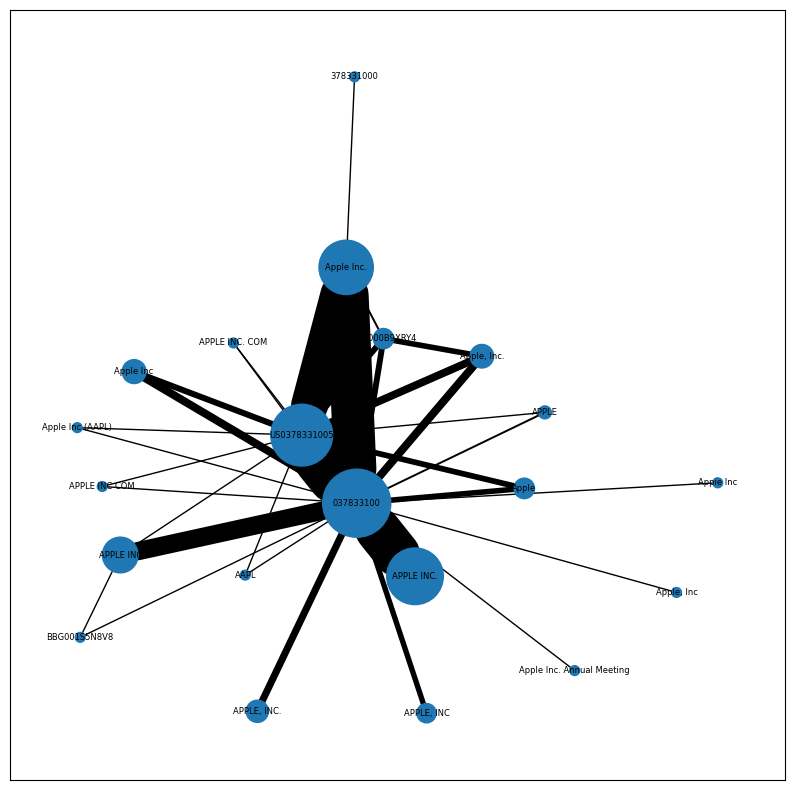

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


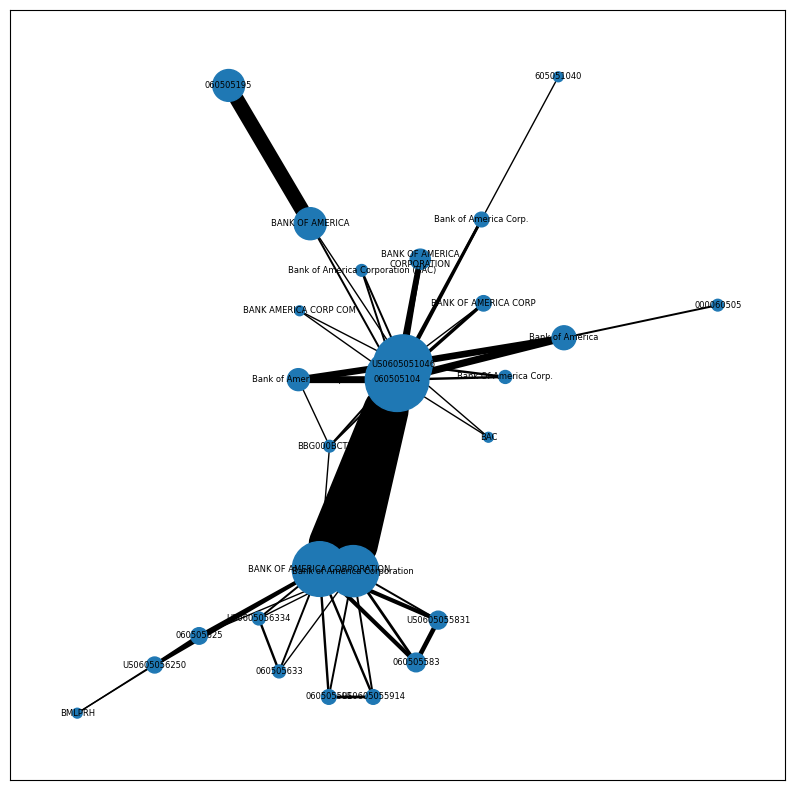

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0.0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


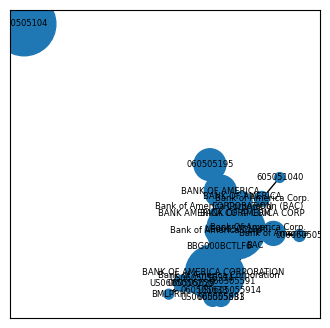

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


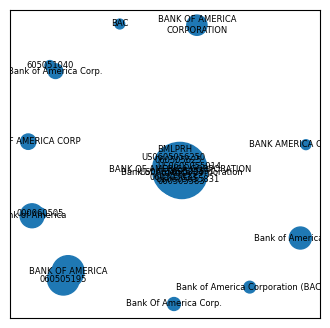

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.0 ----------------------------------------------------------------------------------------------------


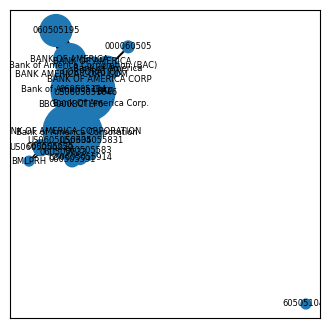

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


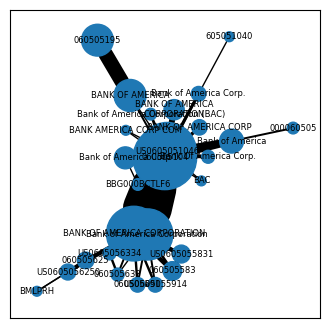

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0 ----------------------------------------------------------------------------------------------------


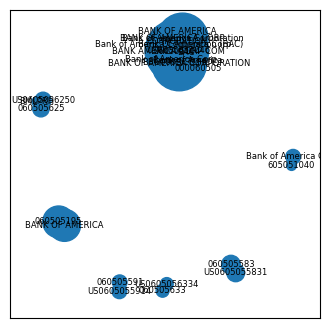

/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:343: UserWarning: Returning unmodified graph, because `best_score` == 0
k=2
best_score=0.0
method_scores={'kmeans': 0.0, 'betweenness_centrality': 0, 'articulation_points': 0.0, 'spectral_clustering': 0, 'louvain': 0}
  warn(warning_str)


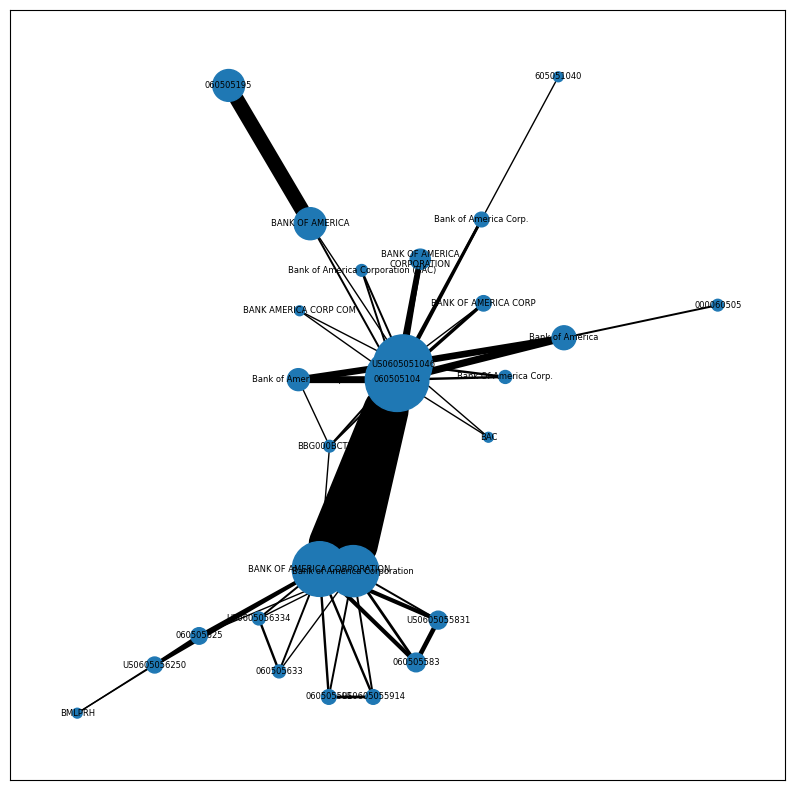

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


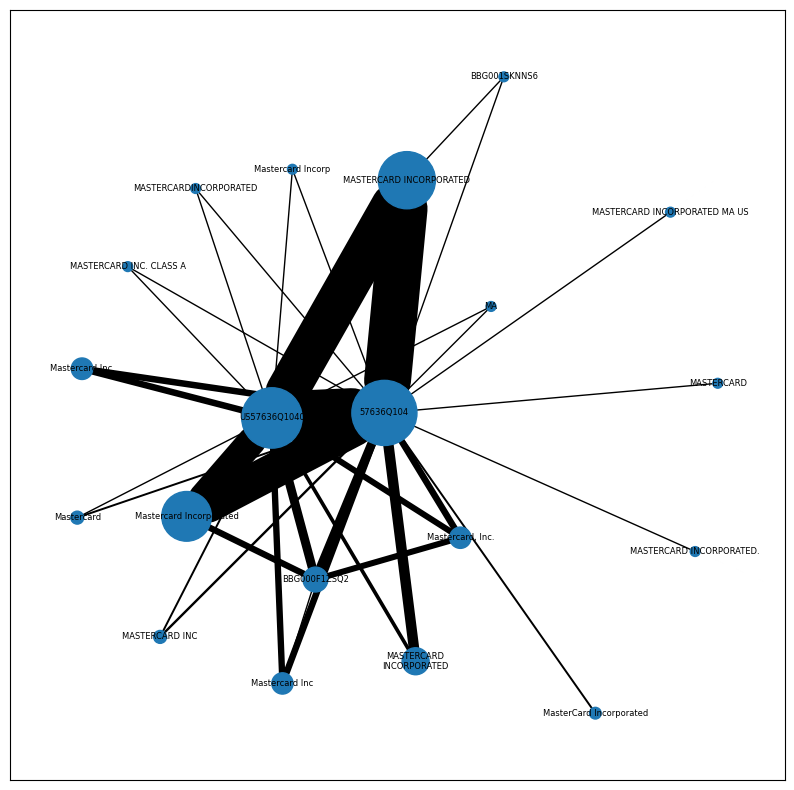

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


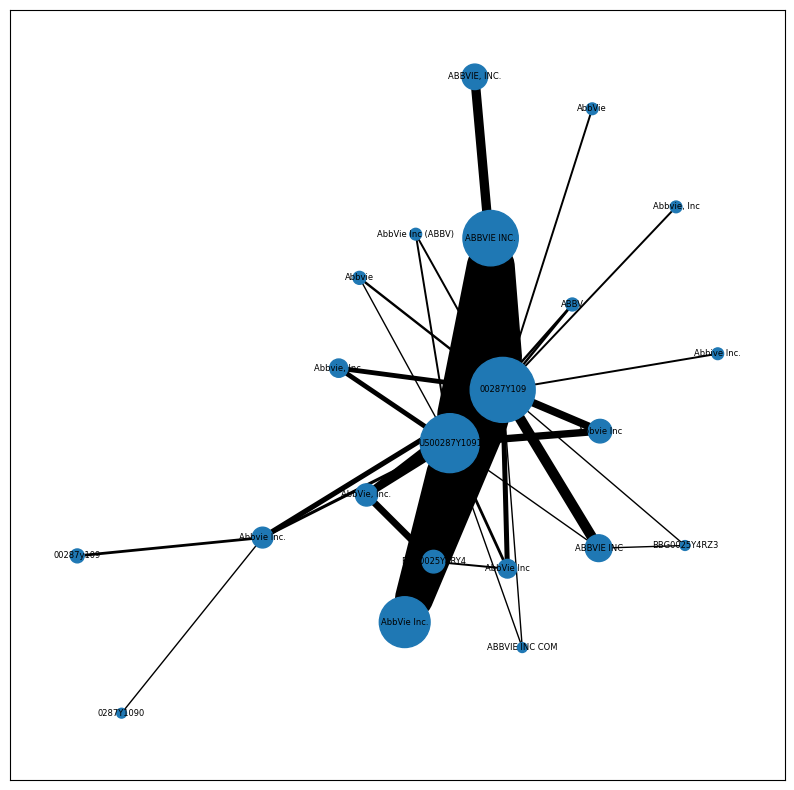

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


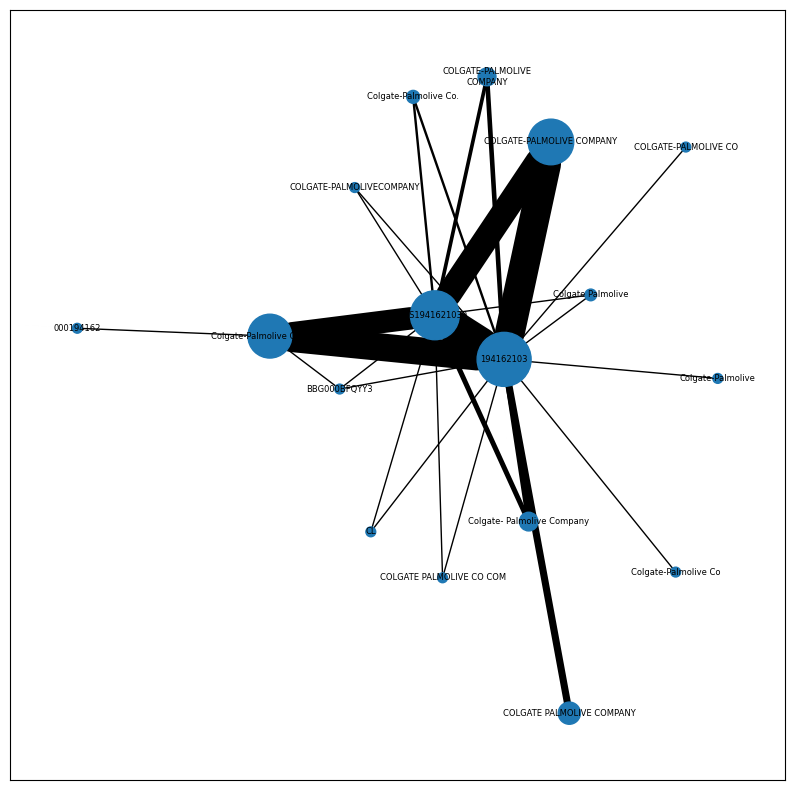

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


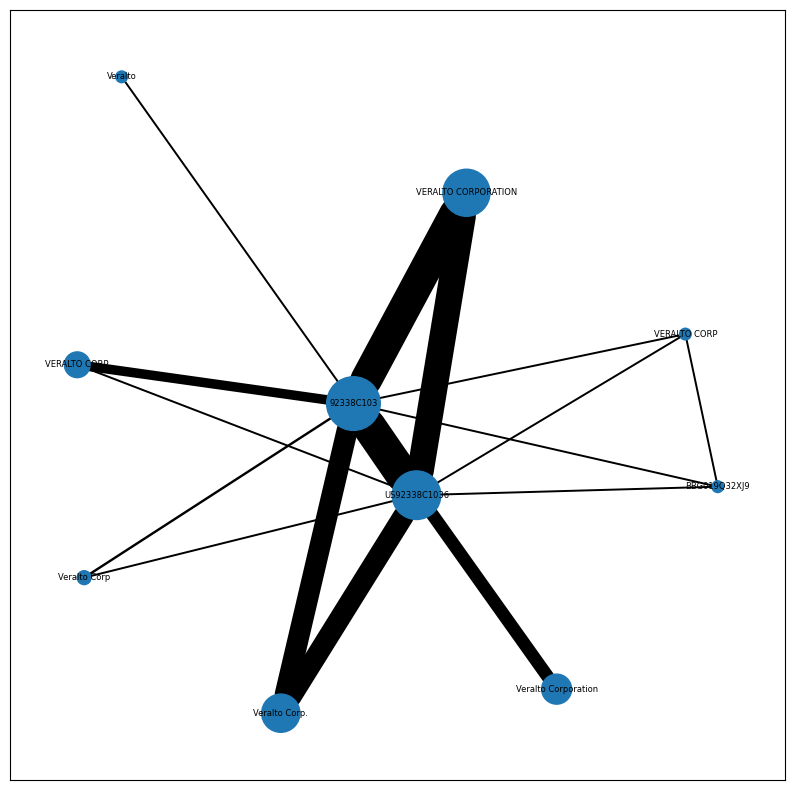

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


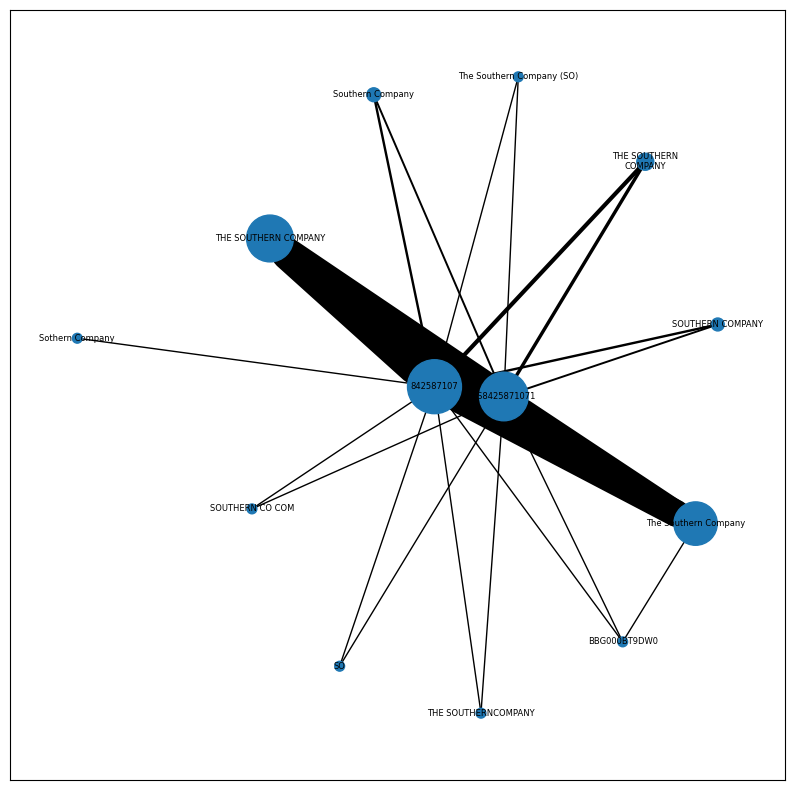

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


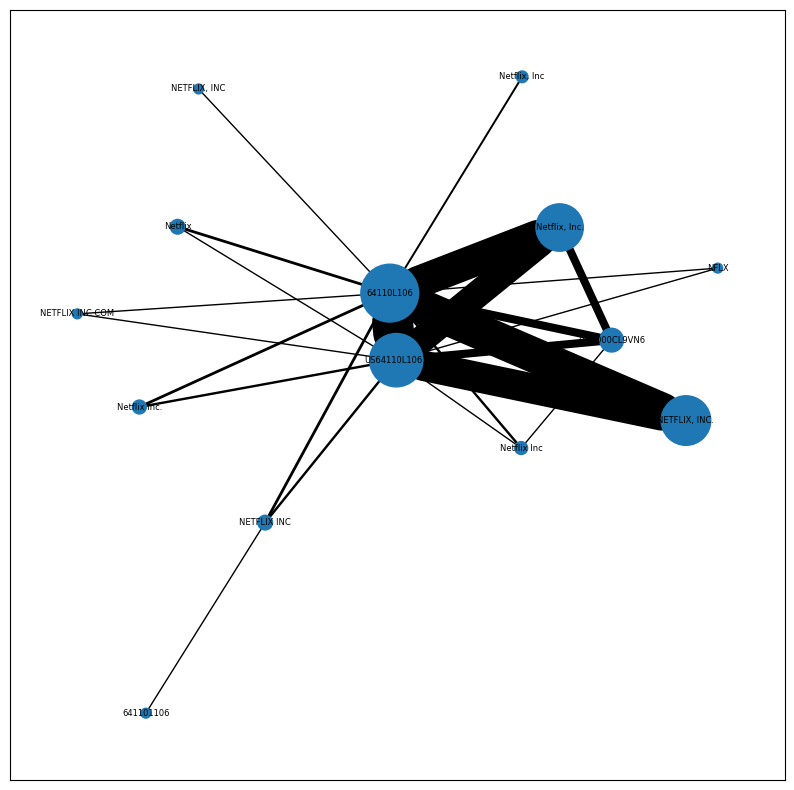

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


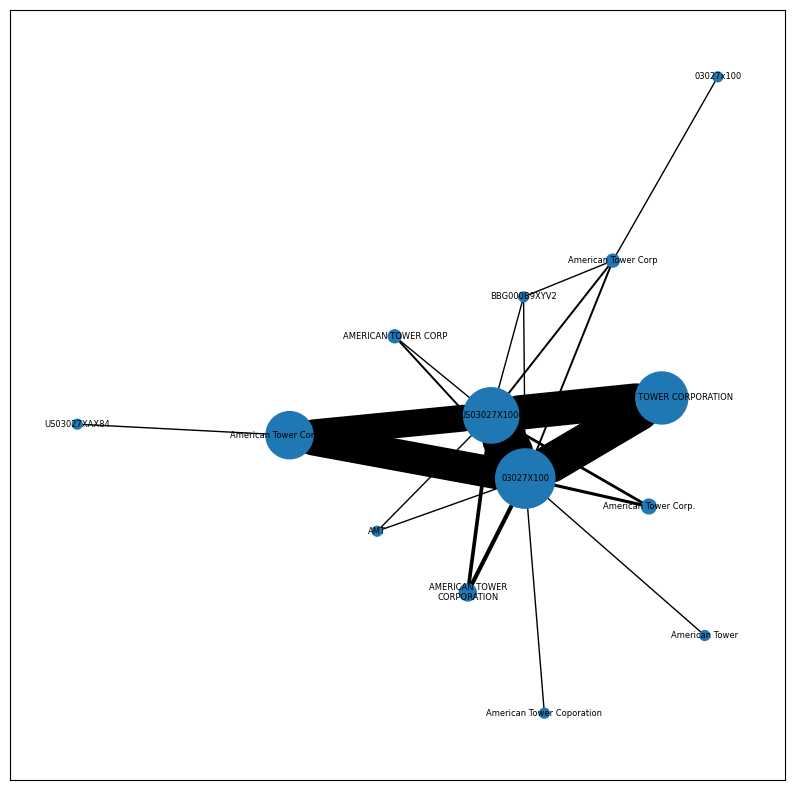

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


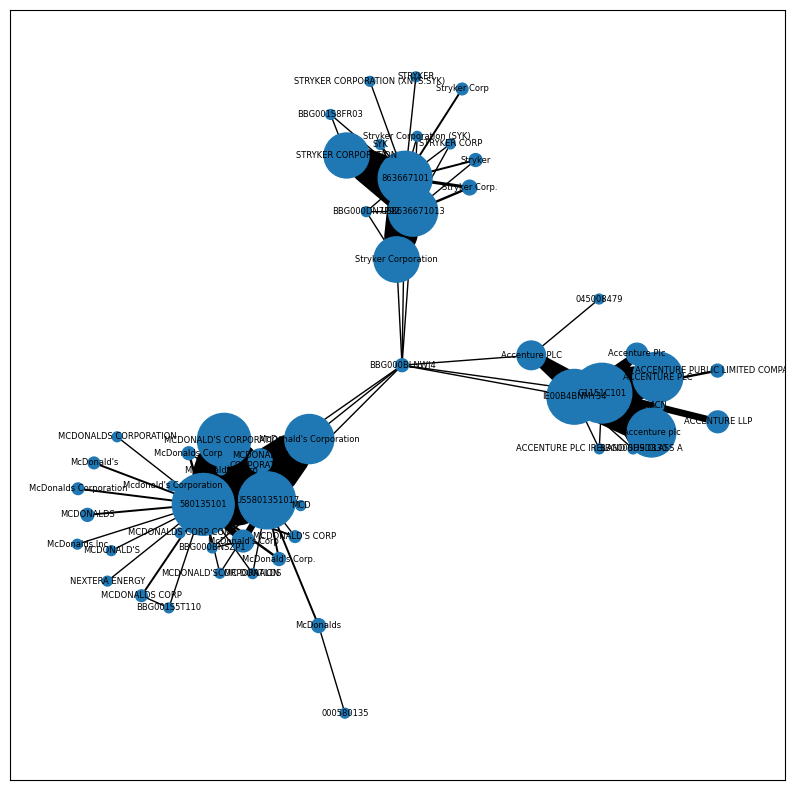

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


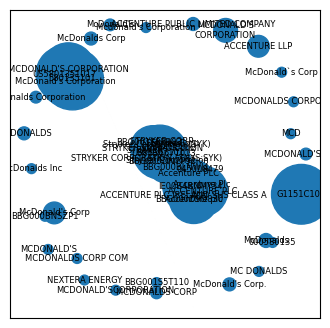

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0.65 ----------------------------------------------------------------------------------------------------


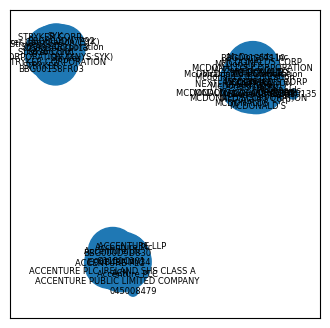

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.65 ----------------------------------------------------------------------------------------------------


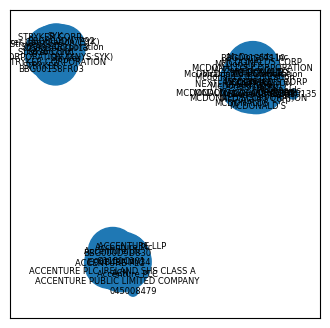

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


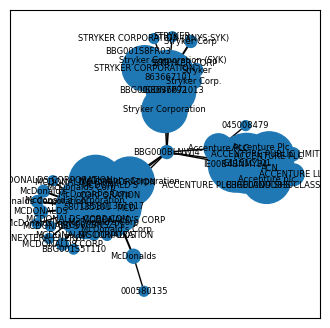

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.65 ----------------------------------------------------------------------------------------------------


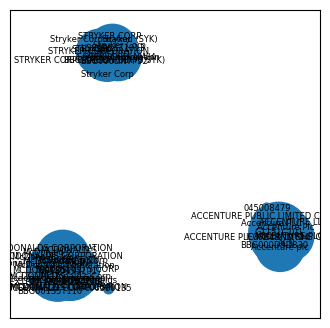

method_scores={'kmeans': 0, 'betweenness_centrality': 0.6500122784445231, 'articulation_points': 0.6500122784445231, 'spectral_clustering': 0, 'louvain': 0.6500870463262813}
best_method='louvain'


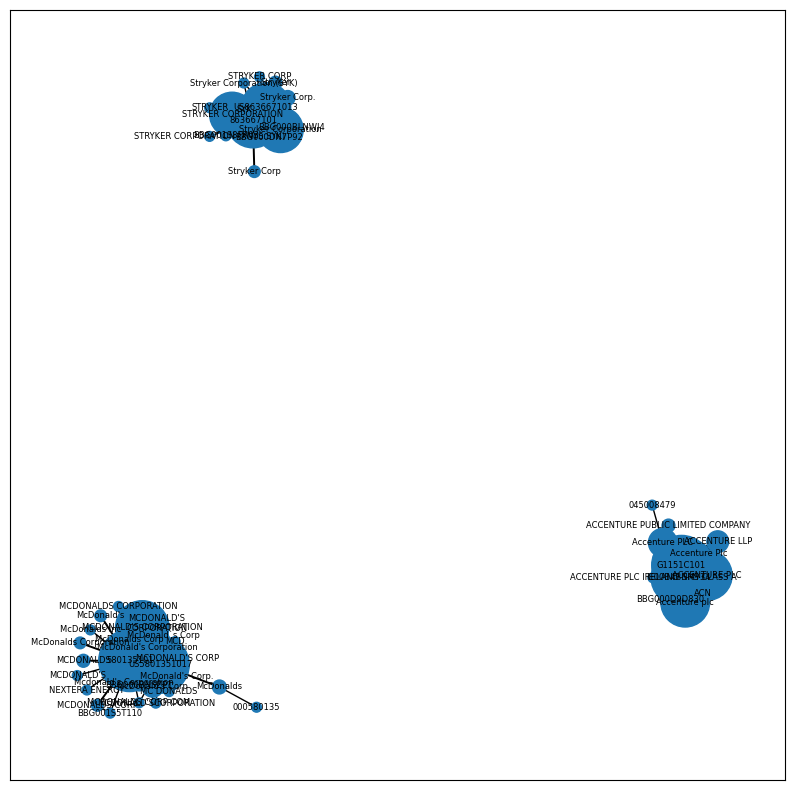

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


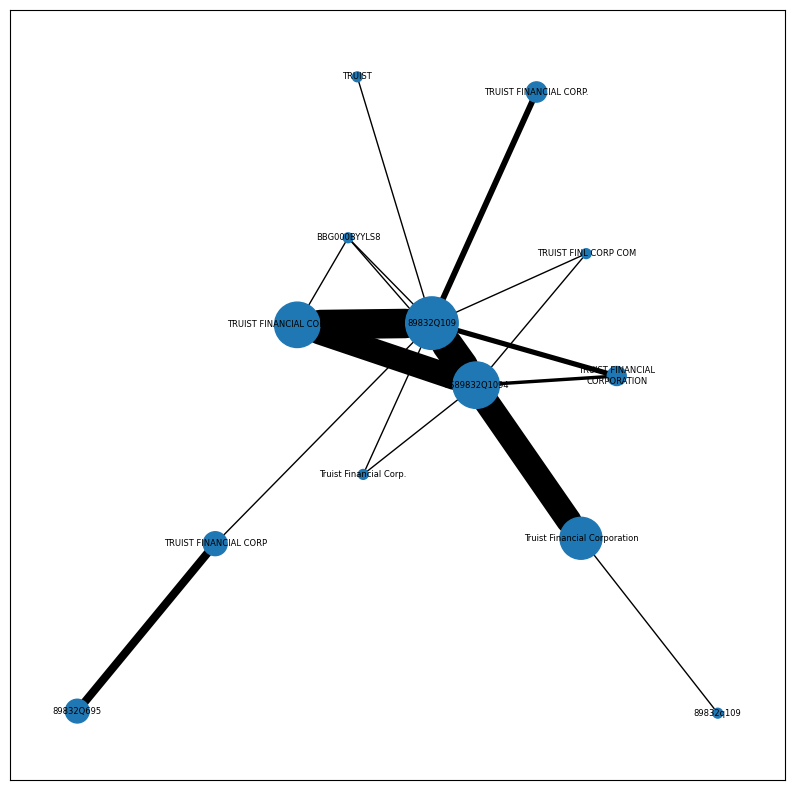

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


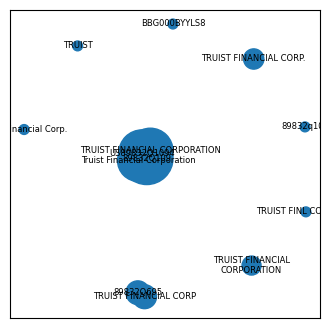

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


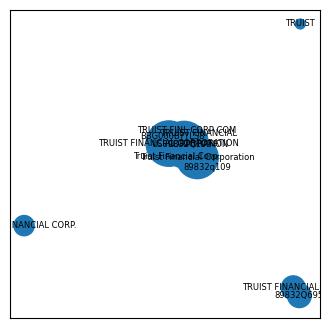

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.0 ----------------------------------------------------------------------------------------------------


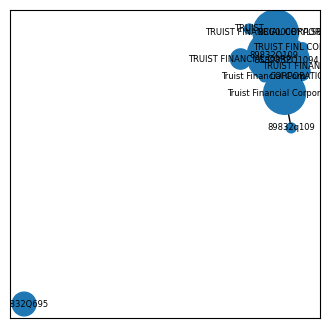

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


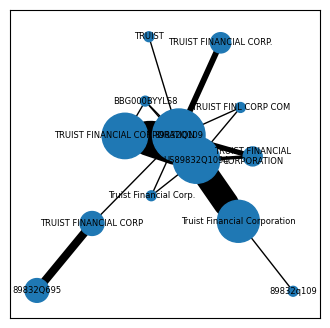

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.036 ----------------------------------------------------------------------------------------------------


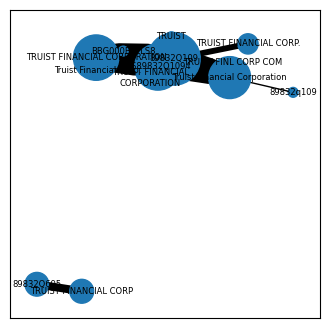

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.0, 'spectral_clustering': 0, 'louvain': 0.03606209910043229}
best_method='louvain'


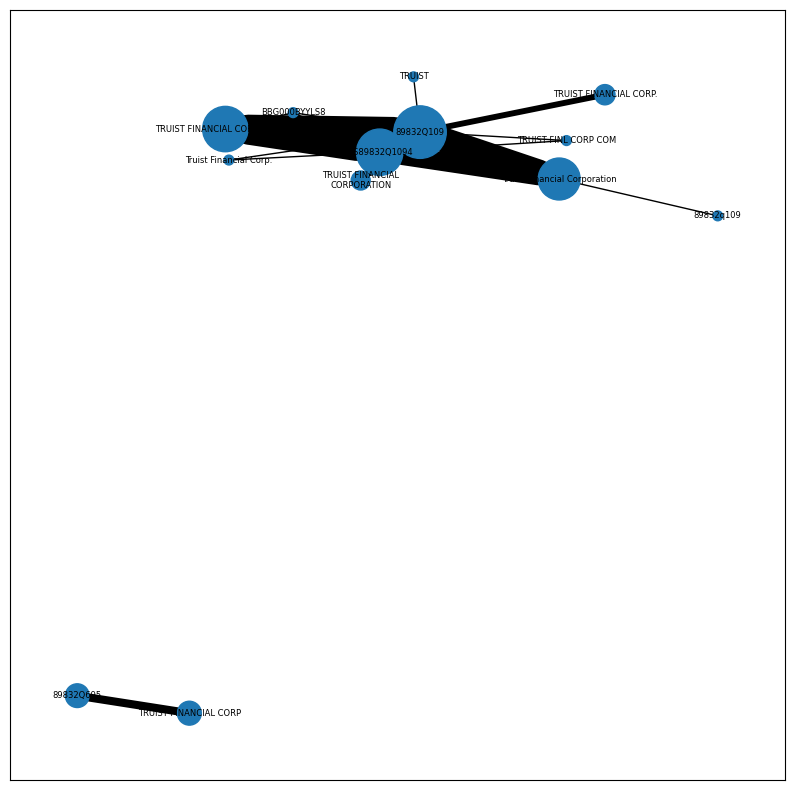

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


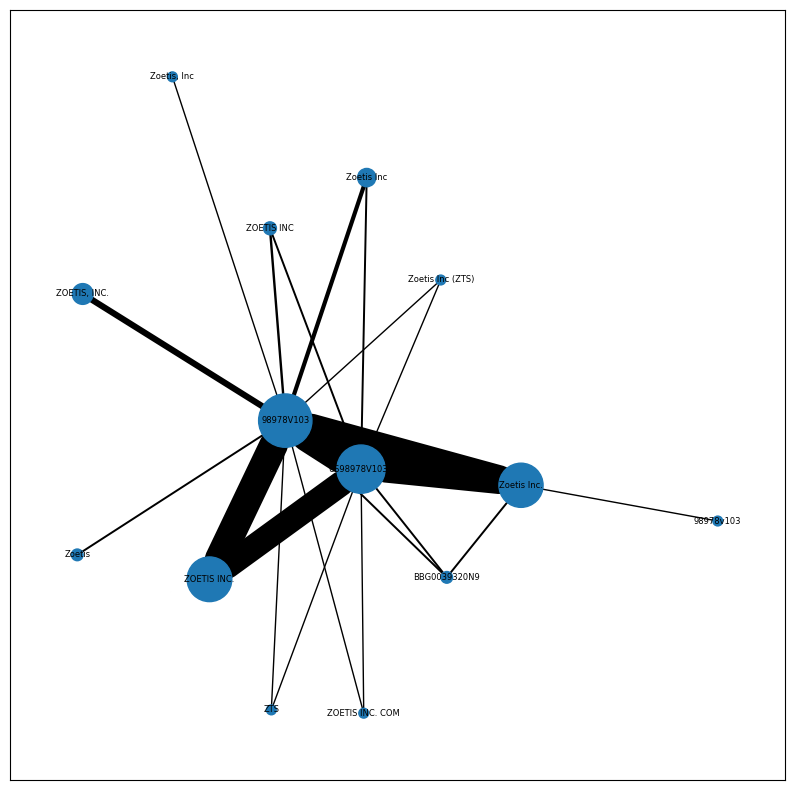

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


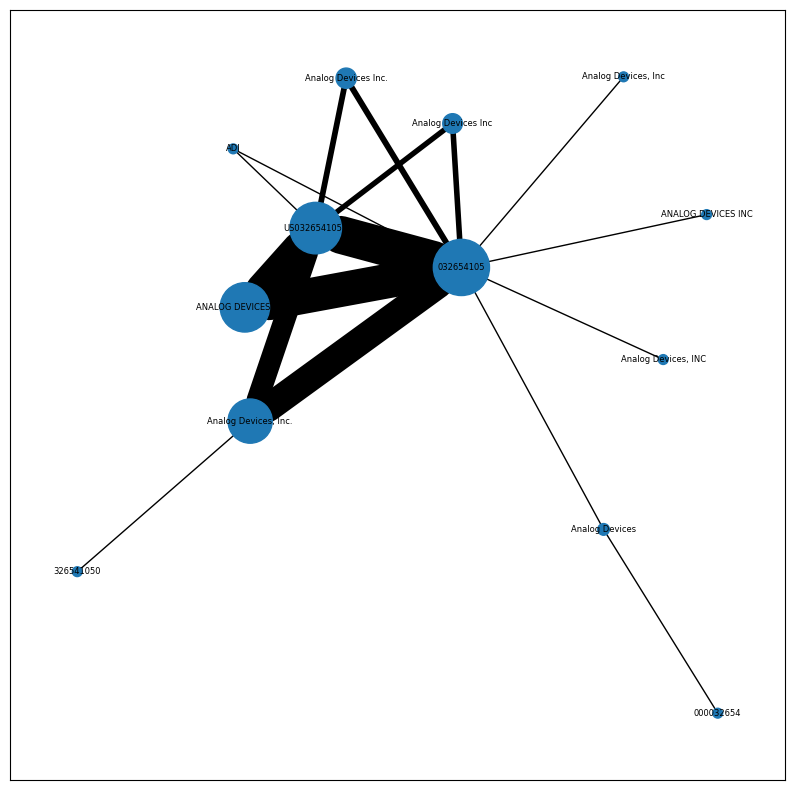

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


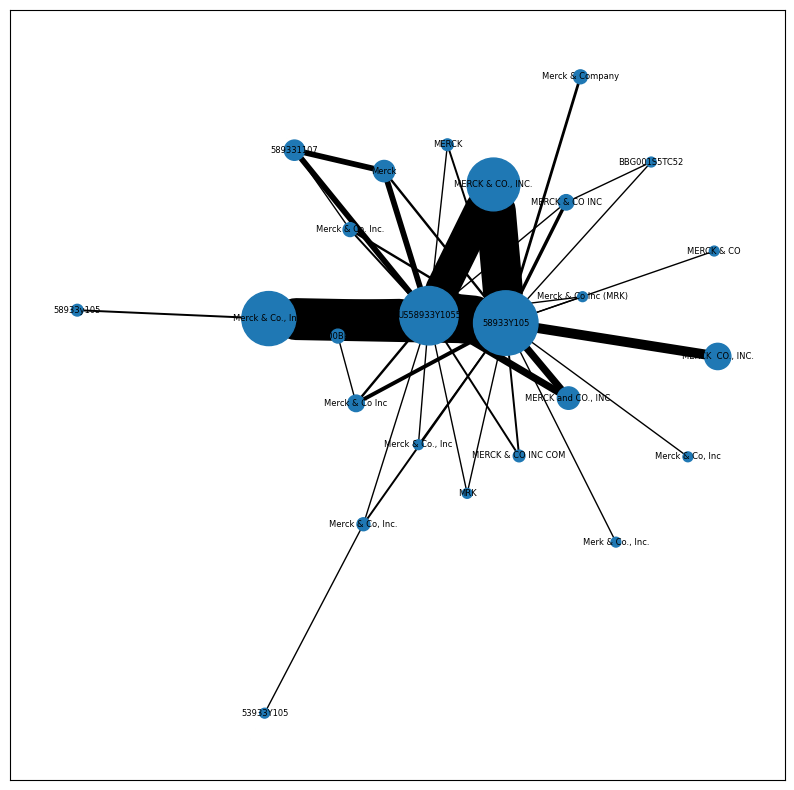

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


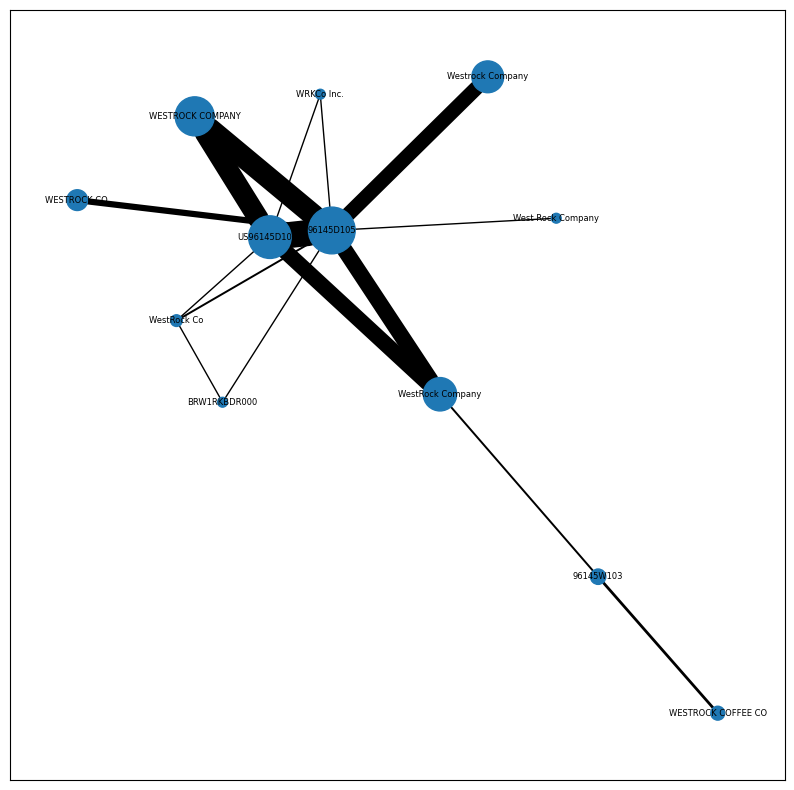

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


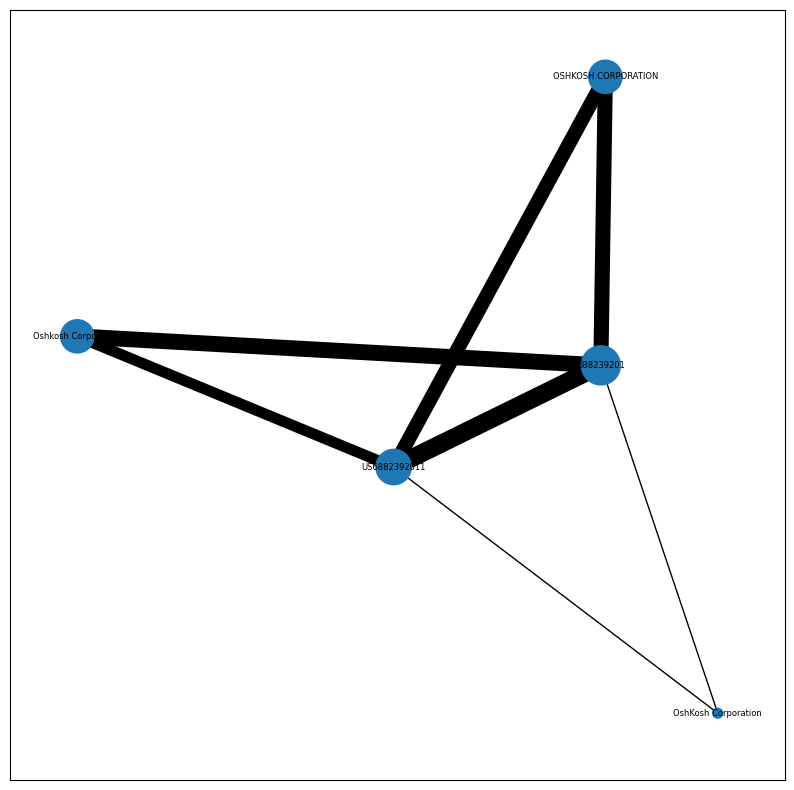

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


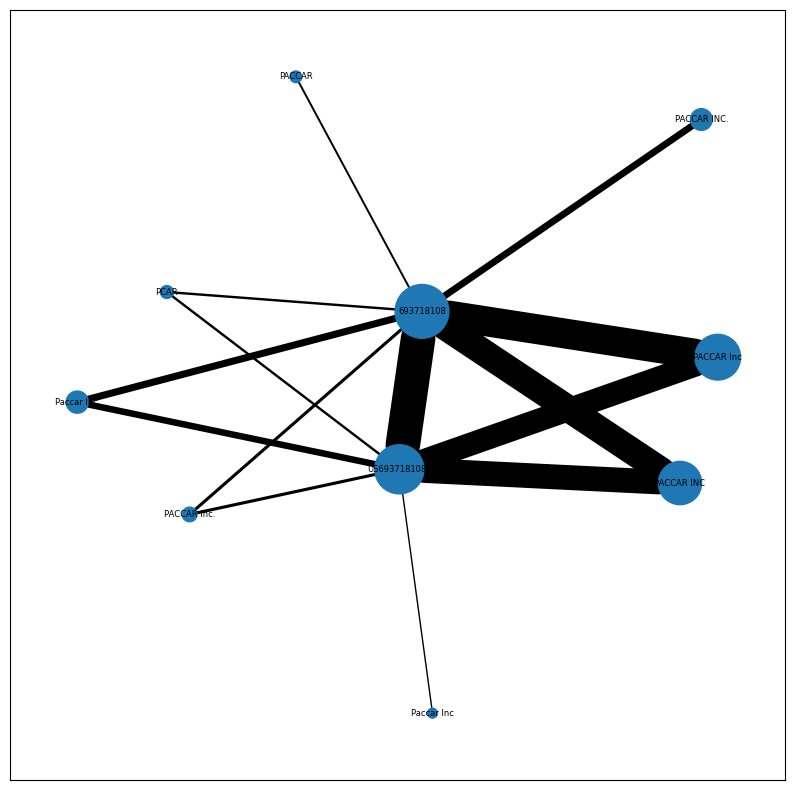

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


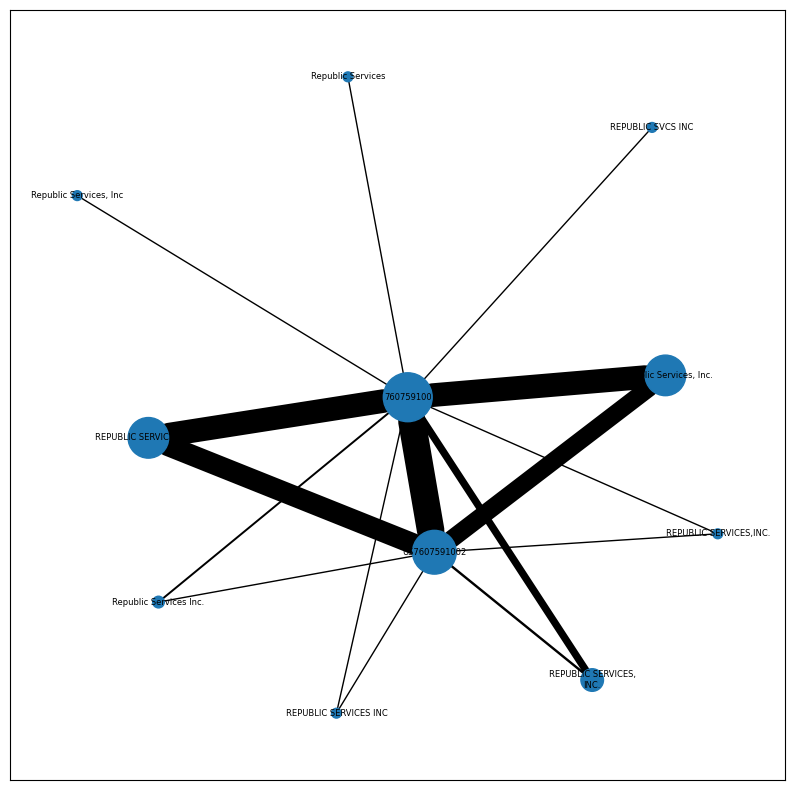

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


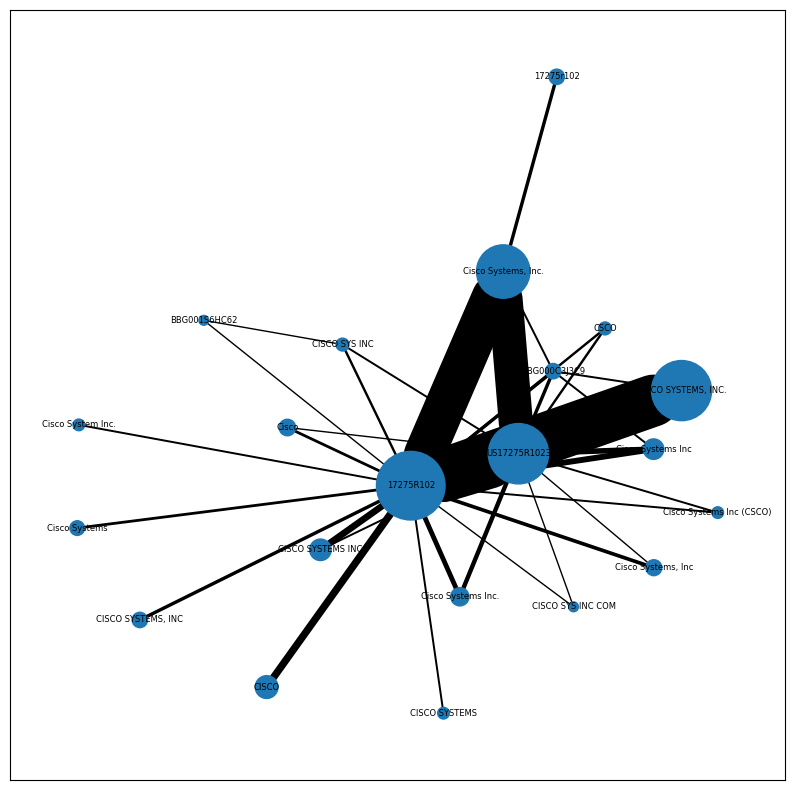

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


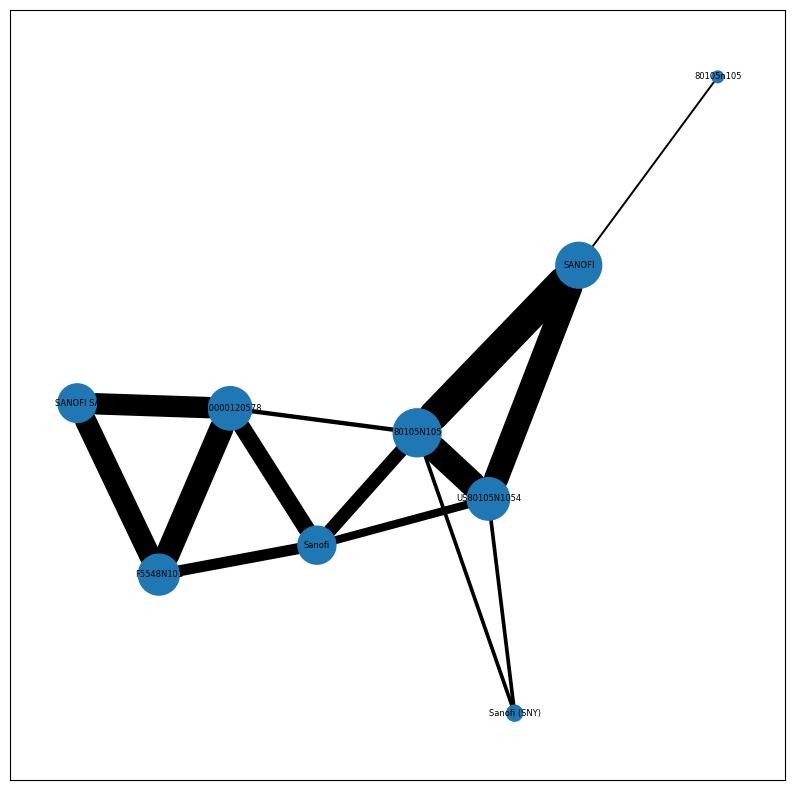

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


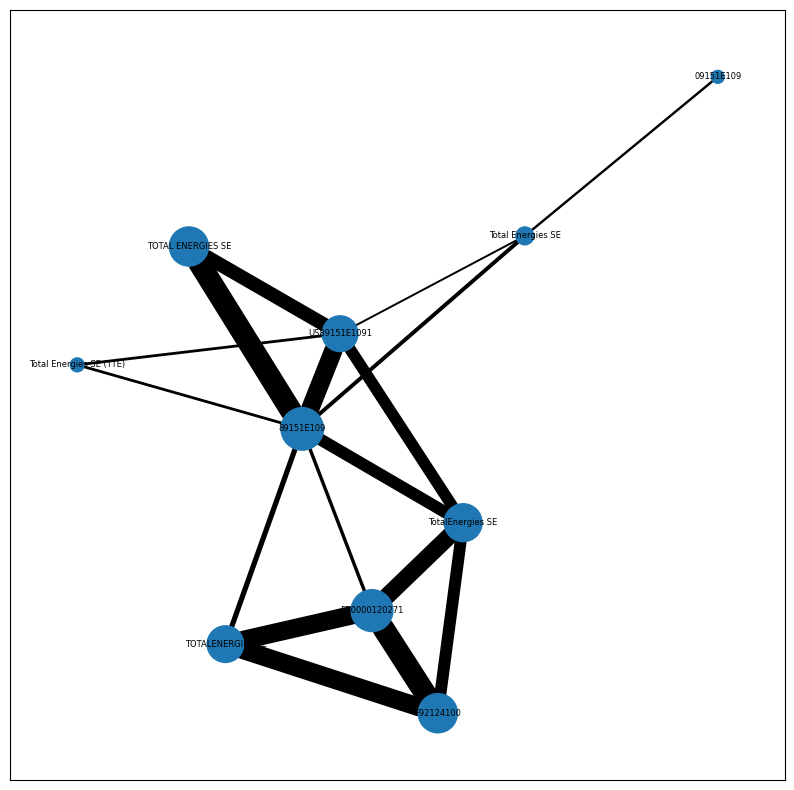

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


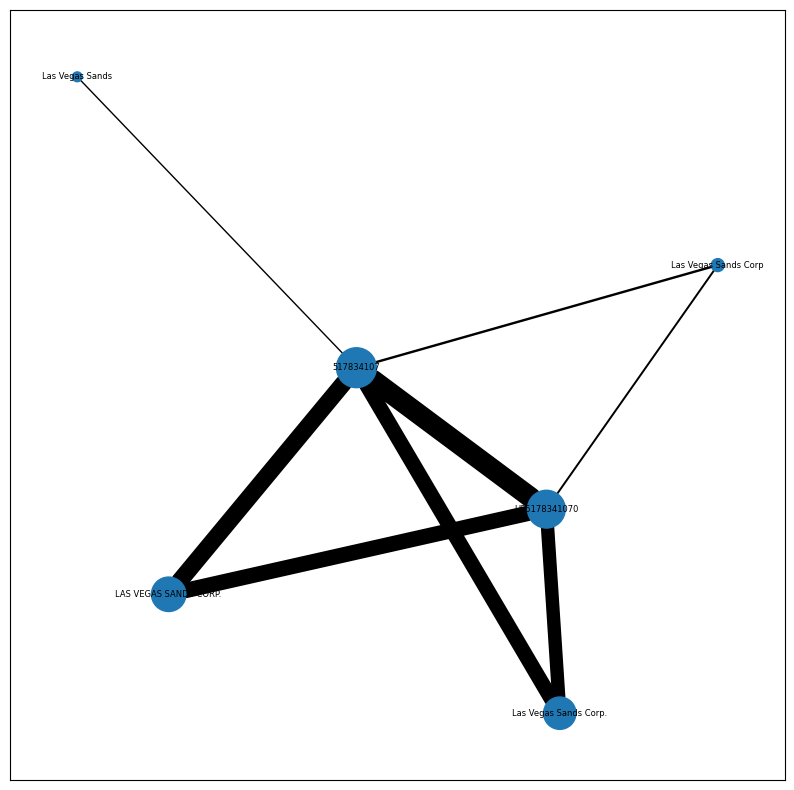

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


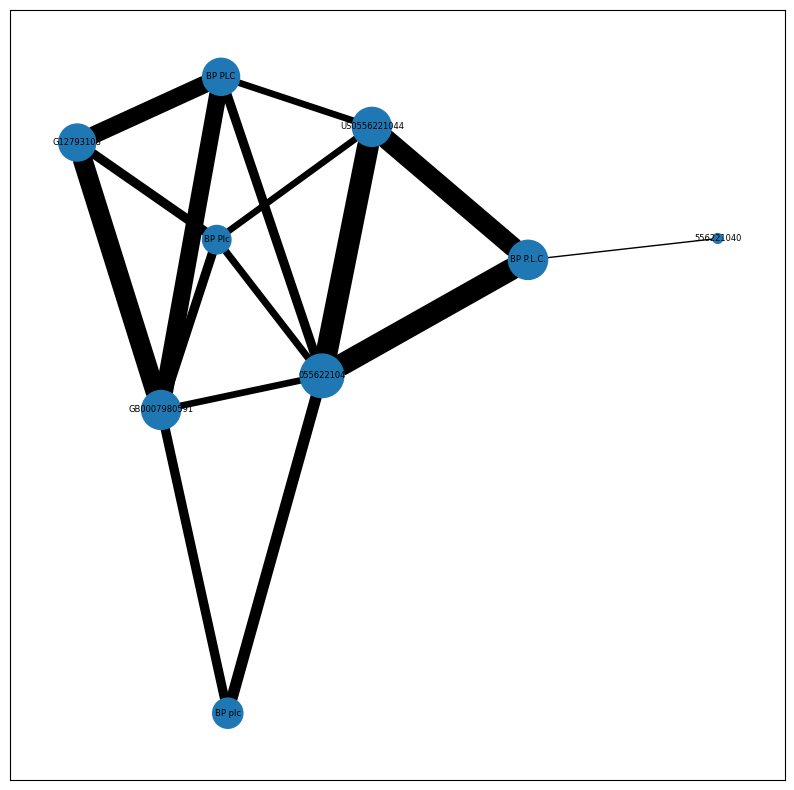

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


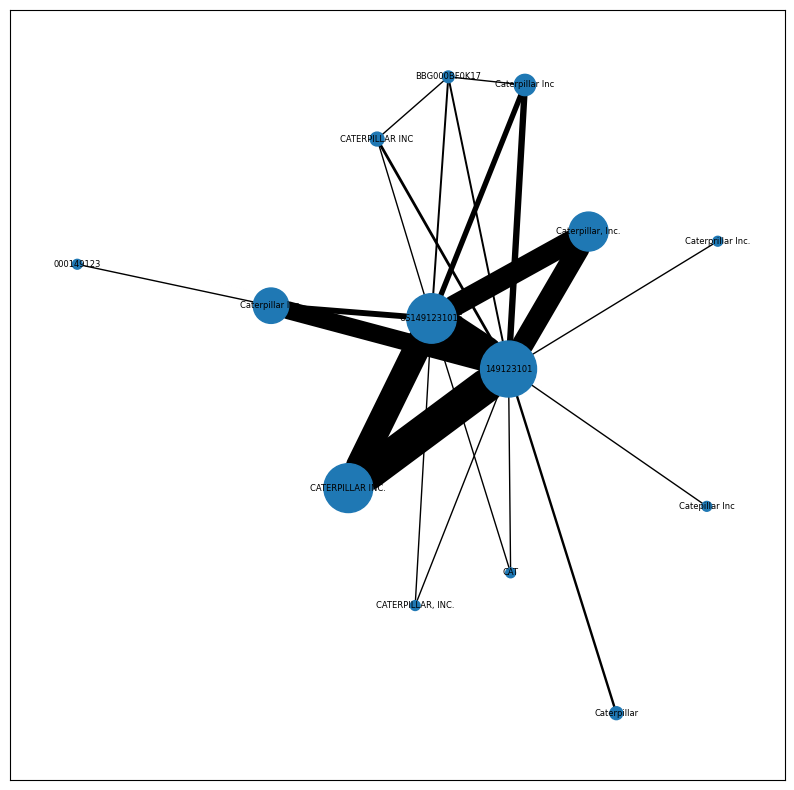

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


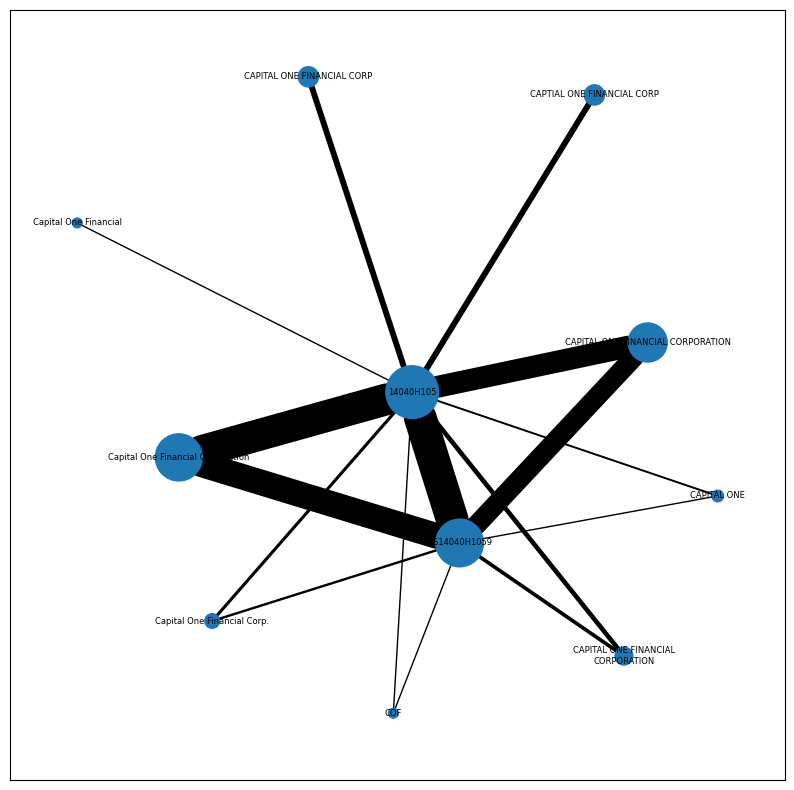

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


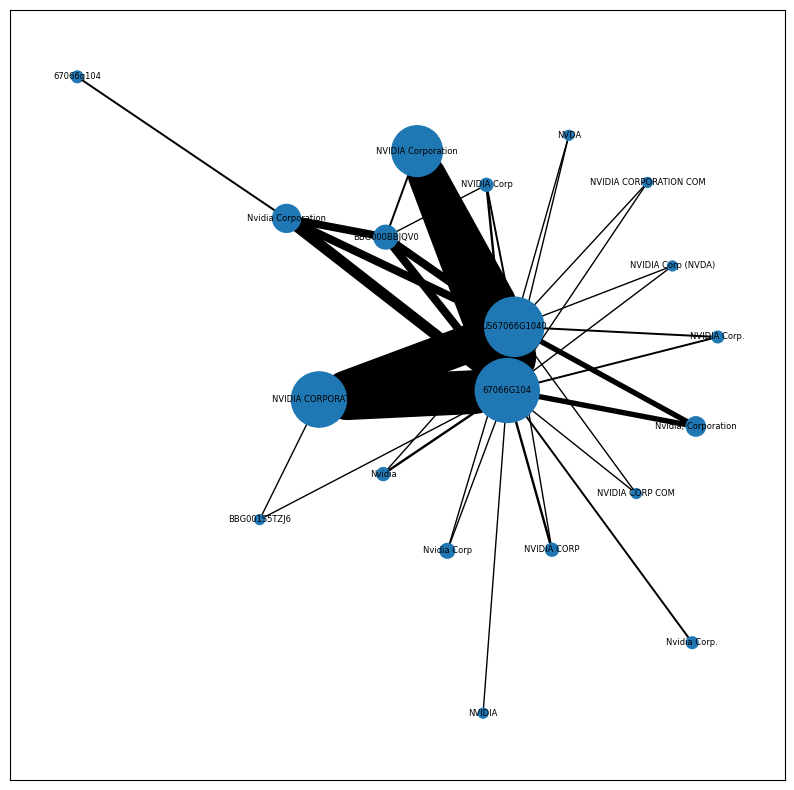

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


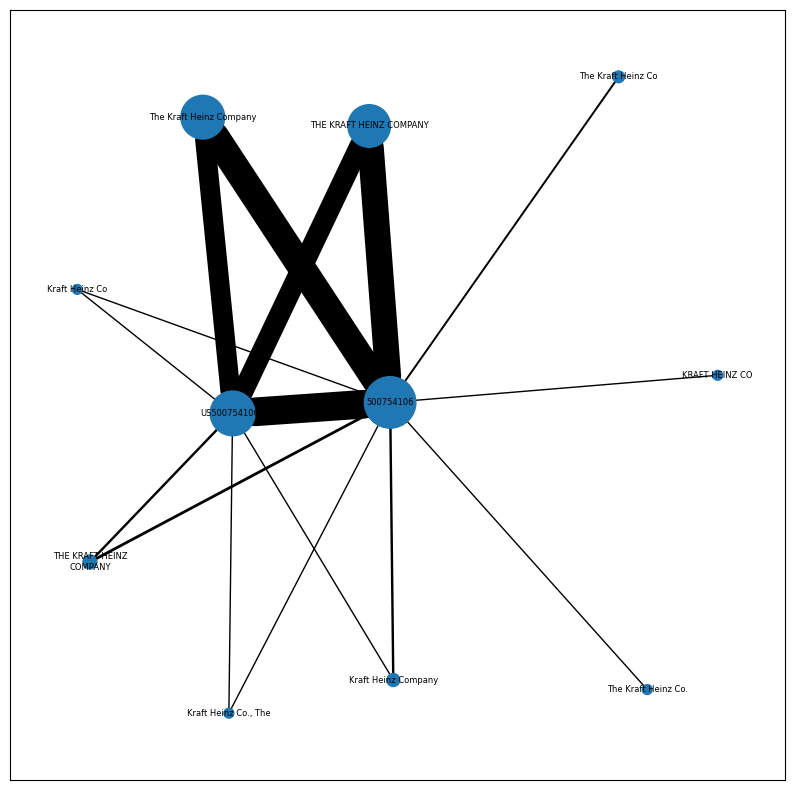

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


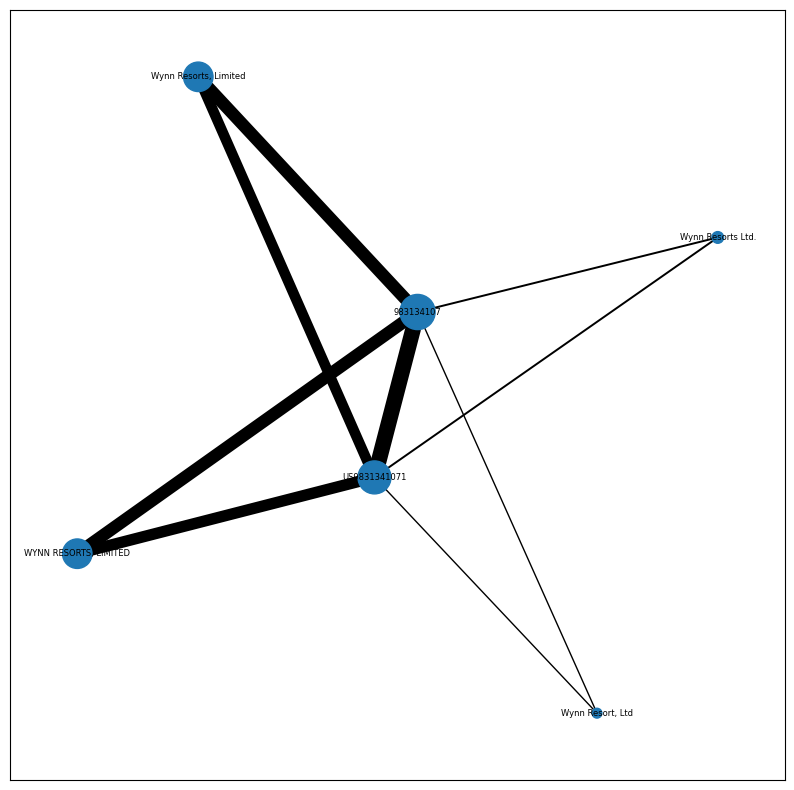

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


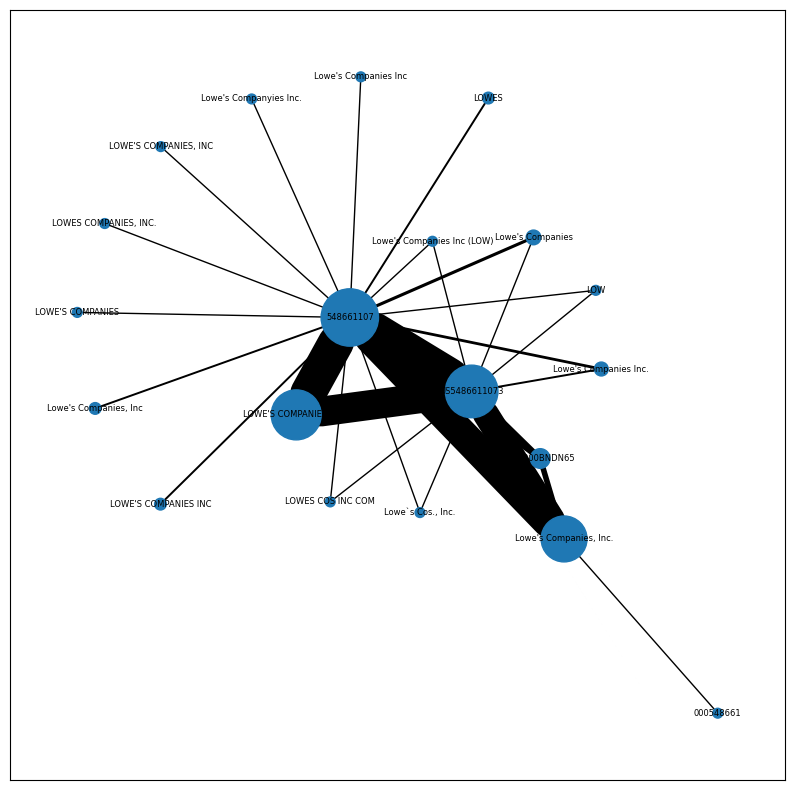

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


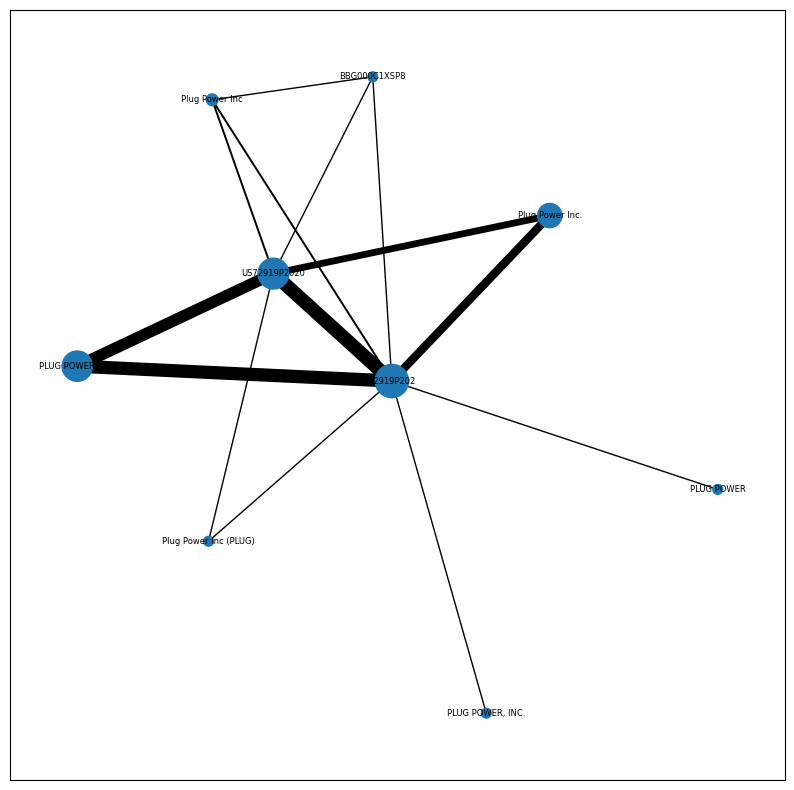

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


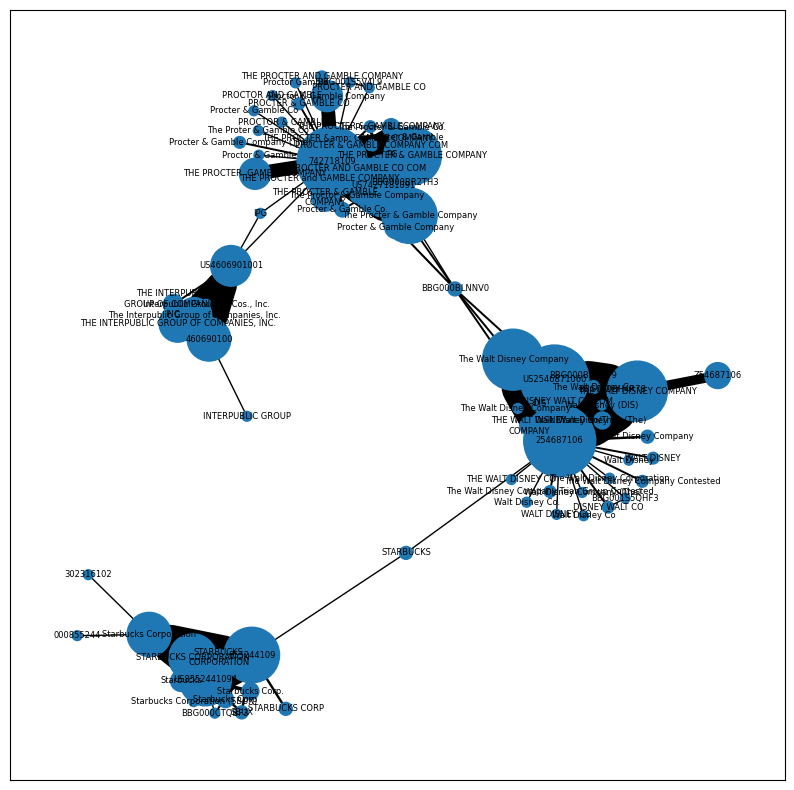

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


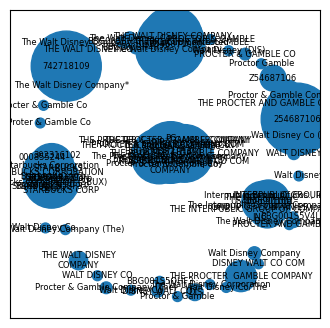

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


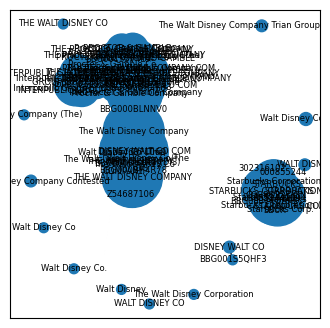

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.632 ----------------------------------------------------------------------------------------------------


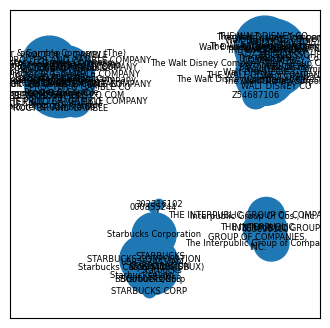

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


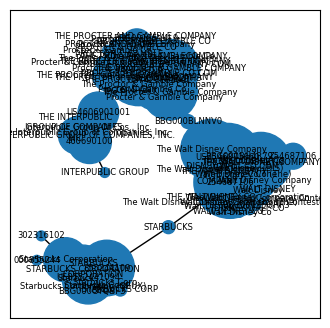

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.654 ----------------------------------------------------------------------------------------------------


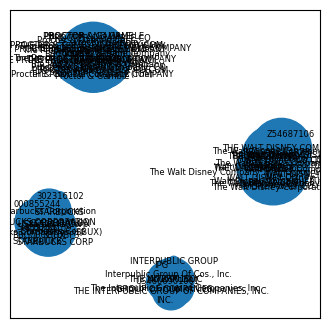

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.6322125923876205, 'spectral_clustering': 0, 'louvain': 0.654431776226458}
best_method='louvain'


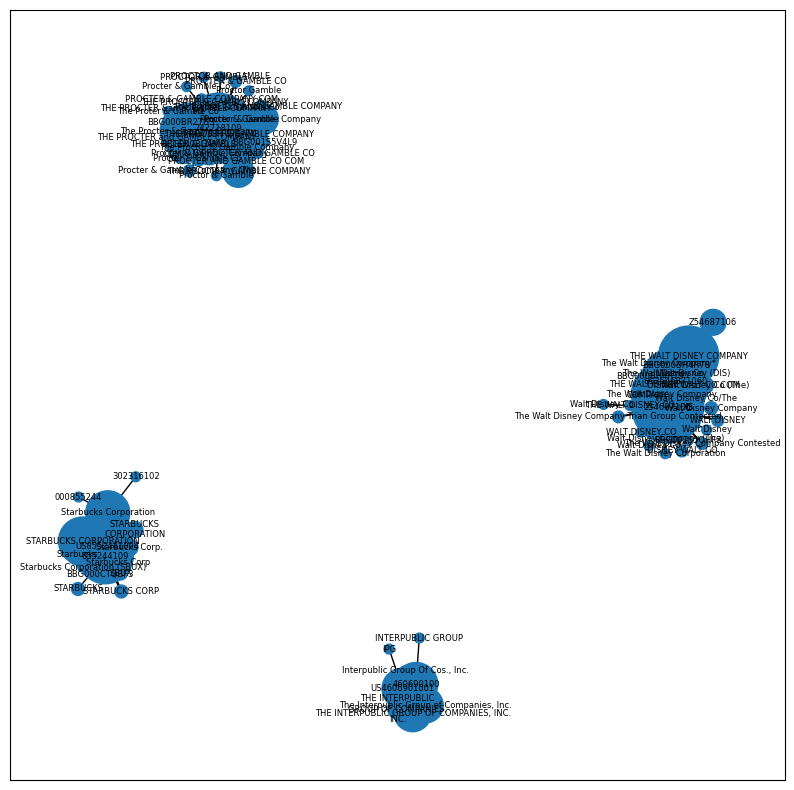

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


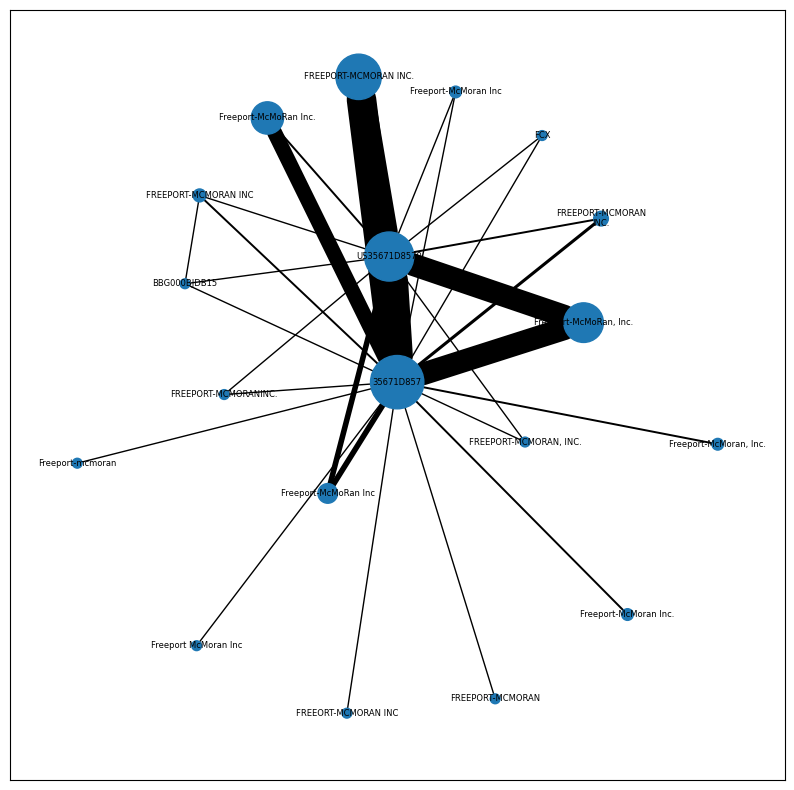

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


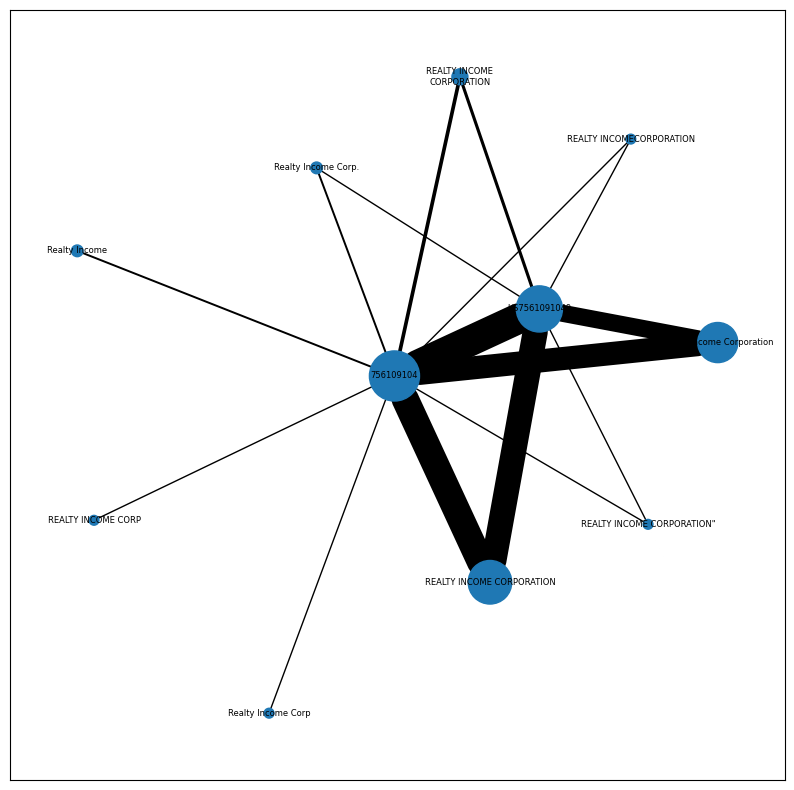

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


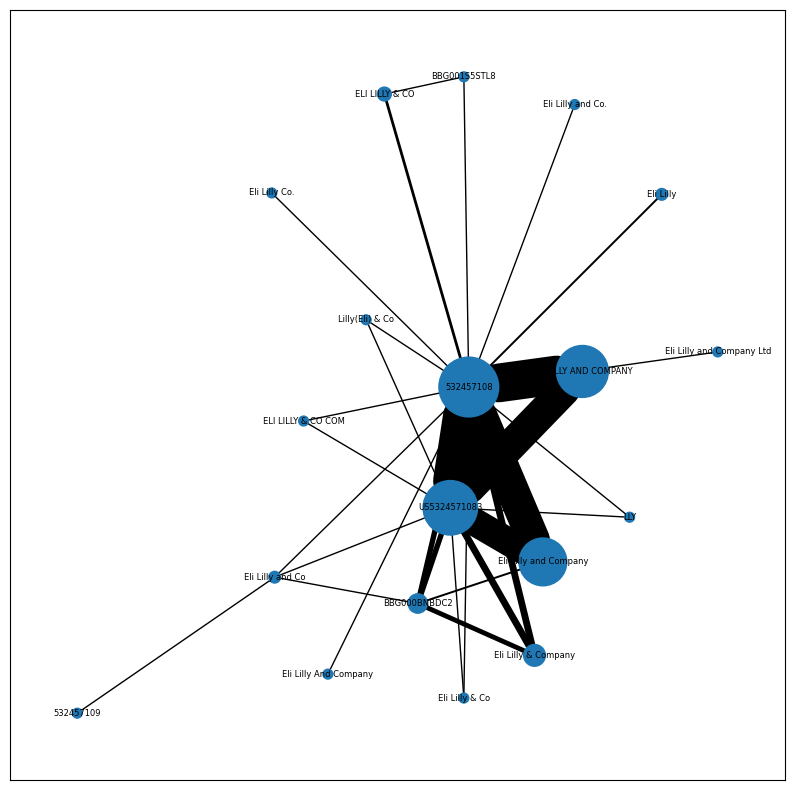

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


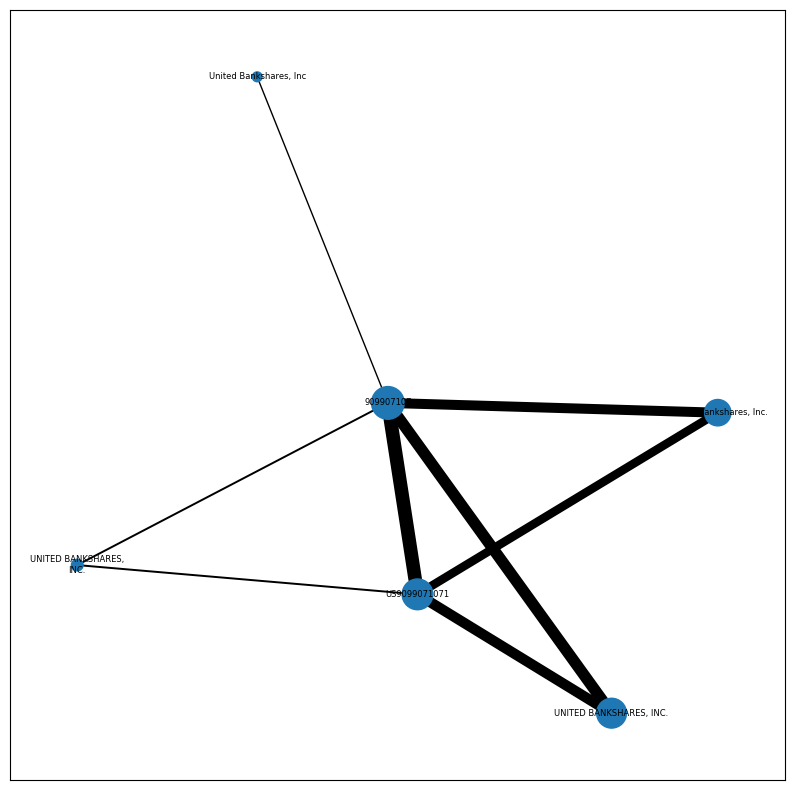

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


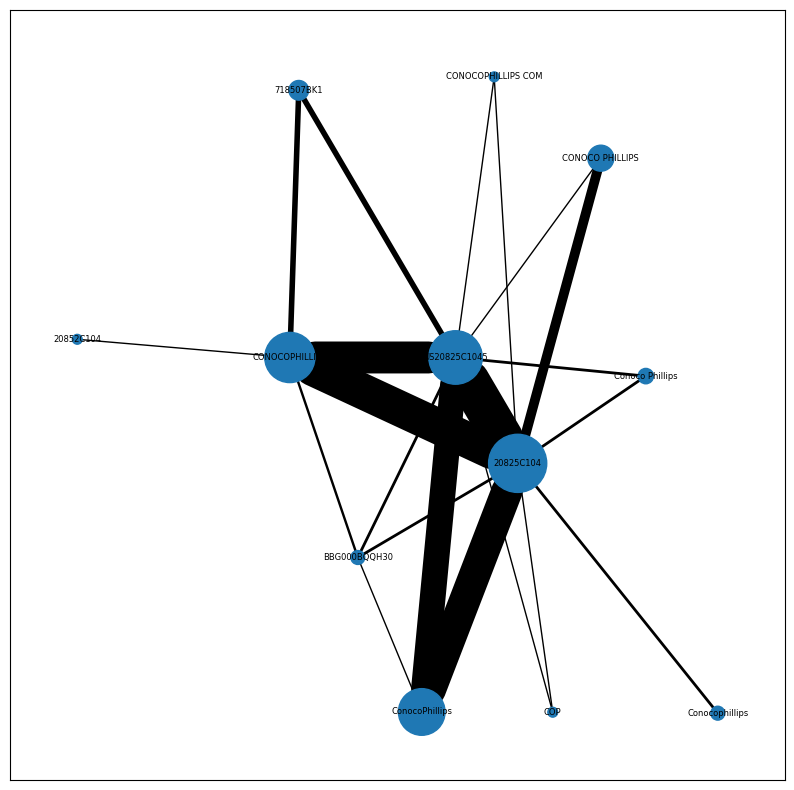

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


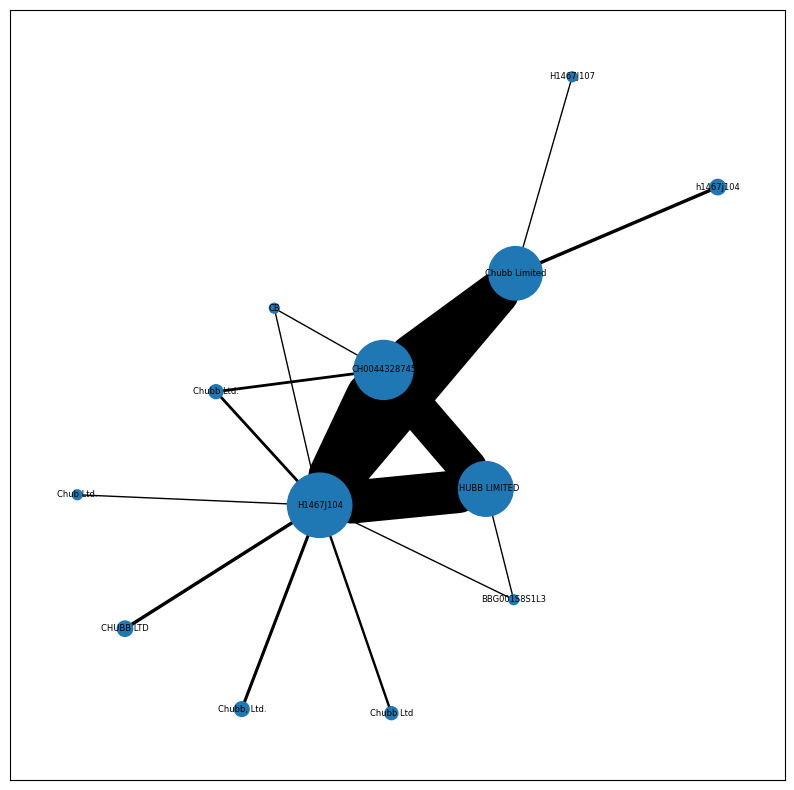

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


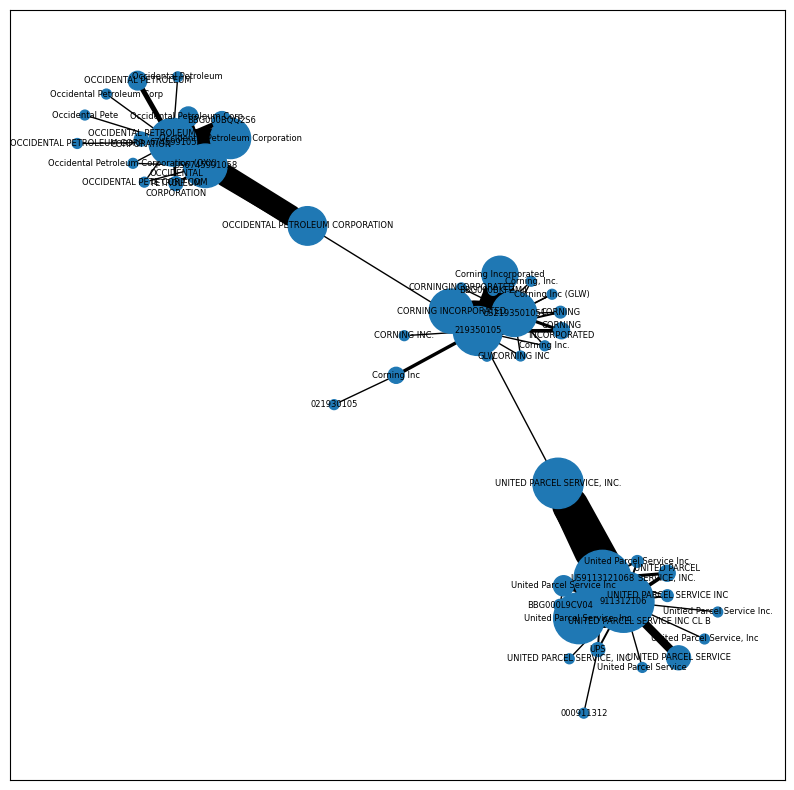

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


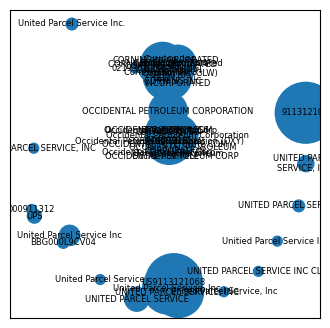

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


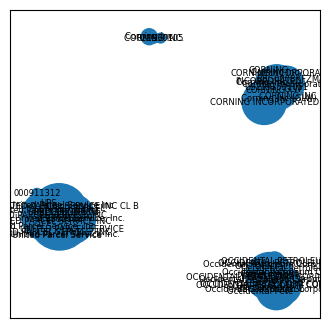

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.0 ----------------------------------------------------------------------------------------------------


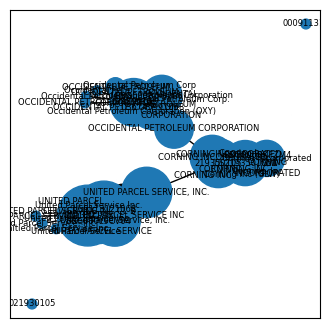

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


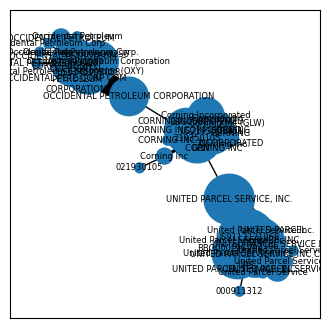

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.586 ----------------------------------------------------------------------------------------------------


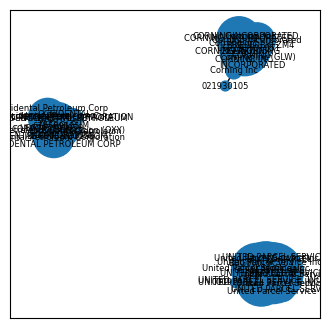

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.0, 'spectral_clustering': 0, 'louvain': 0.5861405392125988}
best_method='louvain'


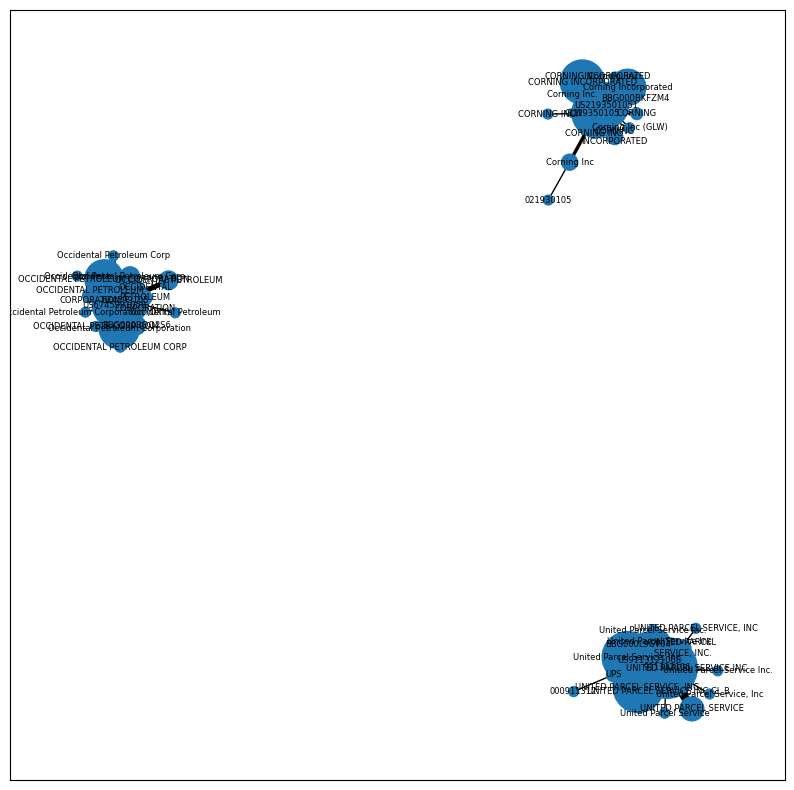

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


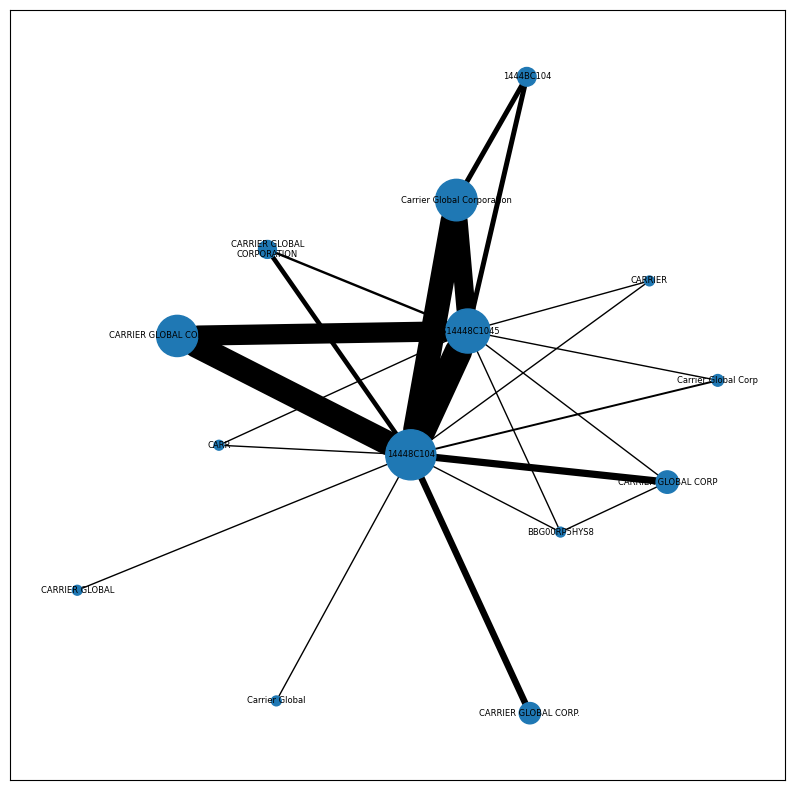

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


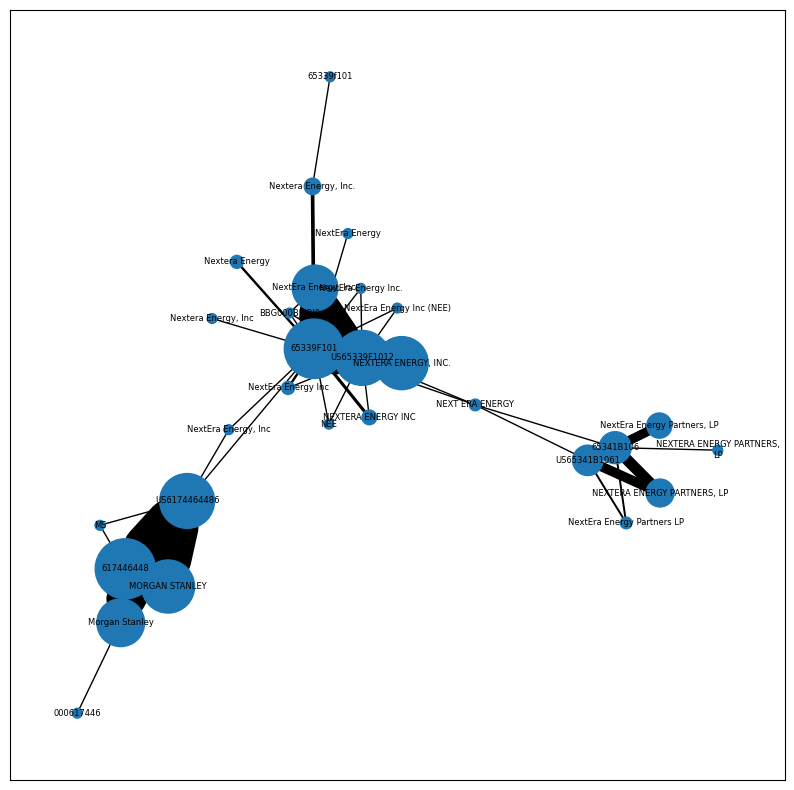

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


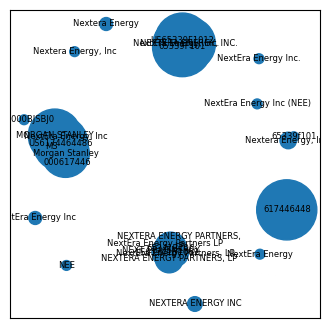

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


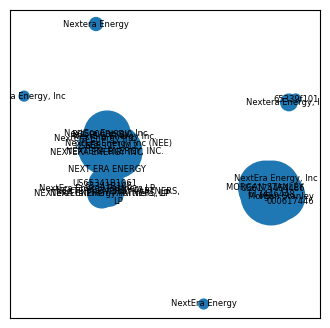

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.081 ----------------------------------------------------------------------------------------------------


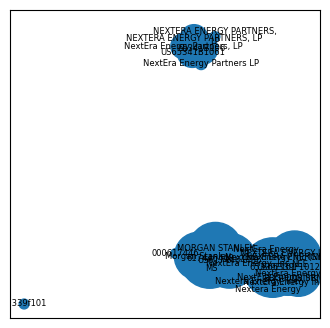

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


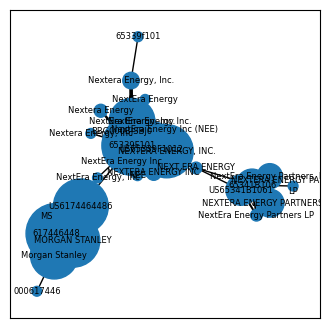

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.54 ----------------------------------------------------------------------------------------------------


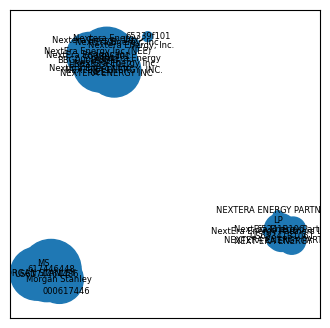

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.08058705290018353, 'spectral_clustering': 0, 'louvain': 0.5396013870917654}
best_method='louvain'


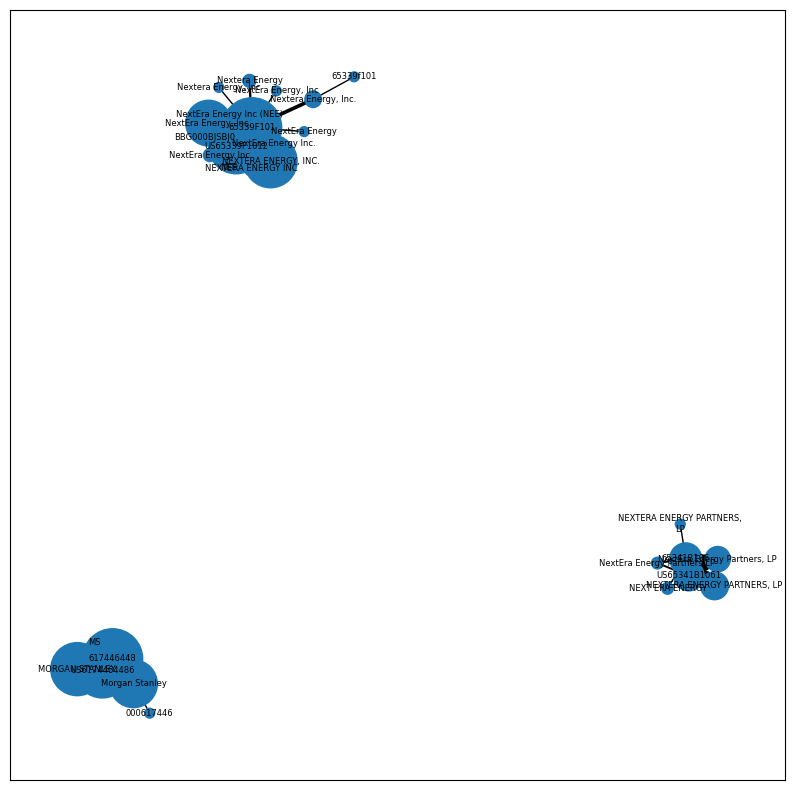

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


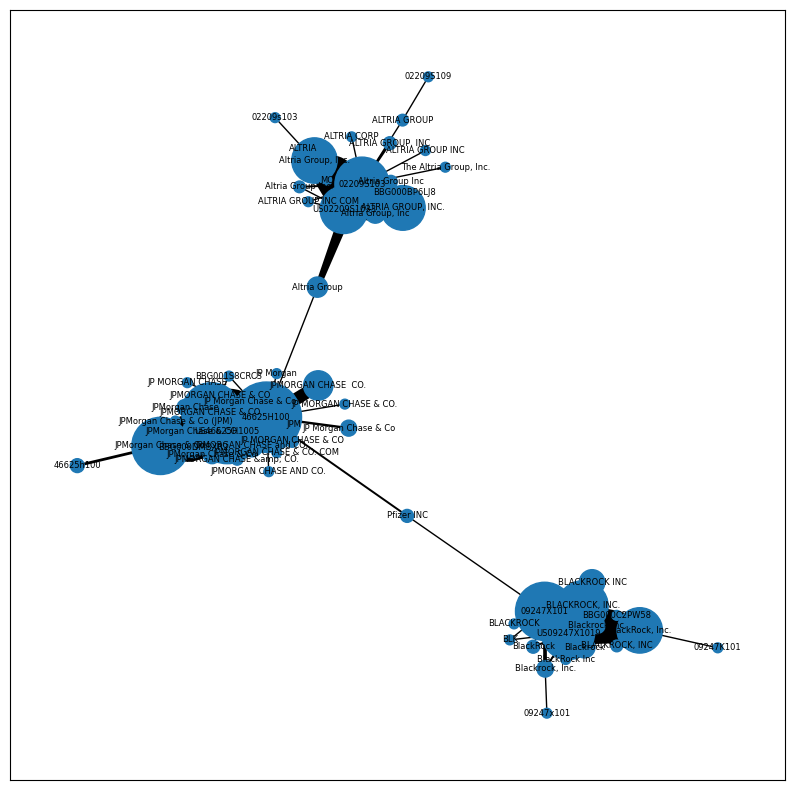

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


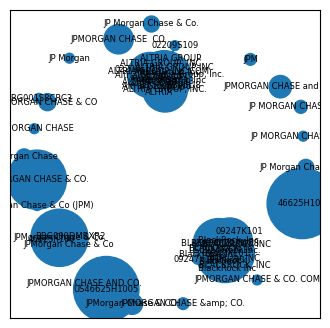

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


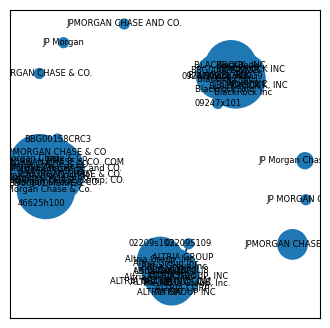

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.378 ----------------------------------------------------------------------------------------------------


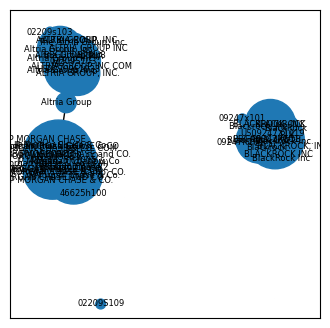

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


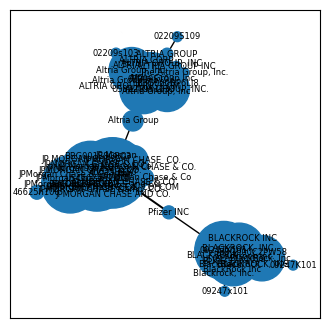

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.578 ----------------------------------------------------------------------------------------------------


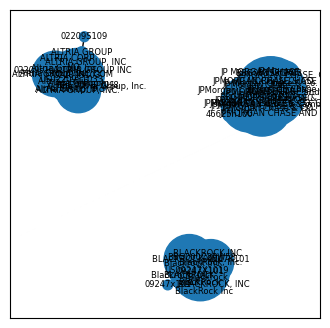

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.3782974991882606, 'spectral_clustering': 0, 'louvain': 0.5779210140796102}
best_method='louvain'


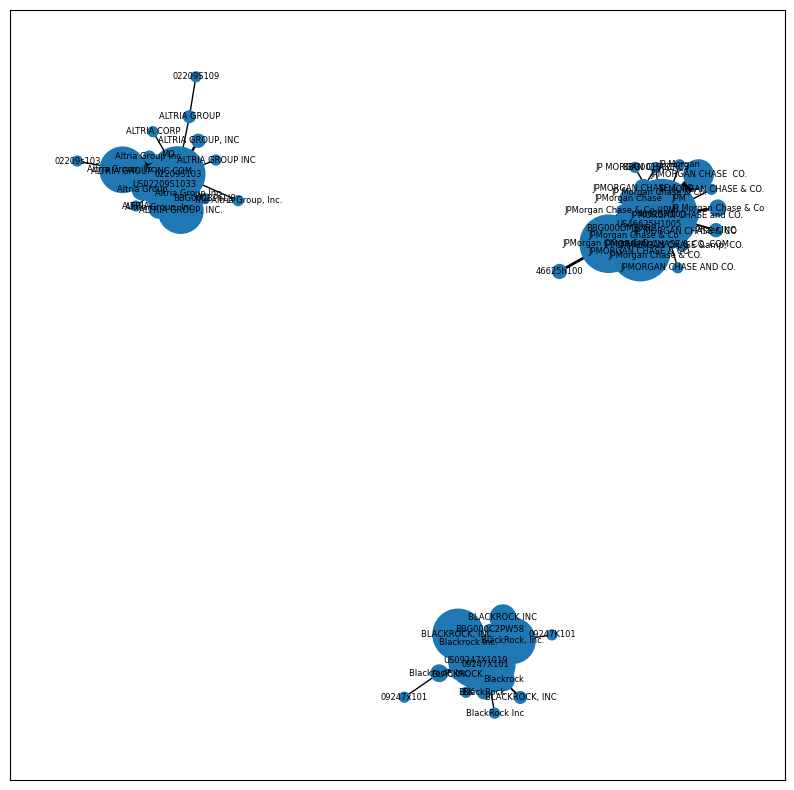

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


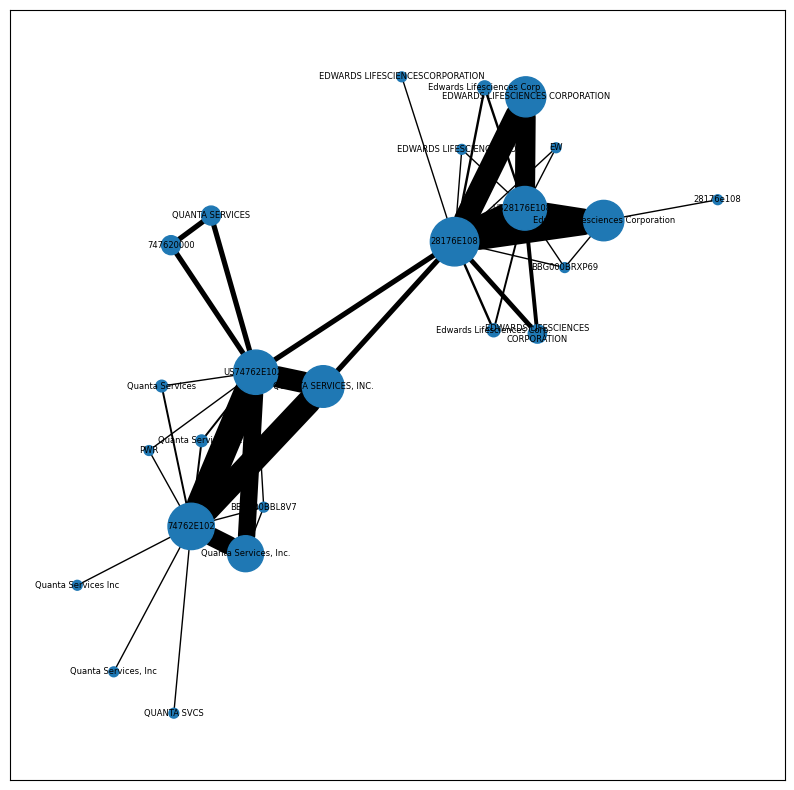

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


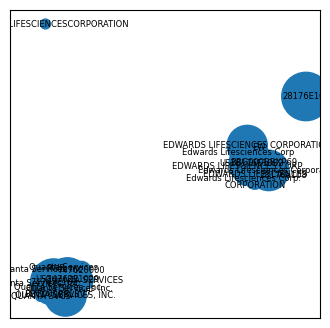

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


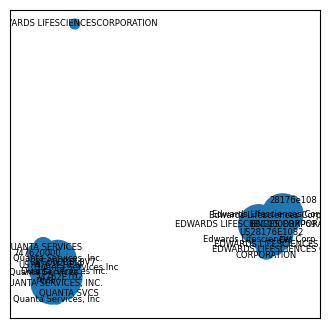

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.0 ----------------------------------------------------------------------------------------------------


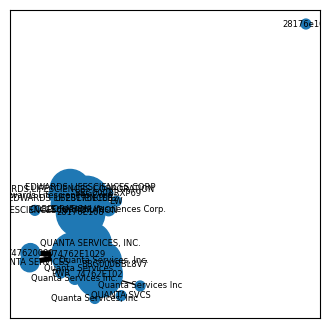

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


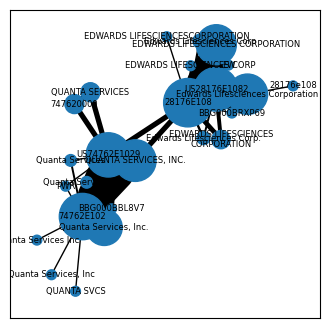

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0.5 ----------------------------------------------------------------------------------------------------


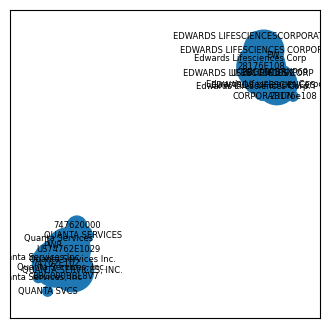

method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.0, 'spectral_clustering': 0, 'louvain': 0.49991465842260063}
best_method='louvain'


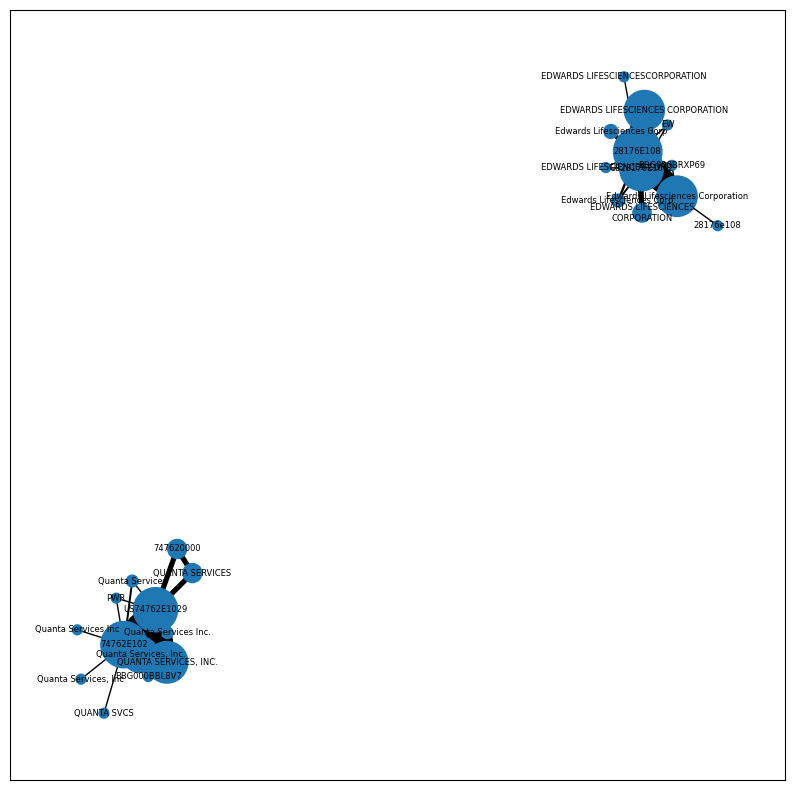

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


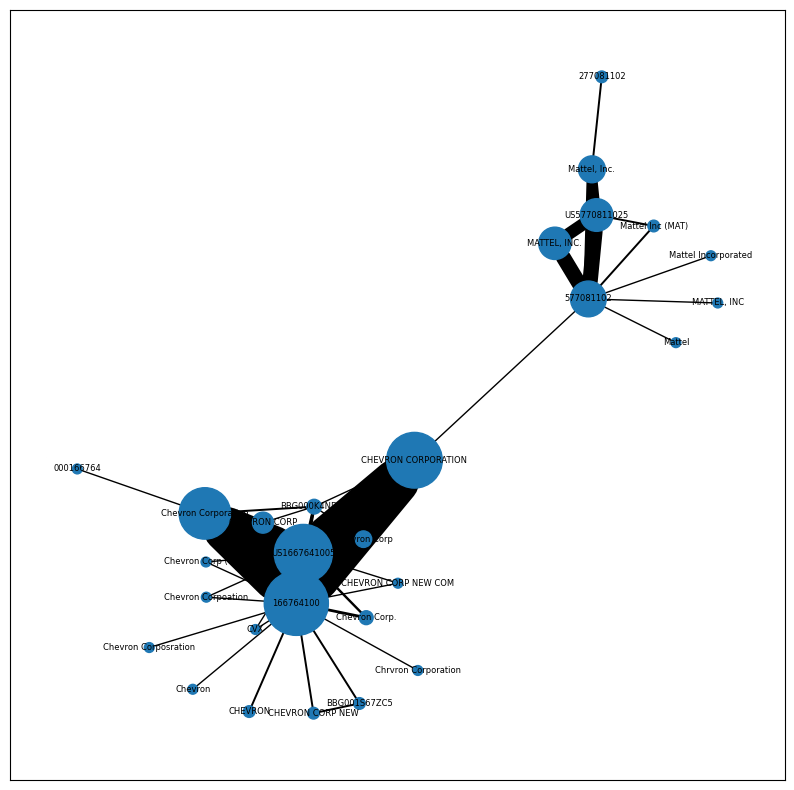

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


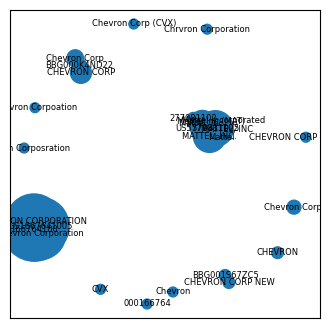

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


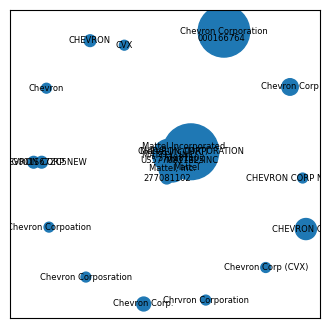

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0.0 ----------------------------------------------------------------------------------------------------


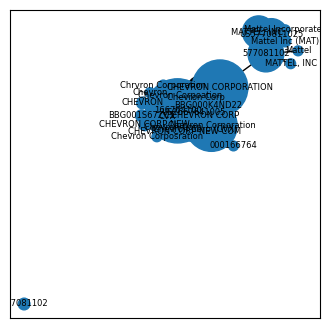

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


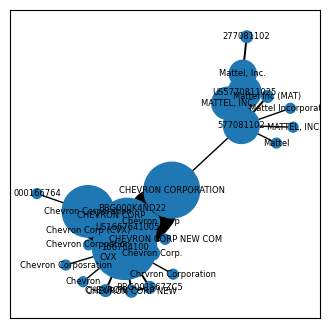

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0 ----------------------------------------------------------------------------------------------------


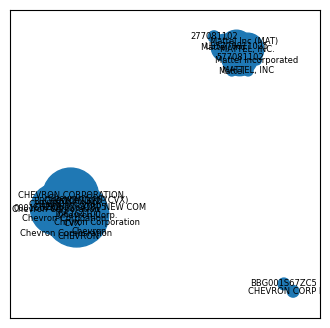

/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:343: UserWarning: Returning unmodified graph, because `best_score` == 0
k=2
best_score=0
method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0.0, 'spectral_clustering': 0, 'louvain': 0}
  warn(warning_str)


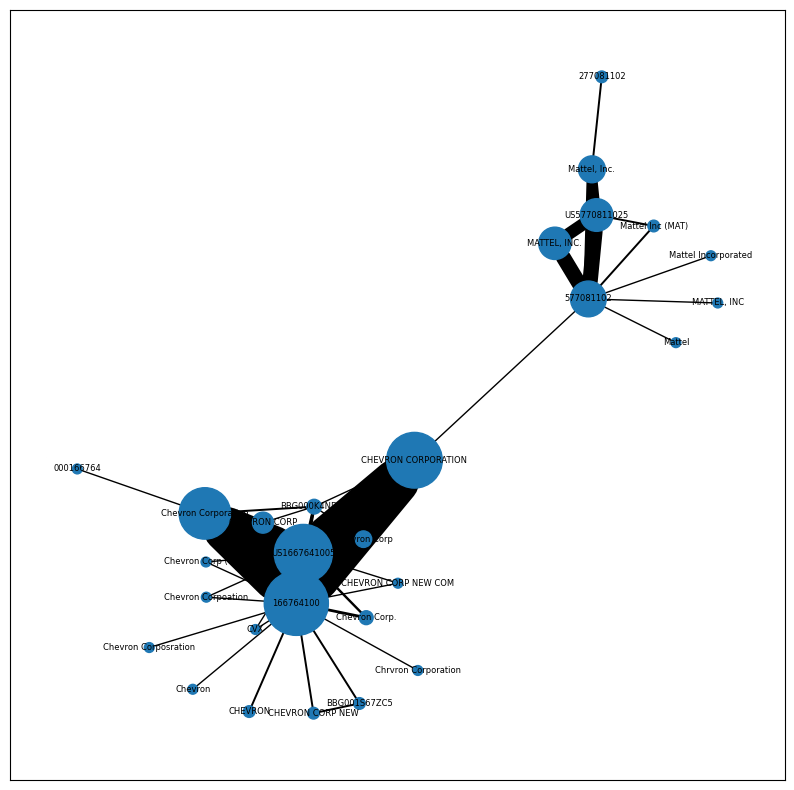

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


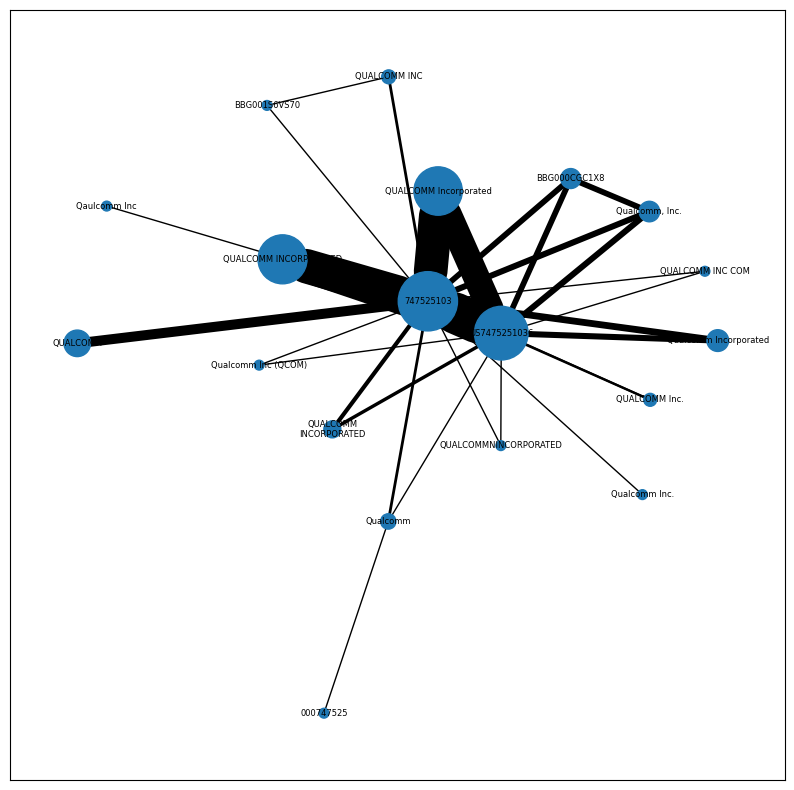

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


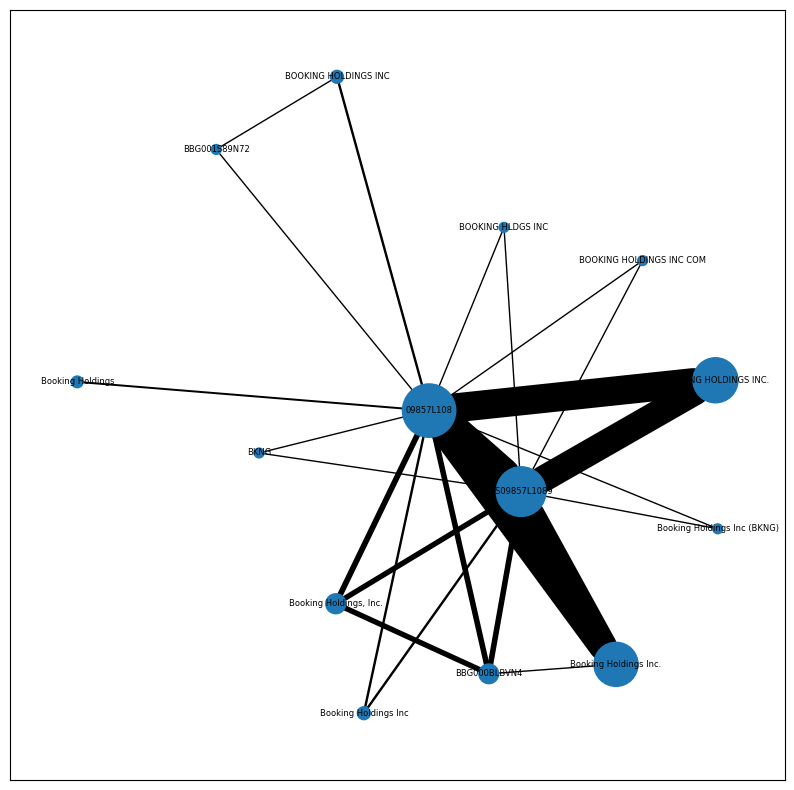

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


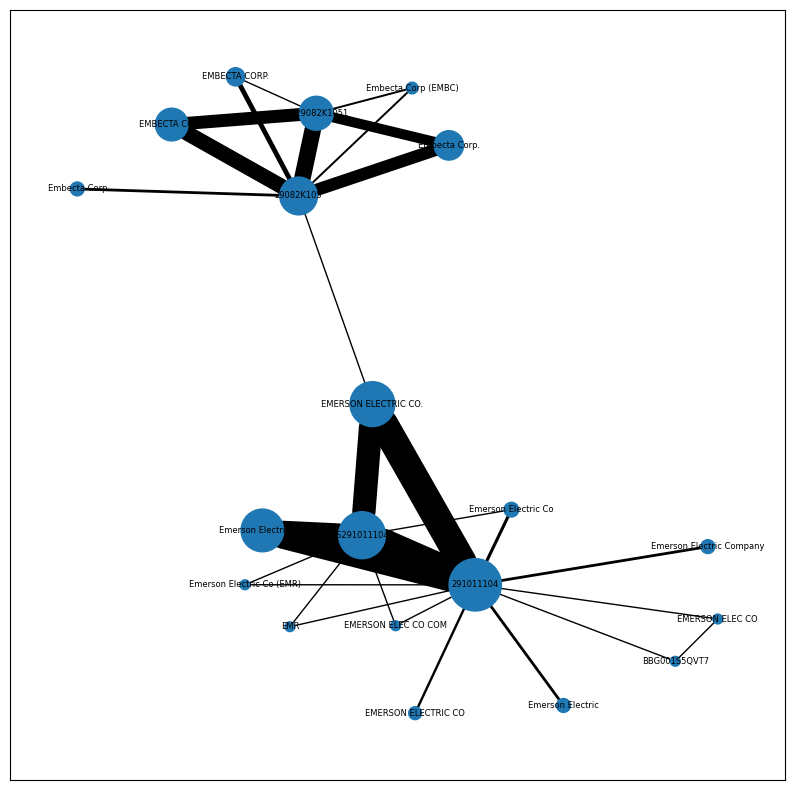

---------------------------------------------------------------------------------------------------- kmeans ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- kmeans score = 0 ----------------------------------------------------------------------------------------------------


/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:142: UserWarning: `kmeans` does not produce good results -- it mixes labels within clusters.
  warn("`kmeans` does not produce good results -- it mixes labels within clusters.")


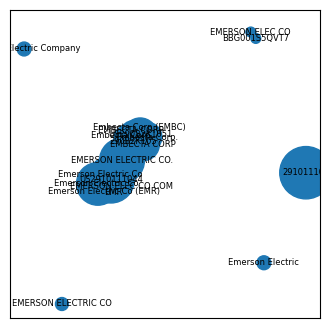

---------------------------------------------------------------------------------------------------- betweenness_centrality ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- betweenness_centrality score = 0 ----------------------------------------------------------------------------------------------------


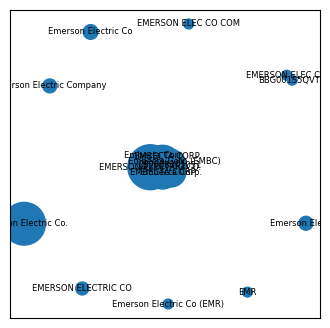

---------------------------------------------------------------------------------------------------- articulation_points ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- articulation_points score = 0 ----------------------------------------------------------------------------------------------------


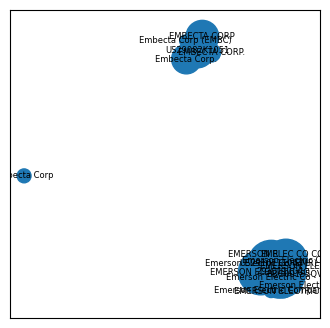

---------------------------------------------------------------------------------------------------- spectral_clustering ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- spectral_clustering score = 0 ----------------------------------------------------------------------------------------------------


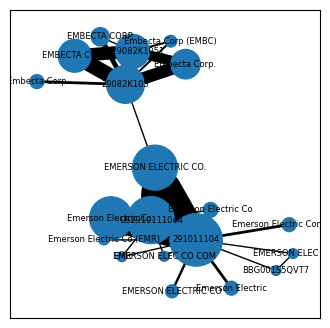

---------------------------------------------------------------------------------------------------- louvain ----------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------- louvain score = 0 ----------------------------------------------------------------------------------------------------


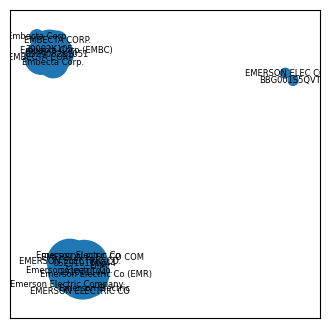

/Users/mgaster/repos/record-consolidation/src/record_consolidation/subgraph_post_processing/specific_algs/partition_companies.py:343: UserWarning: Returning unmodified graph, because `best_score` == 0
k=2
best_score=0
method_scores={'kmeans': 0, 'betweenness_centrality': 0, 'articulation_points': 0, 'spectral_clustering': 0, 'louvain': 0}
  warn(warning_str)


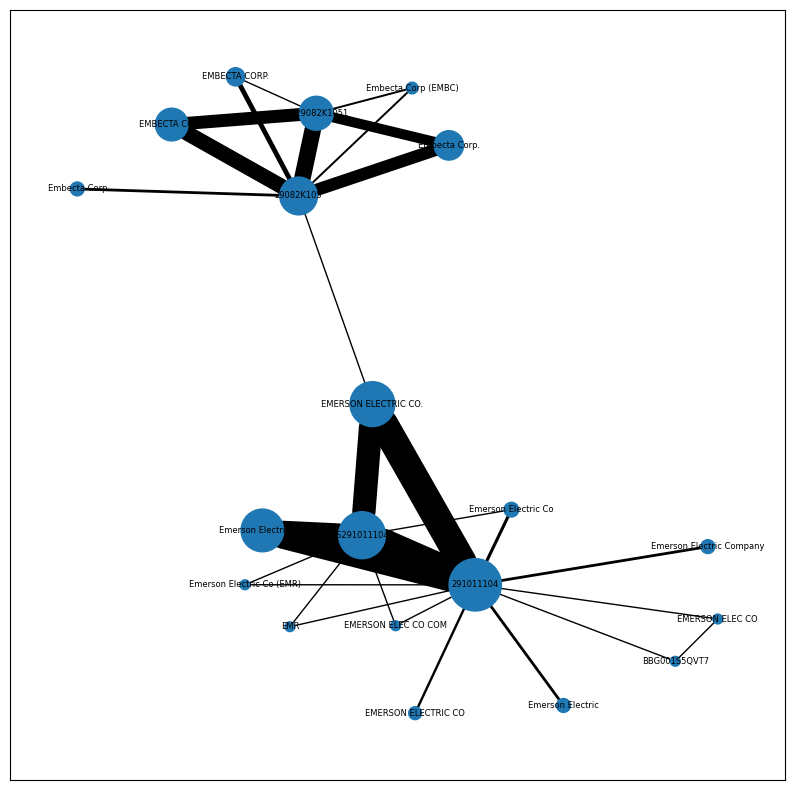

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


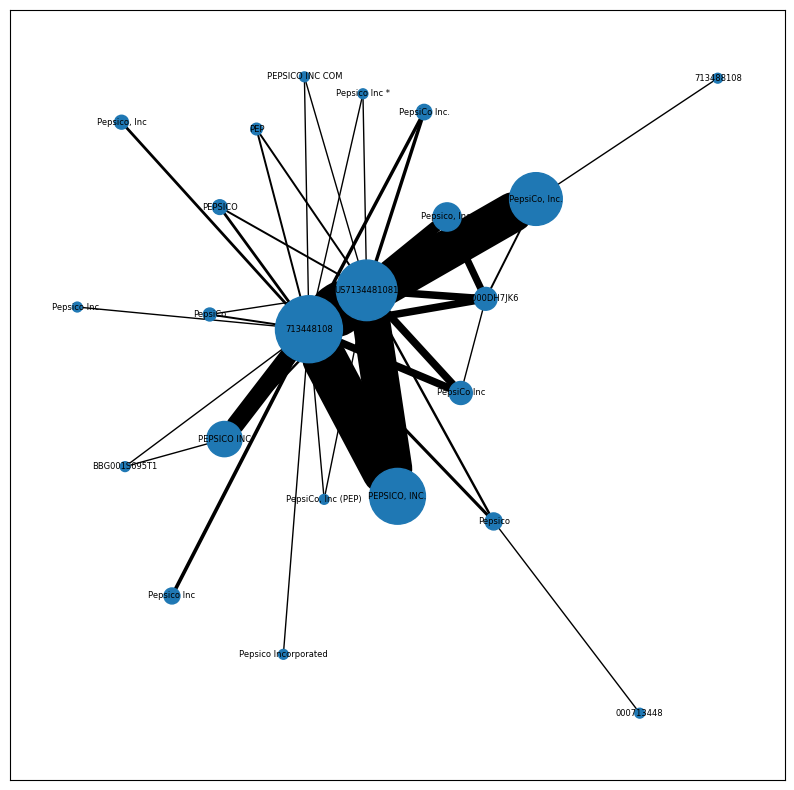

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


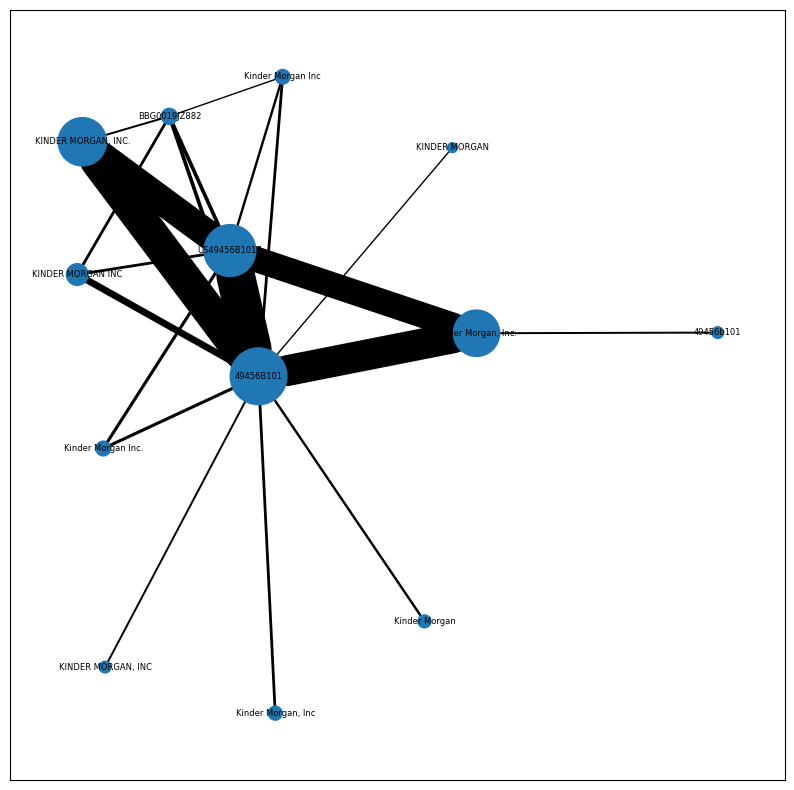

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


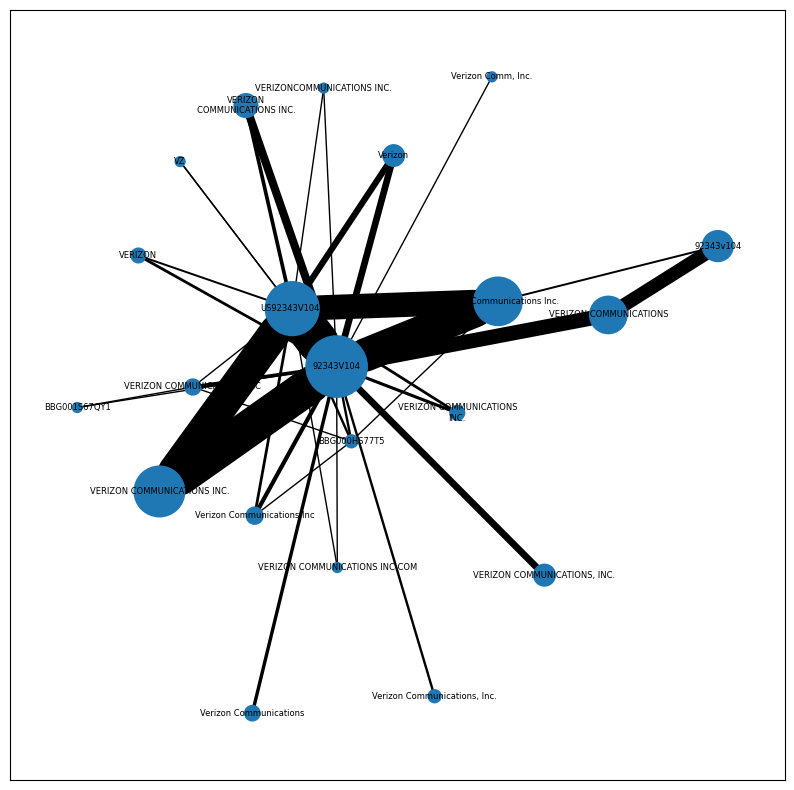

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


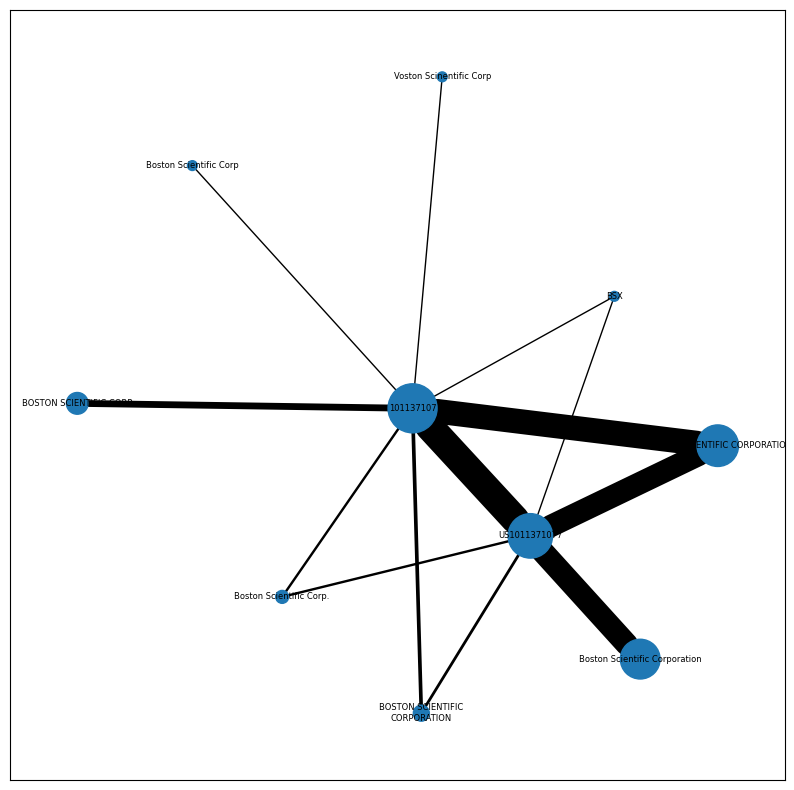

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


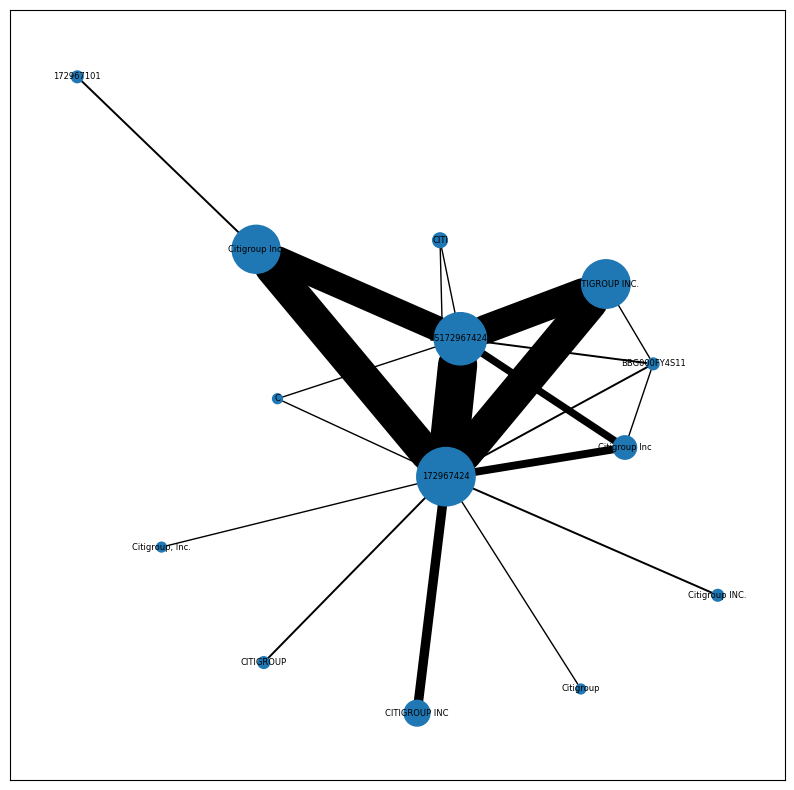

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


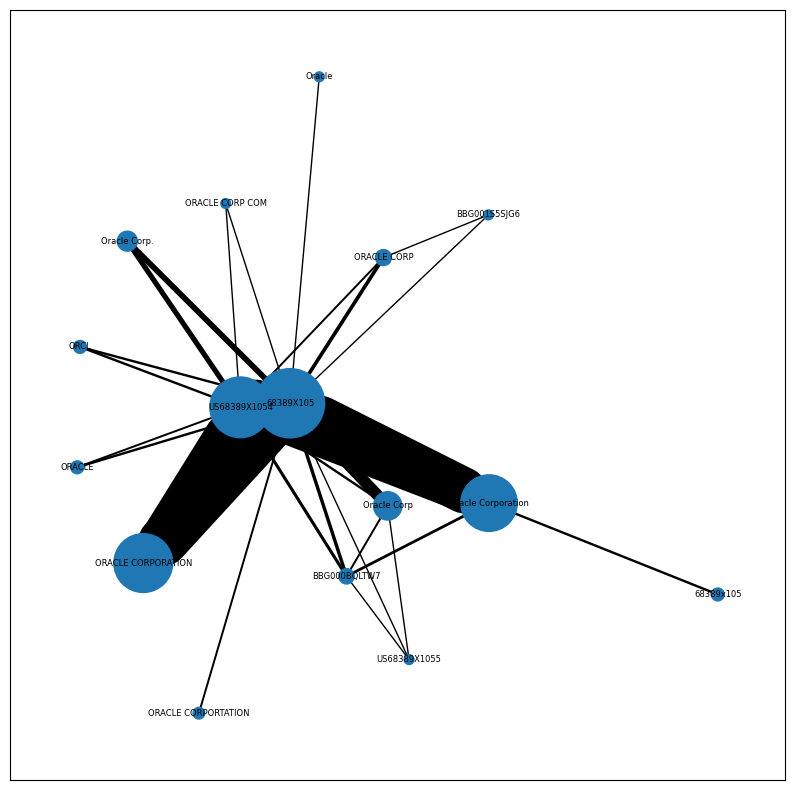

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


KeyboardInterrupt: 

<Figure size 1000x1000 with 0 Axes>

In [11]:
for subg in unprocessed_subgraphs:
    print("%" * 200)
    partition_companies_graph_where_necessary(
        subg, "n_0val_eigeinvalues", "betweenness_centrality", verbose_within_partitioning_algs=False
    )